<a href="https://colab.research.google.com/github/Khyati-01-sahu/fraud-risk-scoring/blob/main/Fraud_Detection_Transactions_Insights.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
barkataliarbab_fraud_detection_transactions_path = kagglehub.dataset_download('barkataliarbab/fraud-detection-transactions')

print('Data source import complete.')


Using Colab cache for faster access to the 'fraud-detection-transactions' dataset.
Data source import complete.


In [21]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv


In [22]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv')

# Stickers (emojis)
detective = "🔍"
credit_card = "💳"
warning = "⚠️"
chart = "📊"
lock = "🔒"

# Introduction
print(f"{detective} Welcome to the Fraud Detection Challenge! {detective}")
print("In the fast-paced world of digital transactions, fraudsters lurk in the shadows, trying to outsmart security systems.")
print("We're using data science to shine a light on suspicious activities and protect innocent users.")
print(f"{credit_card} Join us on this exciting journey to build a robust fraud detection model! {credit_card}\n")

# Problem Framing
print(f"{warning} Problem Framing: {warning}")
print("This is a binary classification problem where we aim to predict whether a financial transaction is fraudulent or legitimate.")
print("Our goal: Develop a machine learning model that accurately identifies fraudulent transactions to minimize financial losses and enhance security.")
print("Key challenges include handling imbalanced classes (since fraud is rare), feature engineering from transactional data, and ensuring real-time applicability.")
print(f"Success metric: High recall for fraud cases (catch as many frauds as possible) while maintaining good precision to avoid false alarms.\n")

# Proper Description of the Dataset
print(f"{chart} Dataset Description: {chart}")
print("The 'Fraud Detection Transactions Dataset' is a comprehensive collection of financial transaction records designed for fraud analysis.")
print(f"Shape: {df.shape[0]} rows (transactions) and {df.shape[1]} columns (features).")
print("Key Columns:")
print("- Transaction_ID: Unique identifier for each transaction.")
print("- User_ID: Identifier for the user performing the transaction.")
print("- Transaction_Amount: The monetary value of the transaction (mean: {:.2f}, range: 0 to {:.2f}).".format(df['Transaction_Amount'].mean(), df['Transaction_Amount'].max()))
print("- Transaction_Type: Type of transaction (e.g., POS, Online, ATM Withdrawal, Bank Transfer).")
print("- Timestamp: Date and time of the transaction.")
print("- Account_Balance: User's account balance at the time of transaction.")
print("- Device_Type: Device used (e.g., Mobile, Tablet, Laptop).")
print("- Location: Geographic location (e.g., Sydney, New York, Mumbai, London, Tokyo).")
print("- Merchant_Category: Category of the merchant (e.g., Travel, Clothing, Restaurants, Electronics, Groceries).")
print("- IP_Address_Flag: Flag indicating suspicious IP (0 or 1).")
print("- Previous_Fraudulent_Activity: Flag for prior fraud (0 or 1).")
print("- Daily_Transaction_Count: Number of transactions in the day.")
print("- Avg_Transaction_Amount_7d: Average amount over the past 7 days.")
print("- Failed_Transaction_Count_7d: Number of failed transactions in past 7 days.")
print("- Card_Type: Type of card used (e.g., Visa, Mastercard, Amex, Discover).")
print("- Card_Age: Age of the card in days.")
print("- Transaction_Distance: Distance from user's typical location.")
print("- Authentication_Method: Method used (e.g., Password, OTP, Biometric, PIN).")
print("- Risk_Score: Calculated risk score (0 to 1).")
print("- Is_Weekend: Flag if transaction is on weekend (0 or 1).")
print("- Fraud_Label: Target variable (0: Legitimate, 1: Fraudulent).")
print(f"Fraud Distribution: {lock} Legitimate: {df['Fraud_Label'].value_counts(normalize=True)[0]*100:.2f}%, Fraudulent: {df['Fraud_Label'].value_counts(normalize=True)[1]*100:.2f}% {lock}")
print("This dataset provides a rich set of features including behavioral, locational, and historical data, making it ideal for training supervised learning models like logistic regression, random forests, or neural networks.")
print(f"{detective} Let's dive in and catch those fraudsters! {detective}")

🔍 Welcome to the Fraud Detection Challenge! 🔍
In the fast-paced world of digital transactions, fraudsters lurk in the shadows, trying to outsmart security systems.
We're using data science to shine a light on suspicious activities and protect innocent users.
💳 Join us on this exciting journey to build a robust fraud detection model! 💳

⚠️ Problem Framing: ⚠️
This is a binary classification problem where we aim to predict whether a financial transaction is fraudulent or legitimate.
Our goal: Develop a machine learning model that accurately identifies fraudulent transactions to minimize financial losses and enhance security.
Key challenges include handling imbalanced classes (since fraud is rare), feature engineering from transactional data, and ensuring real-time applicability.
Success metric: High recall for fraud cases (catch as many frauds as possible) while maintaining good precision to avoid false alarms.

📊 Dataset Description: 📊
The 'Fraud Detection Transactions Dataset' is a com

In [23]:
import pandas as pd
import numpy as np

# ────────────────────────────────────────────────
#  STEP 1: Load the dataset
# ────────────────────────────────────────────────
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

print(f"\nDataset shape: {df.shape}  ({df.shape[0]:,} rows × {df.shape[1]} columns)")
print("-" * 70)

# ────────────────────────────────────────────────
#  STEP 2: Basic Information & Data Types
# ────────────────────────────────────────────────
print("\n1. DataFrame Info")
print("-" * 70)
df.info()

print("\nMemory usage: {:.1f} MB".format(df.memory_usage(deep=True).sum() / 1024**2))

# ────────────────────────────────────────────────
#  STEP 3: Missing Values Check
# ────────────────────────────────────────────────
print("\n2. Missing Values Summary")
print("-" * 70)
missing = df.isnull().sum()
missing_percent = (missing / len(df)) * 100

missing_df = pd.DataFrame({
    'Missing Count': missing,
    'Missing %': missing_percent.round(3)
}).sort_values('Missing Count', ascending=False)

print(missing_df[missing_df['Missing Count'] > 0])
if missing.sum() == 0:
    print("→ Great! No missing values found in the dataset.")

# ────────────────────────────────────────────────
#  STEP 4: Basic Statistical Summary
# ────────────────────────────────────────────────
print("\n3. Numerical Features - Descriptive Statistics")
print("-" * 70)
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
print(df[num_cols].describe().round(2).T)

print("\n4. Categorical Features - Value Counts (Top 5)")
print("-" * 70)
cat_cols = df.select_dtypes(include=['object']).columns

for col in cat_cols:
    print(f"\n→ {col}")
    print(df[col].value_counts(dropna=False).head(8))
    print()

# ────────────────────────────────────────────────
#  STEP 5: Target Variable Distribution
# ────────────────────────────────────────────────
print("\n5. Target Variable (Fraud_Label) Distribution")
print("-" * 70)
fraud_dist = df['Fraud_Label'].value_counts()
fraud_pct  = df['Fraud_Label'].value_counts(normalize=True) * 100

print(pd.DataFrame({
    'Count': fraud_dist,
    '%': fraud_pct.round(2)
}).rename(index={0: 'Legitimate (0)', 1: 'Fraud (1)'}))

imbalance_ratio = fraud_dist[0] / fraud_dist[1]
print(f"\n→ Class Imbalance Ratio (Legit : Fraud) ≈ {imbalance_ratio:.1f} : 1")

# ────────────────────────────────────────────────
#  STEP 6: Data Cleaning & Preprocessing Decisions
# ────────────────────────────────────────────────
print("\n6. Cleaning & Preprocessing Plan")
print("-" * 70)
print("Based on inspection above, we usually do the following:")

cleaning_steps = [
    "1. Convert Timestamp → datetime",
    "2. Extract useful datetime features: hour, day, weekday, is_night (e.g. 22-06)",
    "3. Check & handle outliers in Transaction_Amount, Transaction_Distance, Risk_Score",
    "4. Encode categorical variables: Transaction_Type, Device_Type, Location, Merchant_Category, Card_Type, Authentication_Method",
    "5. (Optional) Create distance-based features or deviation from user's avg amount",
    "6. No missing values → no imputation needed",
    "7. Feature scaling not strictly required for tree-based models, but good for logistic regression / neural nets",
    "8. Consider undersampling / oversampling / class_weight for modeling due to imbalance"
]

for i, step in enumerate(cleaning_steps, 1):
    print(f"   {i}. {step}")

print("\nNext recommended steps:")
print("   • Feature engineering notebook/cell")
print("   • EDA visualizations (amount distribution, fraud by location, time patterns, etc.)")
print("   • Model selection & evaluation with proper fraud-focused metrics (Recall, Precision, F1, PR-AUC)")

print("\n" + "="*70)
print("Ready for EDA & Feature Engineering! 🚀")
print("="*70)

Loading dataset...

Dataset shape: (50000, 21)  (50,000 rows × 21 columns)
----------------------------------------------------------------------

1. DataFrame Info
----------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Transaction_ID                50000 non-null  object 
 1   User_ID                       50000 non-null  object 
 2   Transaction_Amount            50000 non-null  float64
 3   Transaction_Type              50000 non-null  object 
 4   Timestamp                     50000 non-null  object 
 5   Account_Balance               50000 non-null  float64
 6   Device_Type                   50000 non-null  object 
 7   Location                      50000 non-null  object 
 8   Merchant_Category             50000 non-null  object 
 9   I

In [24]:
df=pd.read_csv('/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv')
df

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Timestamp,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,...,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
0,TXN_33553,USER_1834,39.79,POS,2023-08-14 19:30:00,93213.17,Laptop,Sydney,Travel,0,...,7,437.63,3,Amex,65,883.17,Biometric,0.8494,0,0
1,TXN_9427,USER_7875,1.19,Bank Transfer,2023-06-07 04:01:00,75725.25,Mobile,New York,Clothing,0,...,13,478.76,4,Mastercard,186,2203.36,Password,0.0959,0,1
2,TXN_199,USER_2734,28.96,Online,2023-06-20 15:25:00,1588.96,Tablet,Mumbai,Restaurants,0,...,14,50.01,4,Visa,226,1909.29,Biometric,0.8400,0,1
3,TXN_12447,USER_2617,254.32,ATM Withdrawal,2023-12-07 00:31:00,76807.20,Tablet,New York,Clothing,0,...,8,182.48,4,Visa,76,1311.86,OTP,0.7935,0,1
4,TXN_39489,USER_2014,31.28,POS,2023-11-11 23:44:00,92354.66,Mobile,Mumbai,Electronics,0,...,14,328.69,4,Mastercard,140,966.98,Password,0.3819,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,TXN_11284,USER_4796,45.05,Online,2023-01-29 18:38:00,76960.11,Mobile,Tokyo,Clothing,0,...,2,389.00,3,Amex,98,1537.54,PIN,0.1493,1,0
49996,TXN_44732,USER_1171,126.15,POS,2023-05-09 08:55:00,28791.75,Mobile,Tokyo,Clothing,0,...,13,434.95,4,Visa,93,2555.72,Biometric,0.3653,0,1
49997,TXN_38158,USER_2510,72.02,Online,2023-01-30 19:32:00,29916.41,Laptop,Mumbai,Clothing,0,...,1,369.15,2,Visa,114,4686.59,Biometric,0.5195,0,0
49998,TXN_860,USER_2248,64.89,Bank Transfer,2023-03-09 19:47:00,67895.67,Mobile,Tokyo,Electronics,0,...,13,242.29,4,Discover,72,4886.92,Biometric,0.7063,0,1


Generating key histograms...



/tmp/ipykernel_1236/1466535980.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Class')


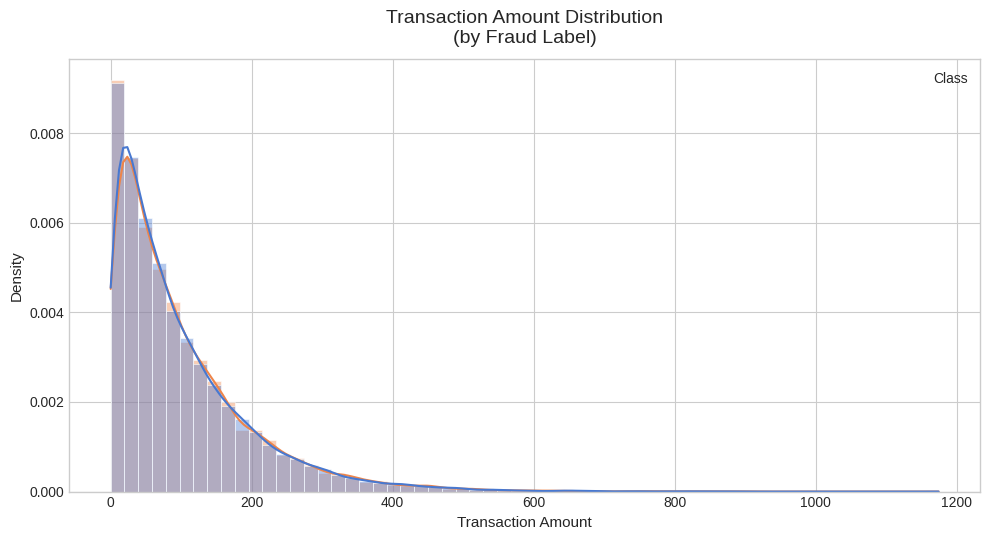

→ Transaction Amount: fraud often shows different shape / tail behavior


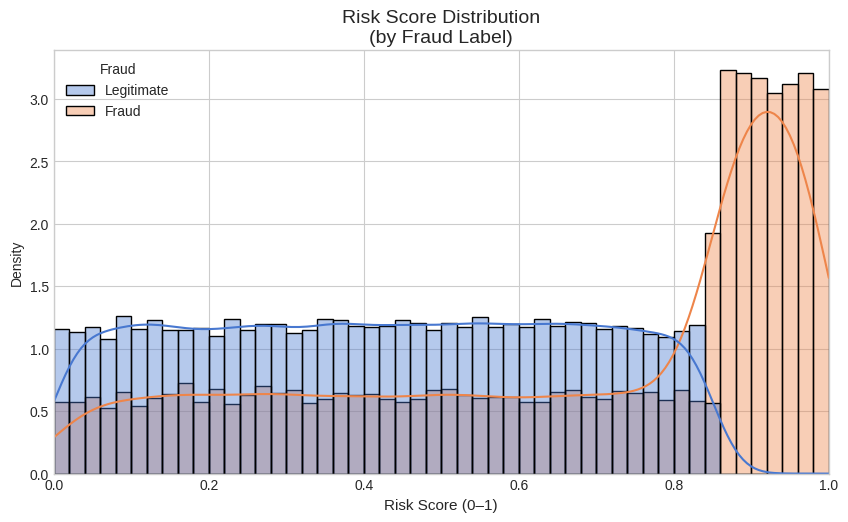

→ Risk Score: should show very strong separation (if well engineered)


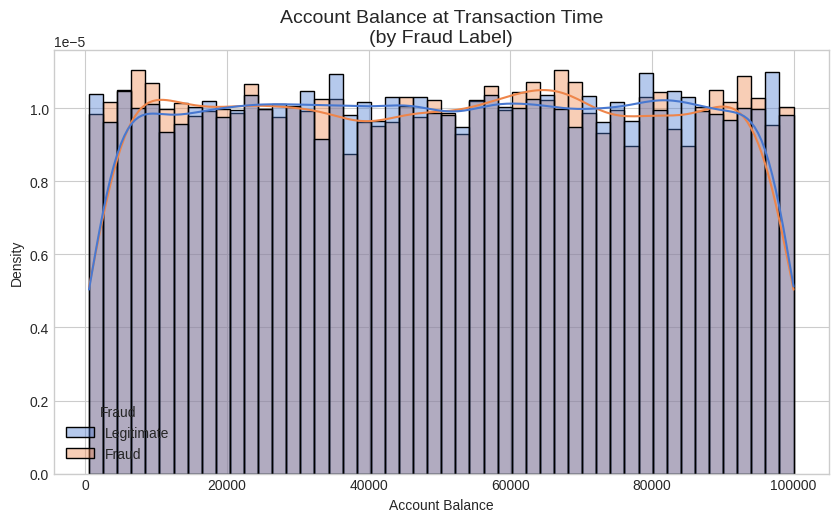

→ Low balance sometimes correlates with fraud (card testing / stolen cards)


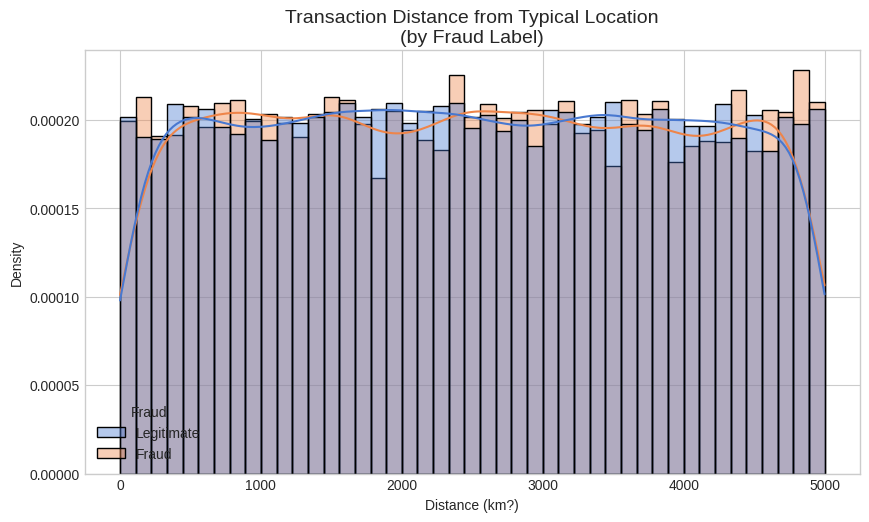

→ High distance is a classic fraud signal


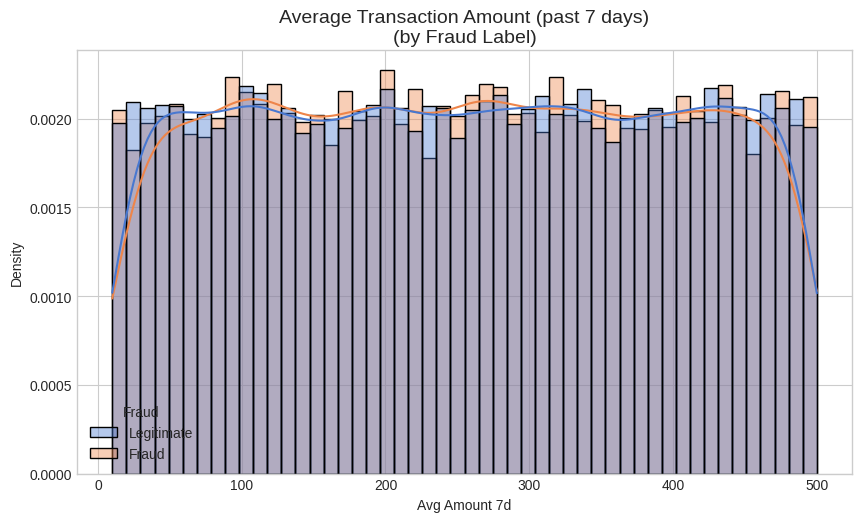

→ Sudden change from usual behavior often flags fraud


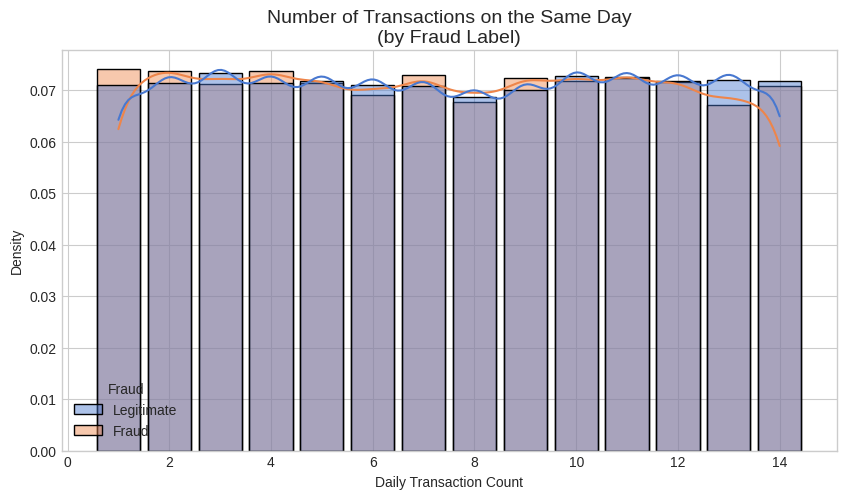

→ High daily count → possible card testing / account takeover


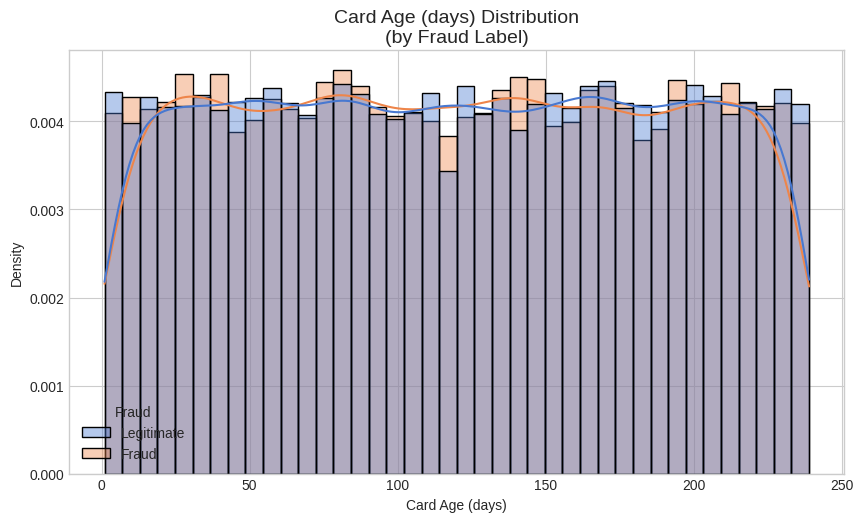

→ Very new cards sometimes more likely to be fraud / stolen

──────────────────────────────────────────────────────────────────────
Key observations to look for:
• Separation / different peaks between fraud & legitimate
• Long right tails in fraud class (especially amount & distance)
• Different variance / spread
• Whether KDE curves cross or are clearly separated
──────────────────────────────────────────────────────────────────────


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (10, 5.5)

# ────────────────────────────────────────────────
#  Load data (change path if needed)
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

# Quick target mapping for nicer legend
df['Fraud'] = df['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

print("Generating key histograms...\n")

# ────────────────────────────────────────────────
#  1. Transaction Amount (most important feature usually)
# ────────────────────────────────────────────────
plt.figure()
sns.histplot(
    data=df, x='Transaction_Amount', hue='Fraud',
    kde=True, stat='density', common_norm=False,
    bins=60, alpha=0.4, edgecolor='white', linewidth=0.4
)
plt.title('Transaction Amount Distribution\n(by Fraud Label)', fontsize=14, pad=12)
plt.xlabel('Transaction Amount', fontsize=11)
plt.ylabel('Density', fontsize=11)
plt.legend(title='Class')
plt.tight_layout()
plt.show()

print("→ Transaction Amount: fraud often shows different shape / tail behavior")

# ────────────────────────────────────────────────
#  2. Risk Score
# ────────────────────────────────────────────────
plt.figure()
sns.histplot(
    data=df, x='Risk_Score', hue='Fraud',
    kde=True, stat='density', common_norm=False,
    bins=50, alpha=0.4
)
plt.title('Risk Score Distribution\n(by Fraud Label)', fontsize=14)
plt.xlabel('Risk Score (0–1)', fontsize=11)
plt.ylabel('Density')
plt.xlim(0, 1)
plt.show()

print("→ Risk Score: should show very strong separation (if well engineered)")

# ────────────────────────────────────────────────
#  3. Account Balance
# ────────────────────────────────────────────────
plt.figure()
sns.histplot(
    data=df, x='Account_Balance', hue='Fraud',
    kde=True, stat='density', common_norm=False,
    bins=50, alpha=0.4
)
plt.title('Account Balance at Transaction Time\n(by Fraud Label)', fontsize=14)
plt.xlabel('Account Balance')
plt.ylabel('Density')
plt.show()

print("→ Low balance sometimes correlates with fraud (card testing / stolen cards)")

# ────────────────────────────────────────────────
#  4. Transaction Distance
# ────────────────────────────────────────────────
plt.figure()
sns.histplot(
    data=df, x='Transaction_Distance', hue='Fraud',
    kde=True, stat='density', common_norm=False,
    bins=45, alpha=0.4
)
plt.title('Transaction Distance from Typical Location\n(by Fraud Label)', fontsize=14)
plt.xlabel('Distance (km?)')
plt.ylabel('Density')
plt.show()

print("→ High distance is a classic fraud signal")

# ────────────────────────────────────────────────
#  5. Avg Transaction Amount (last 7 days)
# ────────────────────────────────────────────────
plt.figure()
sns.histplot(
    data=df, x='Avg_Transaction_Amount_7d', hue='Fraud',
    kde=True, stat='density', common_norm=False,
    bins=50, alpha=0.4
)
plt.title('Average Transaction Amount (past 7 days)\n(by Fraud Label)', fontsize=14)
plt.xlabel('Avg Amount 7d')
plt.ylabel('Density')
plt.show()

print("→ Sudden change from usual behavior often flags fraud")

# ────────────────────────────────────────────────
#  6. Daily Transaction Count
# ────────────────────────────────────────────────
plt.figure(figsize=(10,5.2))
sns.histplot(
    data=df, x='Daily_Transaction_Count', hue='Fraud',
    kde=True, discrete=True, stat='density', common_norm=False,
    alpha=0.45, shrink=0.85
)
plt.title('Number of Transactions on the Same Day\n(by Fraud Label)', fontsize=14)
plt.xlabel('Daily Transaction Count')
plt.ylabel('Density')
plt.show()

print("→ High daily count → possible card testing / account takeover")

# ────────────────────────────────────────────────
#  Optional Bonus: Card Age
# ────────────────────────────────────────────────
plt.figure()
sns.histplot(
    data=df, x='Card_Age', hue='Fraud',
    kde=True, stat='density', common_norm=False,
    bins=40, alpha=0.4
)
plt.title('Card Age (days) Distribution\n(by Fraud Label)', fontsize=14)
plt.xlabel('Card Age (days)')
plt.ylabel('Density')
plt.show()

print("→ Very new cards sometimes more likely to be fraud / stolen")

print("\n" + "─"*70)
print("Key observations to look for:")
print("• Separation / different peaks between fraud & legitimate")
print("• Long right tails in fraud class (especially amount & distance)")
print("• Different variance / spread")
print("• Whether KDE curves cross or are clearly separated")
print("─"*70)

Generating important barplots & countplots for categorical features...

1. Countplots – Category Distributions



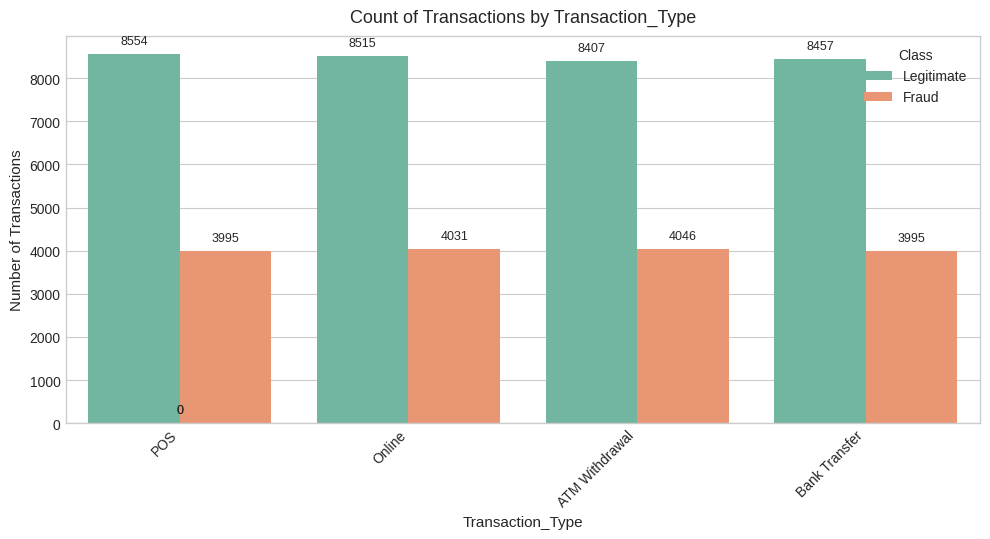

→ Transaction_Type: shows category frequencies + fraud proportion inside each


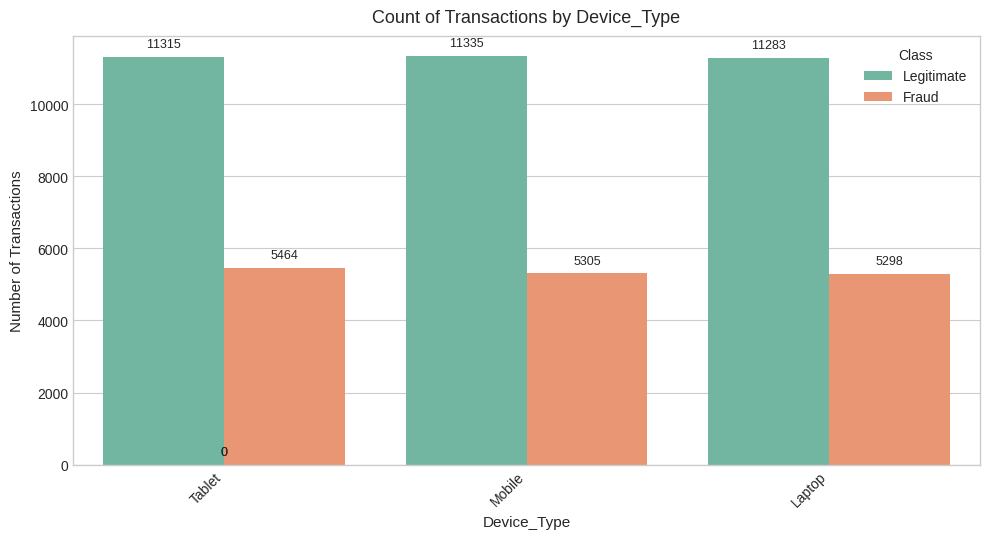

→ Device_Type: shows category frequencies + fraud proportion inside each


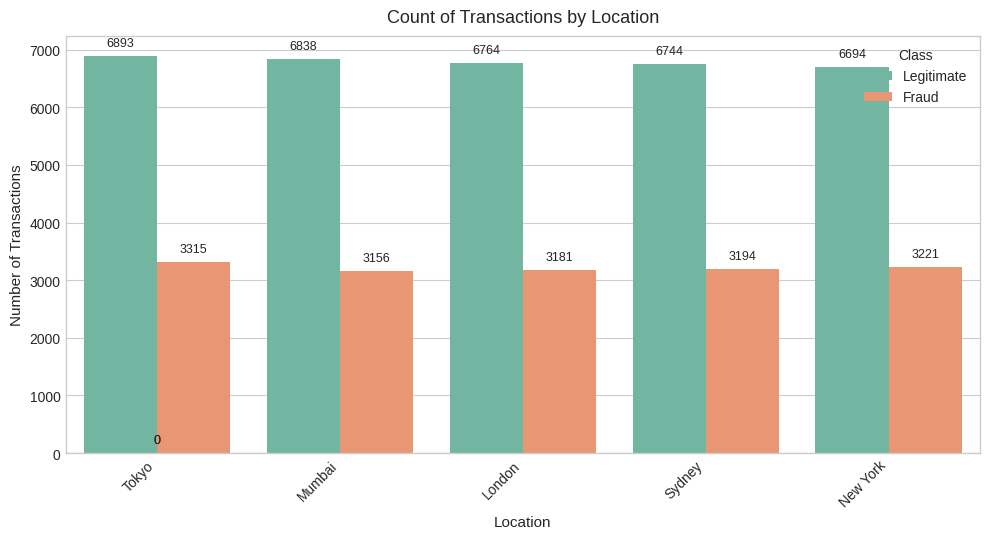

→ Location: shows category frequencies + fraud proportion inside each


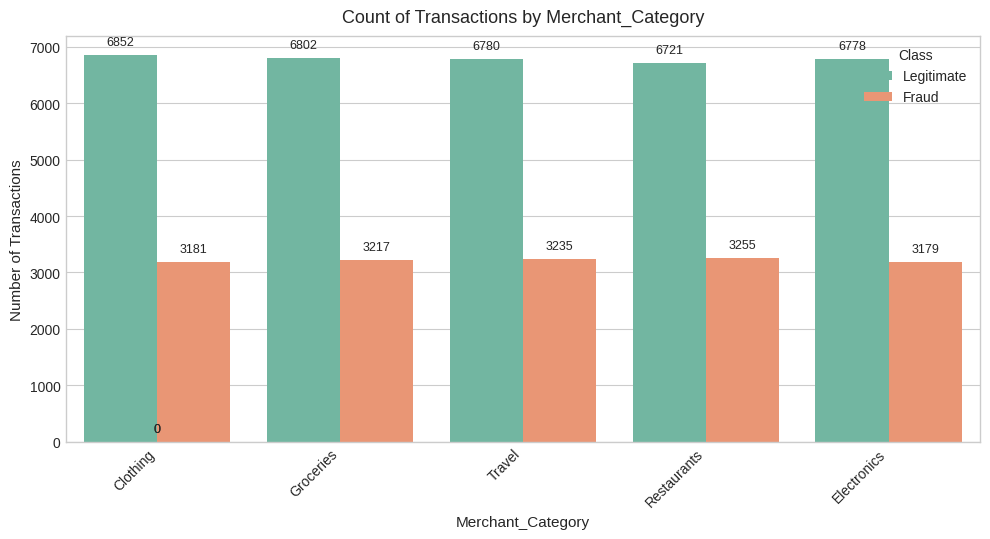

→ Merchant_Category: shows category frequencies + fraud proportion inside each


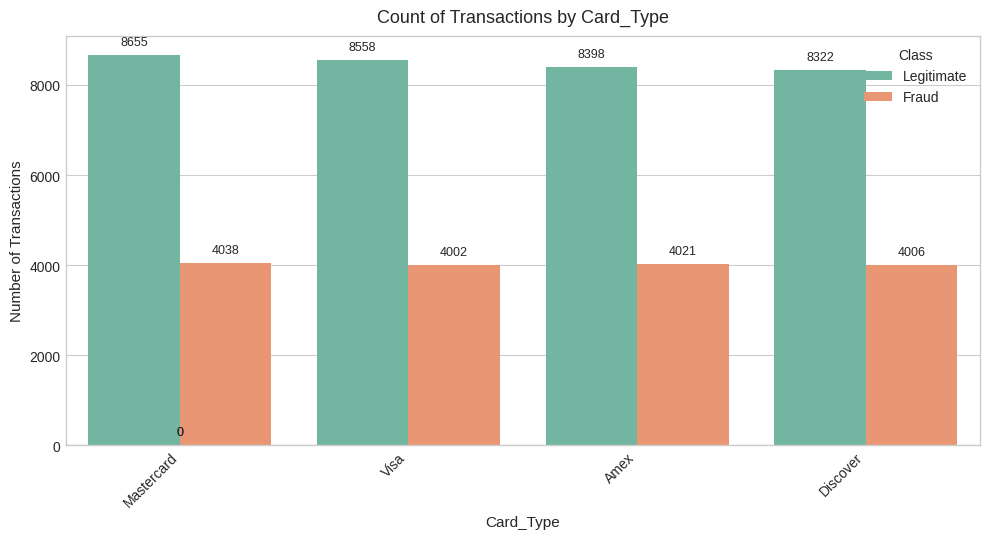

→ Card_Type: shows category frequencies + fraud proportion inside each


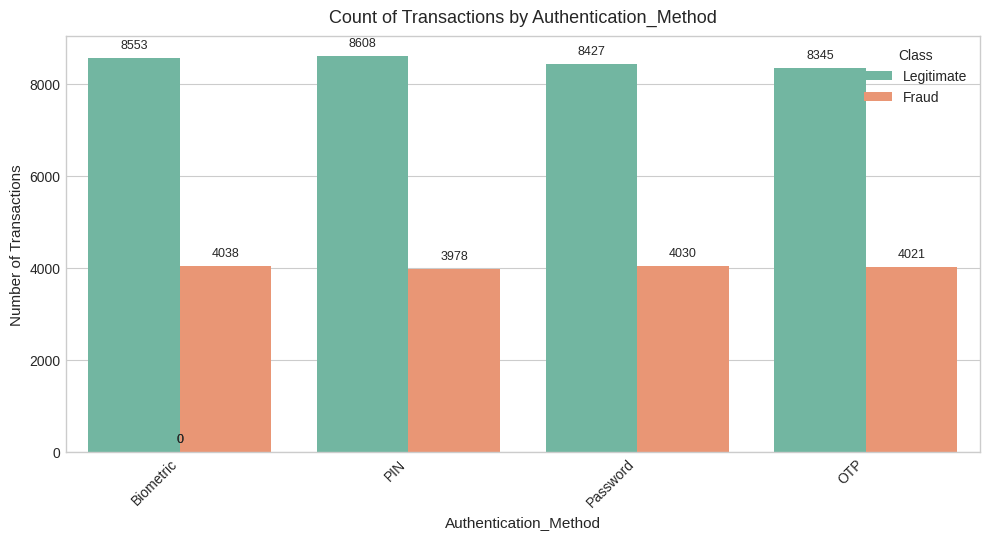

→ Authentication_Method: shows category frequencies + fraud proportion inside each


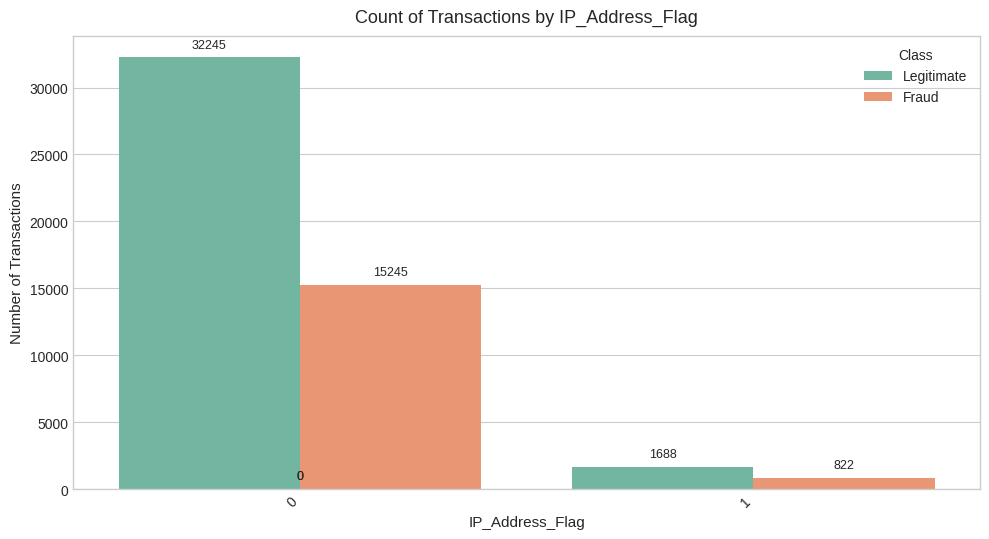

→ IP_Address_Flag: shows category frequencies + fraud proportion inside each


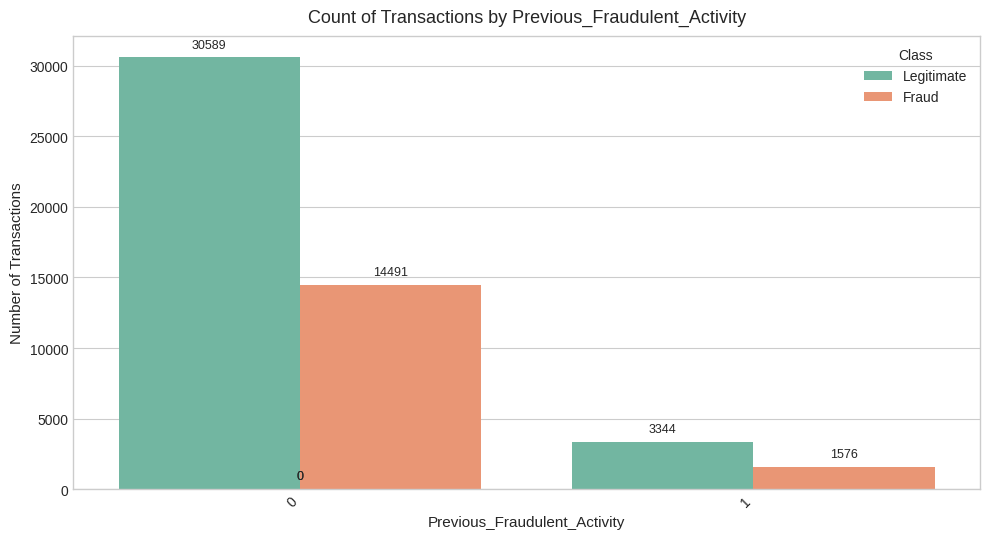

→ Previous_Fraudulent_Activity: shows category frequencies + fraud proportion inside each


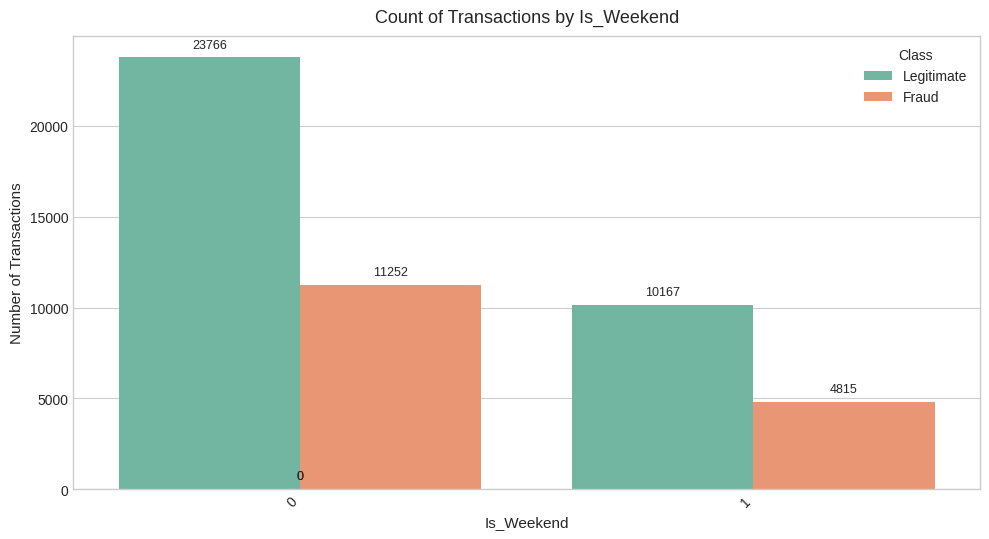

→ Is_Weekend: shows category frequencies + fraud proportion inside each

2. Barplots – Fraud Rate (%) by Category



/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


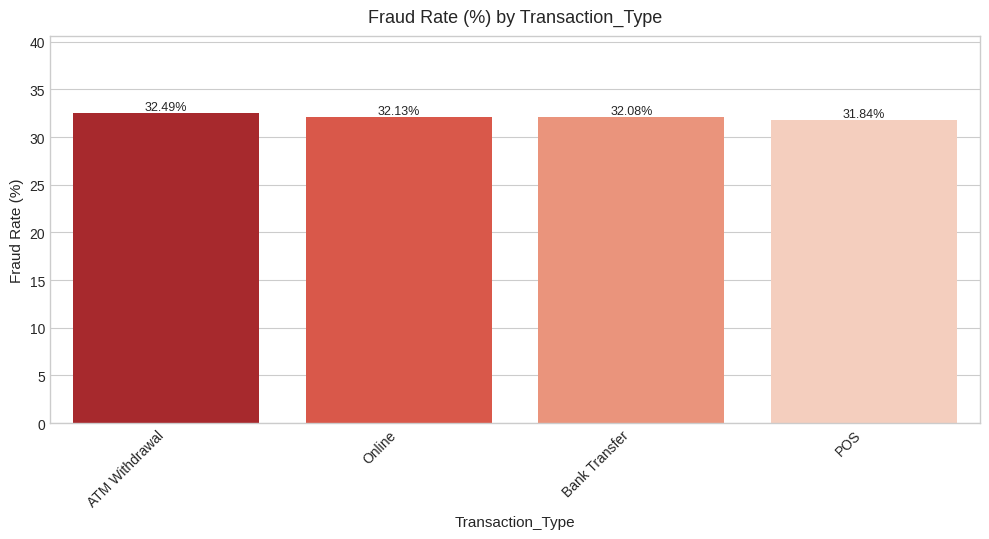

→ Transaction_Type: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


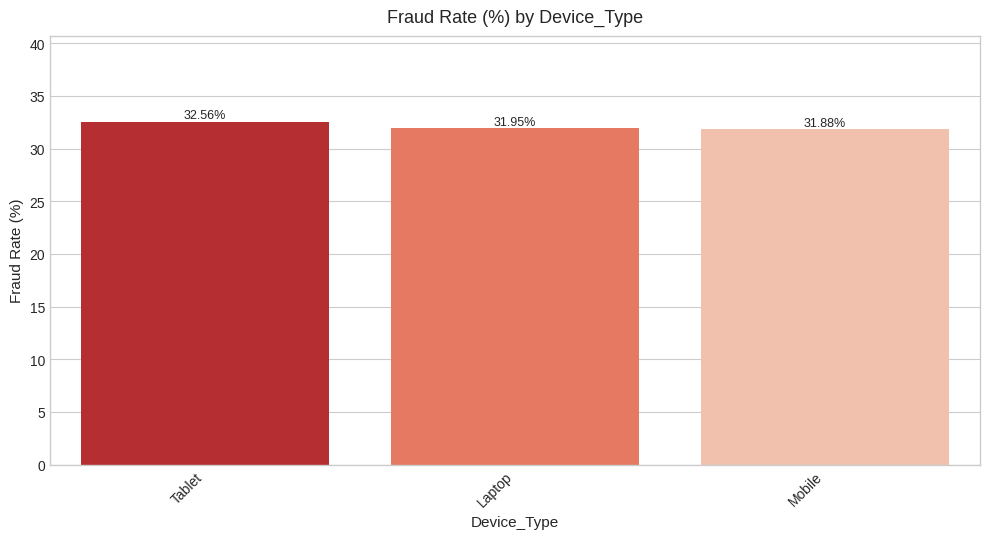

→ Device_Type: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


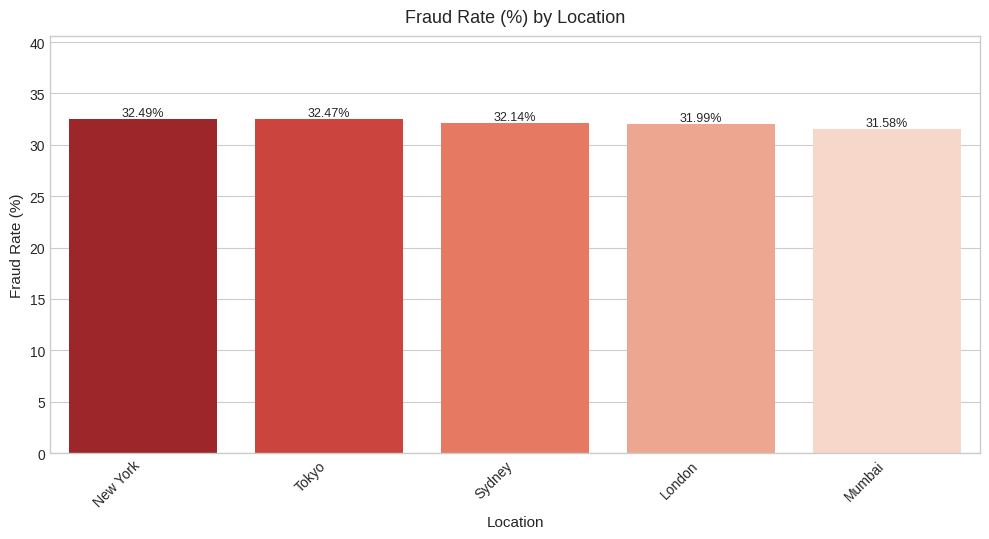

→ Location: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


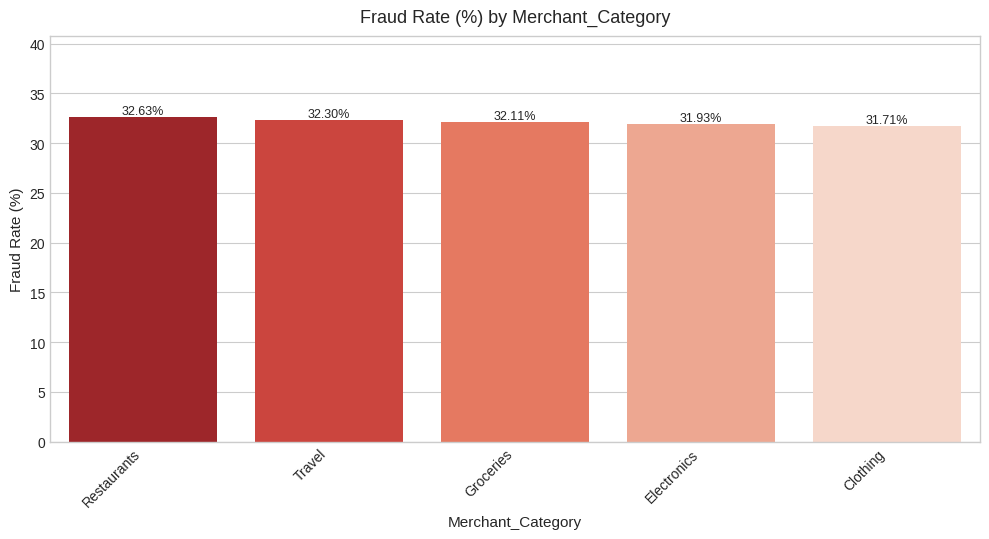

→ Merchant_Category: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


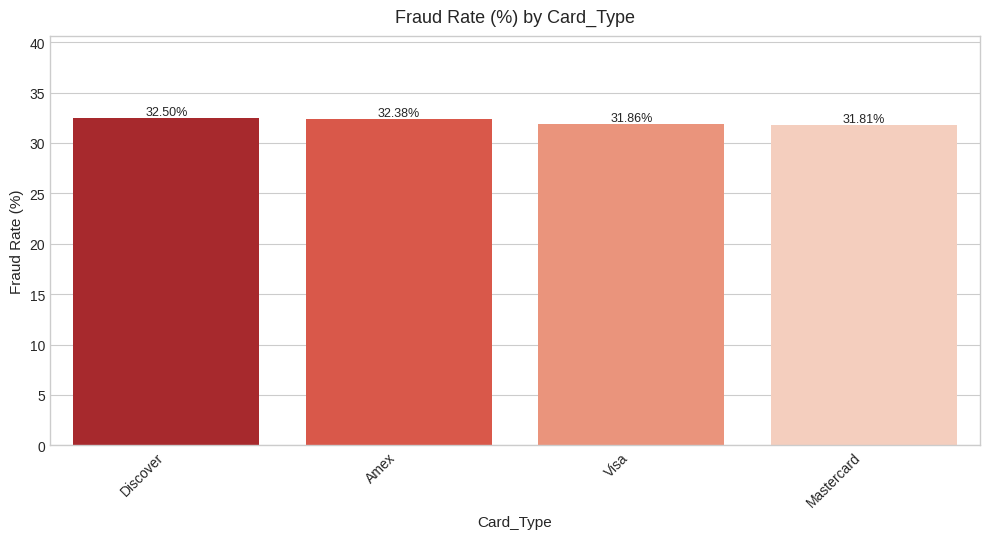

→ Card_Type: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


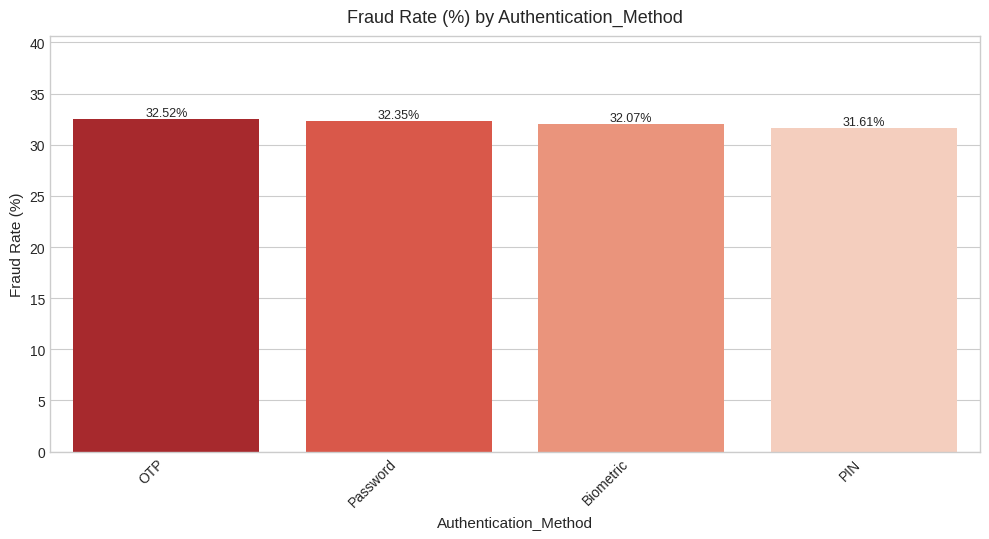

→ Authentication_Method: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


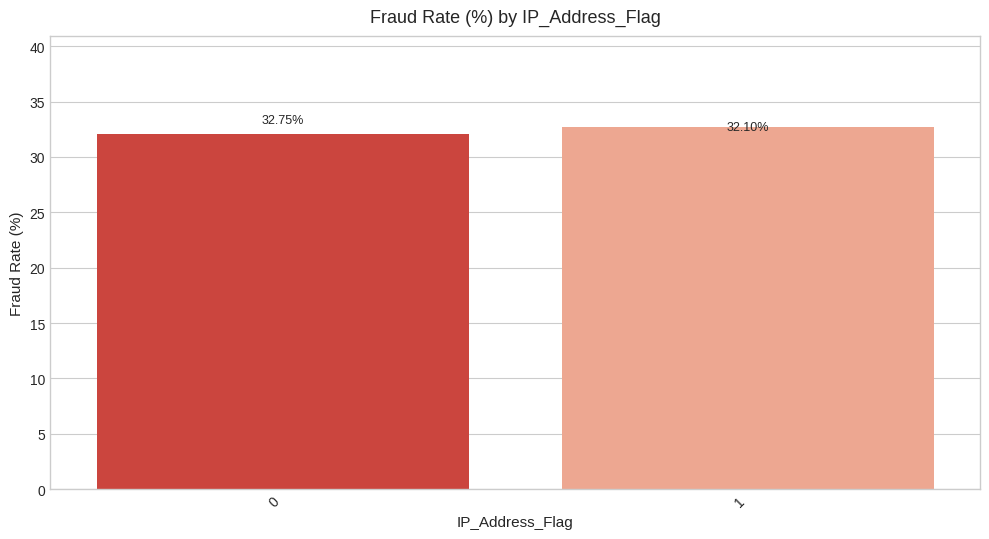

→ IP_Address_Flag: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


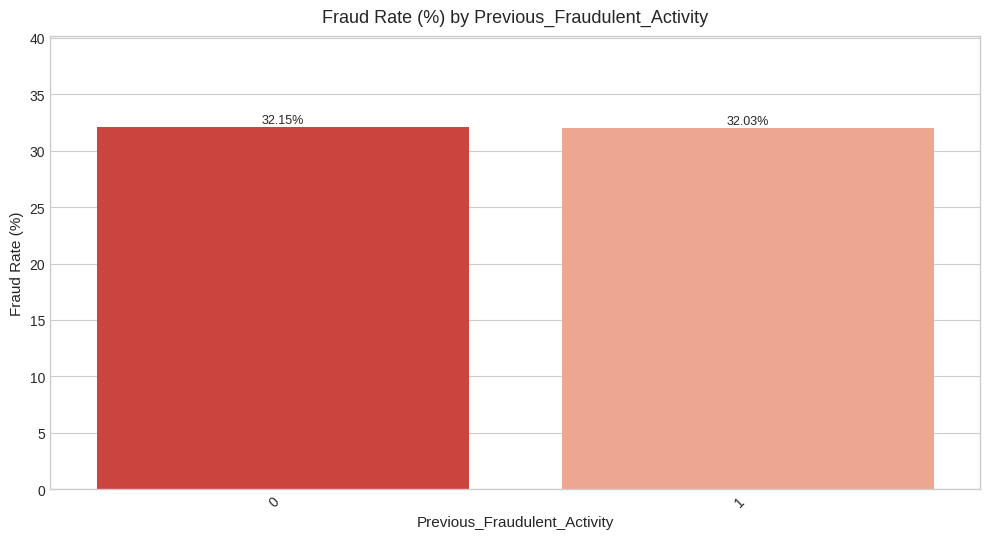

→ Previous_Fraudulent_Activity: highest fraud rate categories (very important for modeling)


/tmp/ipykernel_1236/873469720.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


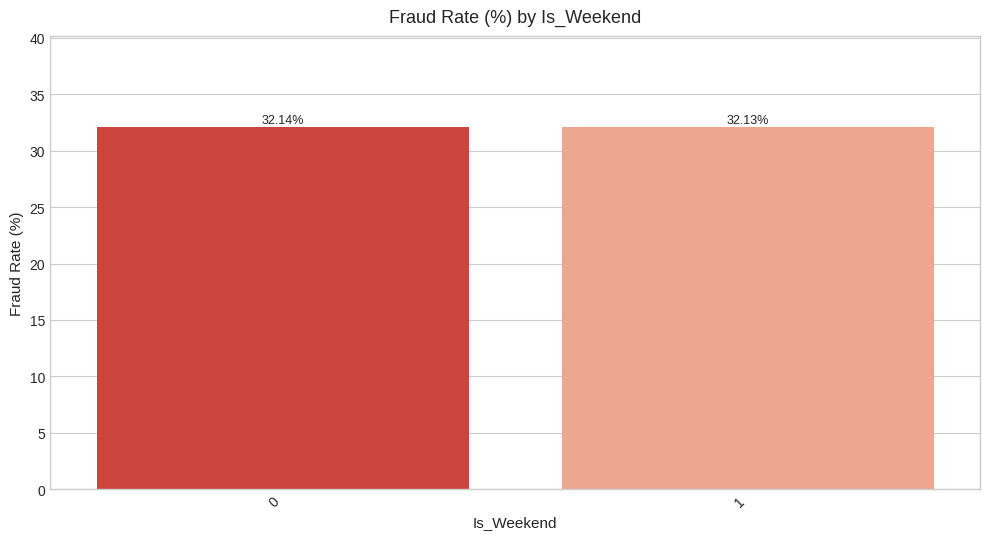

→ Is_Weekend: highest fraud rate categories (very important for modeling)

3. Selected high-interest categorical fraud rates



/tmp/ipykernel_1236/873469720.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


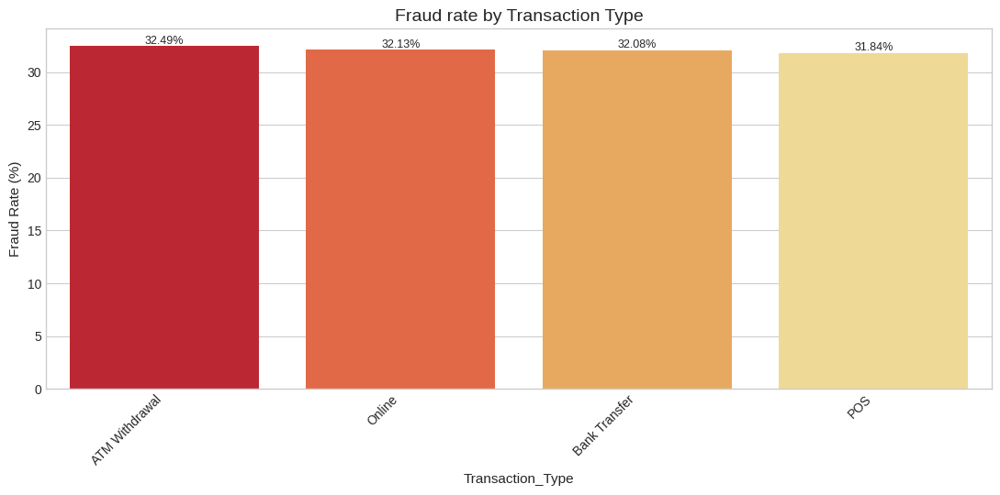

/tmp/ipykernel_1236/873469720.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


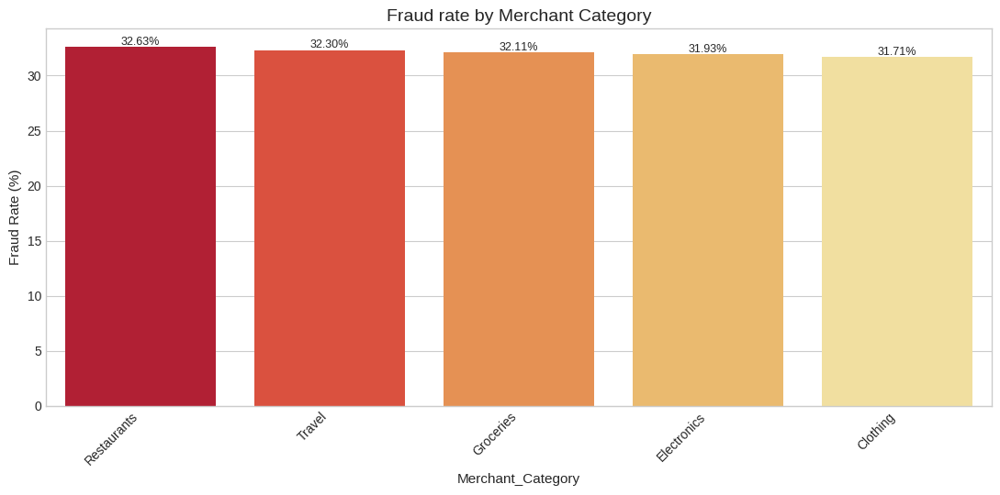

/tmp/ipykernel_1236/873469720.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


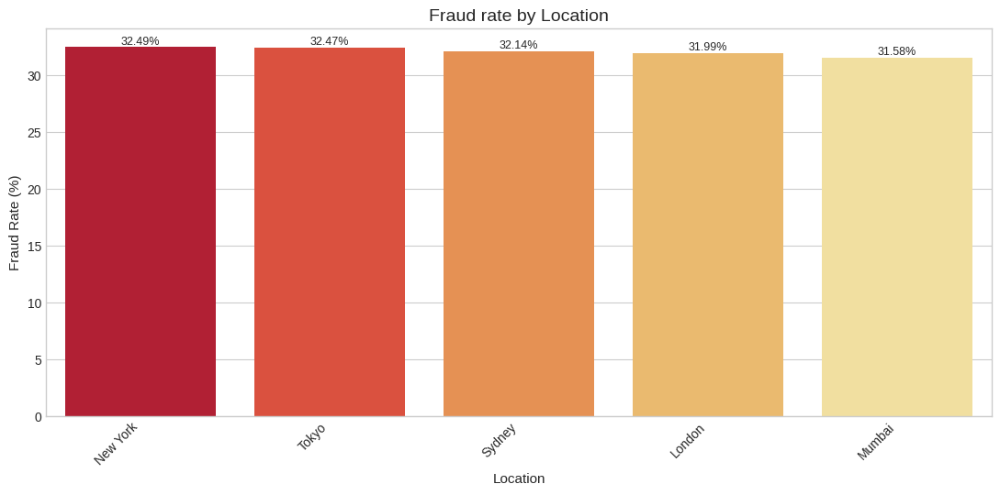

/tmp/ipykernel_1236/873469720.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


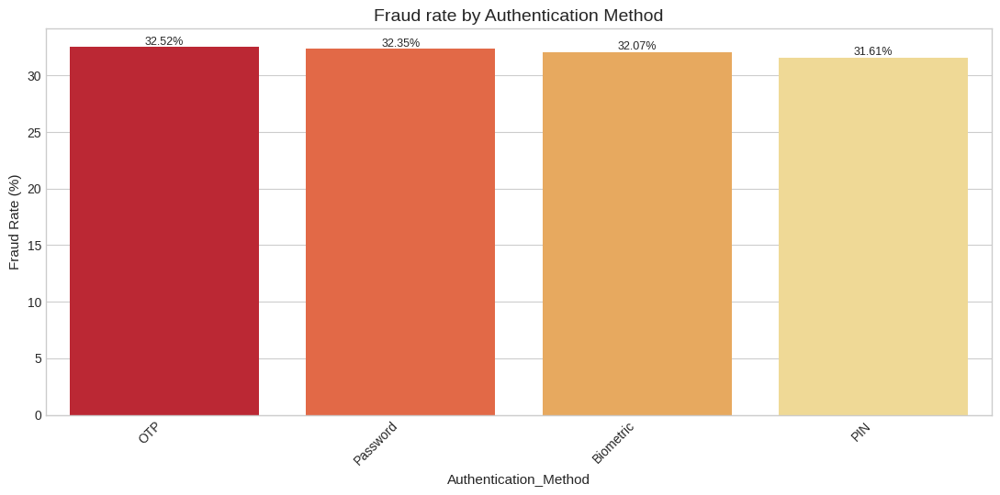


Quick Fraud Rate Ranking – Top categories with highest fraud rate
---------------------------------------------------------------------------

Transaction_Type – Top 5 riskiest categories:
Transaction_Type
ATM Withdrawal    32.49
Online            32.13
Bank Transfer     32.08
POS               31.84


Merchant_Category – Top 5 riskiest categories:
Merchant_Category
Restaurants    32.63
Travel         32.30
Groceries      32.11
Electronics    31.93
Clothing       31.71


Location – Top 5 riskiest categories:
Location
New York    32.49
Tokyo       32.47
Sydney      32.14
London      31.99
Mumbai      31.58


Authentication_Method – Top 5 riskiest categories:
Authentication_Method
OTP          32.52
Password     32.35
Biometric    32.07
PIN          31.61


───────────────────────────────────────────────────────────────────────────
Key things to observe:
• Which categories have fraud rate >> average fraud rate
• Whether some authentication methods are much riskier
• Location or merchant

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("Set2")
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (10, 5.5)

# ────────────────────────────────────────────────
#  Load data
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

# Quick mapping for nicer legend
df['Fraud'] = df['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

print("Generating important barplots & countplots for categorical features...\n")

# ────────────────────────────────────────────────
#  List of important categorical columns
# ────────────────────────────────────────────────
cat_columns = [
    'Transaction_Type',
    'Device_Type',
    'Location',
    'Merchant_Category',
    'Card_Type',
    'Authentication_Method',
    'IP_Address_Flag',
    'Previous_Fraudulent_Activity',
    'Is_Weekend'
]

# ────────────────────────────────────────────────
#  1. COUNTPLOTS – Distribution of each category
# ────────────────────────────────────────────────
print("1. Countplots – Category Distributions\n")

for col in cat_columns:
    if col in df.columns:
        plt.figure()
        ax = sns.countplot(
            data=df,
            x=col,
            hue='Fraud' if col not in ['Fraud','Fraud_Label'] else None,
            order=df[col].value_counts().index
        )

        plt.title(f'Count of Transactions by {col}', fontsize=13, pad=10)
        plt.xlabel(col, fontsize=11)
        plt.ylabel('Number of Transactions', fontsize=11)
        plt.xticks(rotation=45, ha='right')

        # Add count labels on bars
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}',
                        (p.get_x() + p.get_width()/2., p.get_height()),
                        ha='center', va='bottom',
                        fontsize=9, xytext=(0, 5), textcoords='offset points')

        if 'Fraud' in ax.get_legend_handles_labels()[1]:
            plt.legend(title='Class')

        plt.tight_layout()
        plt.show()

        print(f"→ {col}: shows category frequencies + fraud proportion inside each")

# ────────────────────────────────────────────────
#  2. BARPLOTS – Fraud Rate by Category
# ────────────────────────────────────────────────
print("\n2. Barplots – Fraud Rate (%) by Category\n")

for col in cat_columns:
    if col in df.columns and col not in ['Fraud','Fraud_Label']:
        fraud_rate = df.groupby(col)['Fraud_Label'].mean().sort_values(ascending=False) * 100

        plt.figure()
        ax = sns.barplot(
            x=fraud_rate.index,
            y=fraud_rate.values,
            palette="Reds_r"
        )

        plt.title(f'Fraud Rate (%) by {col}', fontsize=13, pad=10)
        plt.xlabel(col, fontsize=11)
        plt.ylabel('Fraud Rate (%)', fontsize=11)
        plt.xticks(rotation=45, ha='right')

        # Add percentage labels
        for i, v in enumerate(fraud_rate.values):
            ax.text(i, v + 0.3, f'{v:.2f}%', ha='center', fontsize=9)

        plt.ylim(0, max(fraud_rate.values)*1.25)
        plt.tight_layout()
        plt.show()

        print(f"→ {col}: highest fraud rate categories (very important for modeling)")

# ────────────────────────────────────────────────
#  3. Special: Fraud Rate by High-Cardinality but Important Groups
# ────────────────────────────────────────────────
print("\n3. Selected high-interest categorical fraud rates\n")

important_comparisons = [
    ('Transaction_Type', 'Fraud rate by Transaction Type'),
    ('Merchant_Category', 'Fraud rate by Merchant Category'),
    ('Location', 'Fraud rate by Location'),
    ('Authentication_Method', 'Fraud rate by Authentication Method')
]

for col, title in important_comparisons:
    if col in df.columns:
        plt.figure(figsize=(11, 5.5))
        fraud_rate = df.groupby(col)['Fraud_Label'].mean().sort_values(ascending=False) * 100

        sns.barplot(
            x=fraud_rate.index,
            y=fraud_rate.values,
            palette="YlOrRd_r"
        )

        plt.title(title, fontsize=14)
        plt.xlabel(col, fontsize=11)
        plt.ylabel('Fraud Rate (%)', fontsize=11)
        plt.xticks(rotation=45, ha='right')

        for i, v in enumerate(fraud_rate.values):
            plt.text(i, v + 0.2, f'{v:.2f}%', ha='center', fontsize=9)

        plt.tight_layout()
        plt.show()

# ────────────────────────────────────────────────
#  Summary – Quick reference table style output
# ────────────────────────────────────────────────
print("\nQuick Fraud Rate Ranking – Top categories with highest fraud rate")
print("-"*75)

for col in ['Transaction_Type','Merchant_Category','Location','Authentication_Method']:
    if col in df.columns:
        top = df.groupby(col)['Fraud_Label'].mean().sort_values(ascending=False).head(5) * 100
        print(f"\n{col} – Top 5 riskiest categories:")
        print(top.round(2).to_string())
        print()

print("\n" + "─"*75)
print("Key things to observe:")
print("• Which categories have fraud rate >> average fraud rate")
print("• Whether some authentication methods are much riskier")
print("• Location or merchant category differences")
print("• Very imbalanced categories (may need target encoding or grouping)")
print("─"*75)

print("\nReady for next step: correlation / feature importance / modeling ?")

Loading dataset...
Generating important pie charts for fraud analysis...



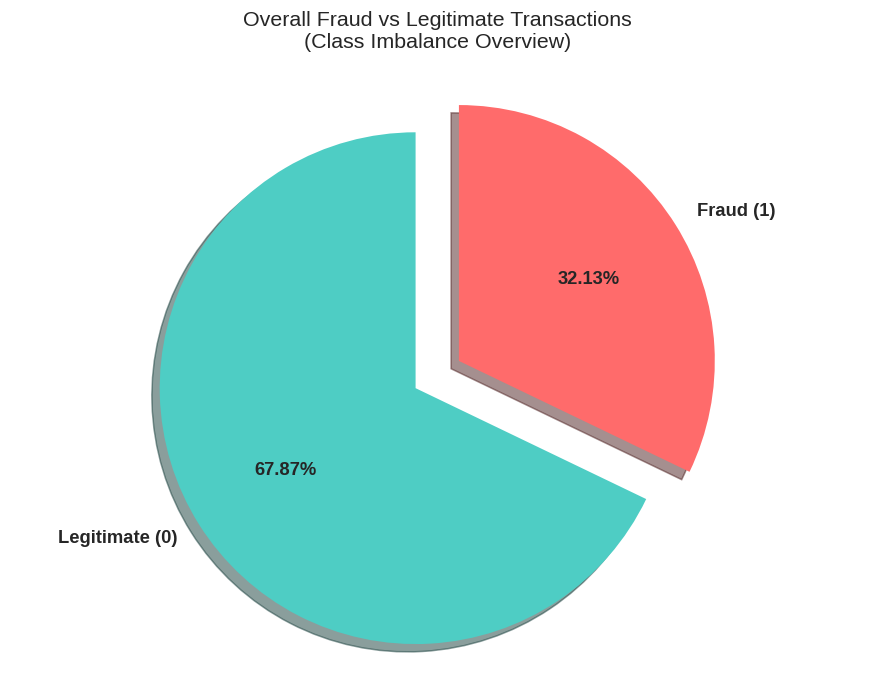

Pie Chart 1: Overall class distribution
   → Shows severe imbalance – fraud is rare → need balanced metrics (PR-AUC, recall)



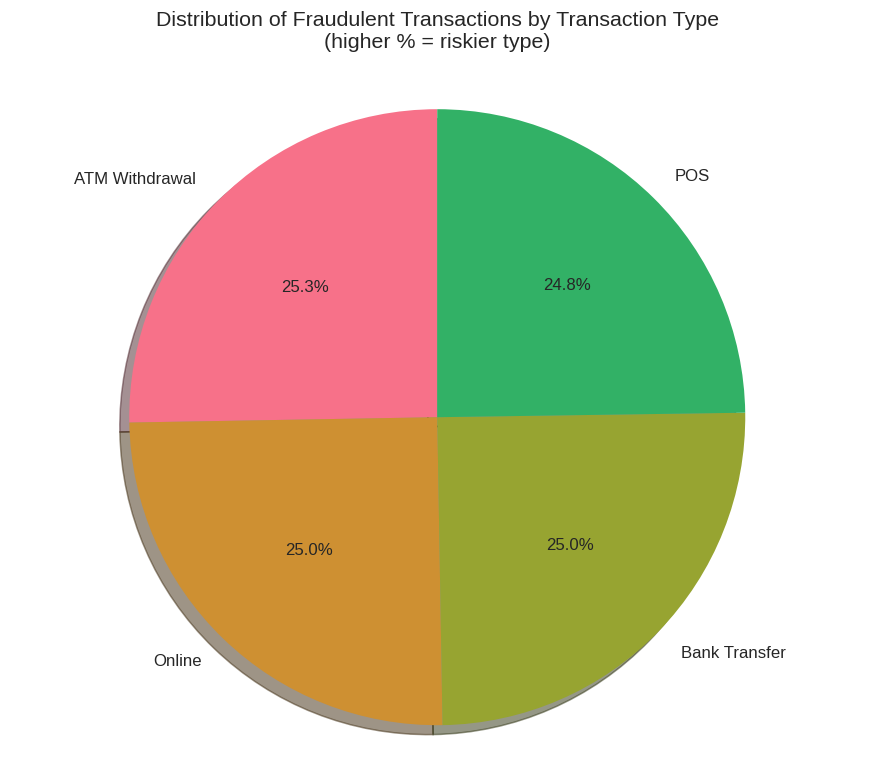

Pie Chart 2: Fraudulent transactions – share by Transaction Type
   → Shows which transaction types contribute most to fraud cases



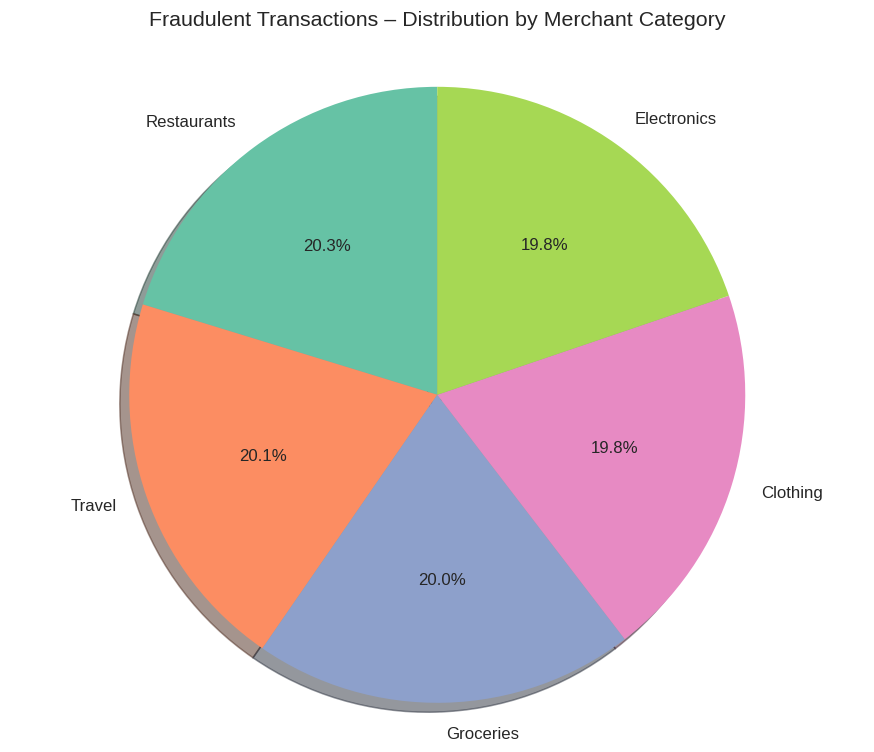

Pie Chart 3: Where fraud happens – merchant category breakdown
   → Helps identify high-risk merchant types



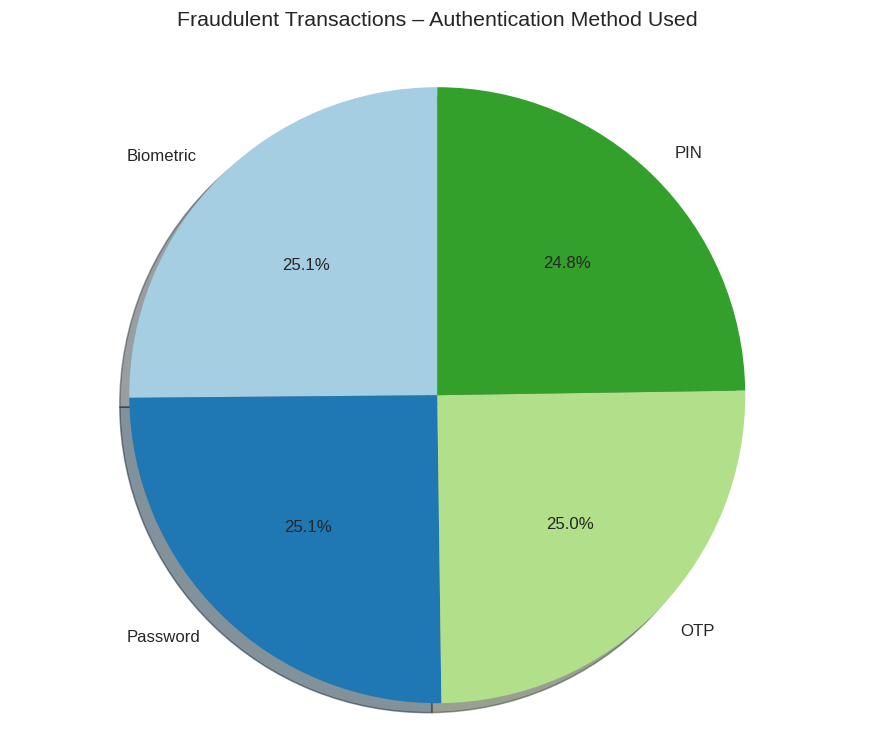

Pie Chart 4: Which authentication methods are most used in fraud cases
   → Often password-only or weak methods dominate fraud



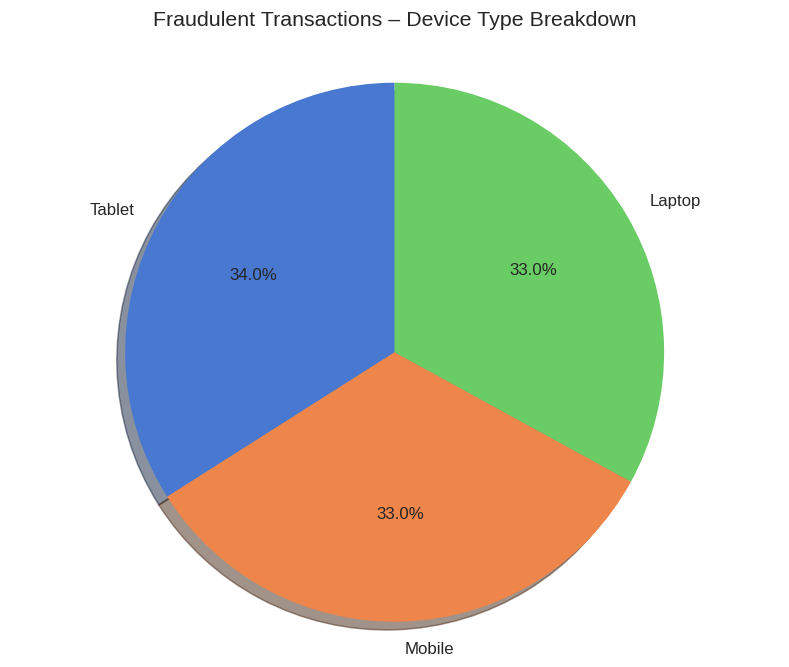

Pie Chart 5: Fraud by device type
   → Mobile often dominates fraud in many real datasets



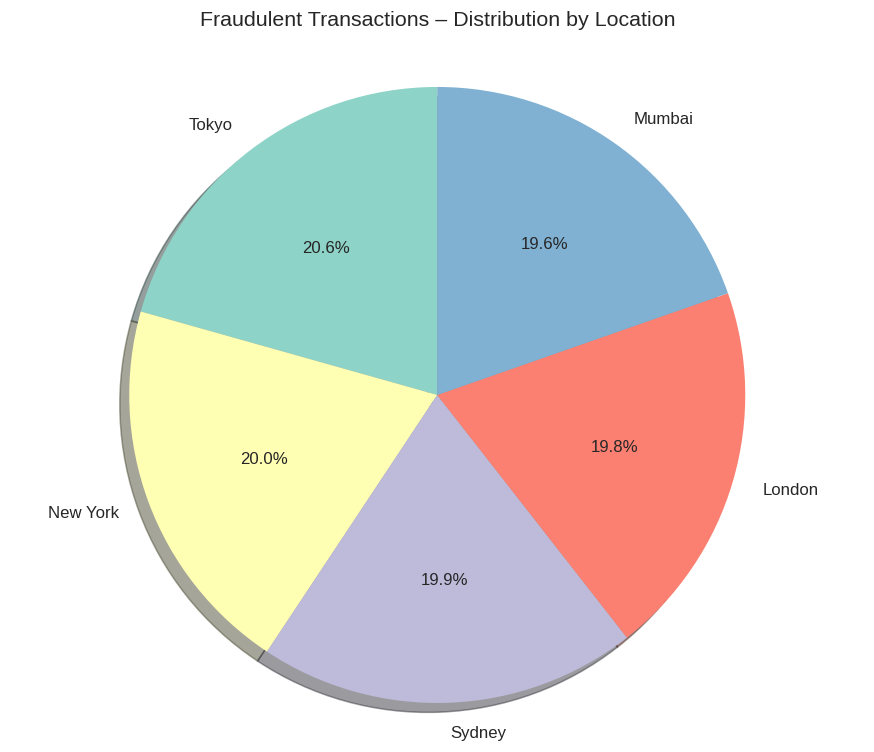

Pie Chart 6: Geographic distribution of fraud cases
   → Shows which cities/regions contribute most to fraud volume


════════════════════════════════════════════════════════════════════════════════
All important pie charts generated successfully:
  1. Overall fraud vs legitimate distribution
  2. Fraudulent transactions by Transaction Type
  3. Fraud by Merchant Category
  4. Authentication Method used in fraud
  5. Device Type used in fraud
  6. Fraud by Location
════════════════════════════════════════════════════════════════════════════════
These pie charts help quickly identify high-risk categories and segments.


In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling – clean and professional
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (10, 7)

# Color palette – fraud = red, legitimate = teal
colors_fraud = ['#4ECDC4', '#FF6B6B']   # legitimate, fraud
colors_general = sns.color_palette("husl", 8)

# ────────────────────────────────────────────────
#  Load data
# ────────────────────────────────────────────────
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

print("Generating important pie charts for fraud analysis...\n")

# ────────────────────────────────────────────────
#  1. Overall Fraud vs Legitimate Distribution
# ────────────────────────────────────────────────
plt.figure()
counts = df['Fraud_Label'].value_counts()
labels = ['Legitimate (0)', 'Fraud (1)']
explode = [0.05, 0.15]  # slightly explode fraud slice

plt.pie(counts, labels=labels, autopct='%1.2f%%', startangle=90,
        explode=explode, colors=colors_fraud, shadow=True,
        textprops={'fontsize': 12, 'fontweight': 'bold'})

plt.title('Overall Fraud vs Legitimate Transactions\n(Class Imbalance Overview)', fontsize=14, pad=20)
plt.axis('equal')
plt.show()

print("Pie Chart 1: Overall class distribution")
print("   → Shows severe imbalance – fraud is rare → need balanced metrics (PR-AUC, recall)\n")

# ────────────────────────────────────────────────
#  2. Fraud Rate by Transaction Type
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 8))

fraud_by_type = df.groupby('Transaction_Type')['Fraud_Label'].mean().sort_values(ascending=False)
labels = fraud_by_type.index
sizes = fraud_by_type.values * 100  # in percentage

plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90,
        colors=colors_general, shadow=True, textprops={'fontsize': 11})

plt.title('Distribution of Fraudulent Transactions by Transaction Type\n(higher % = riskier type)', fontsize=14, pad=20)
plt.axis('equal')
plt.show()

print("Pie Chart 2: Fraudulent transactions – share by Transaction Type")
print("   → Shows which transaction types contribute most to fraud cases\n")

# ────────────────────────────────────────────────
#  3. Fraud by Merchant Category
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 8))

fraud_by_cat = df[df['Fraud_Label'] == 1]['Merchant_Category'].value_counts(normalize=True) * 100

plt.pie(fraud_by_cat, labels=fraud_by_cat.index, autopct='%1.1f%%', startangle=90,
        colors=sns.color_palette("Set2", len(fraud_by_cat)), shadow=True,
        textprops={'fontsize': 11})

plt.title('Fraudulent Transactions – Distribution by Merchant Category', fontsize=14, pad=20)
plt.axis('equal')
plt.show()

print("Pie Chart 3: Where fraud happens – merchant category breakdown")
print("   → Helps identify high-risk merchant types\n")

# ────────────────────────────────────────────────
#  4. Authentication Method – Fraud vs Legit Split
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 8))

auth_fraud = df.groupby(['Authentication_Method', 'Fraud_Label']).size().unstack().fillna(0)
auth_fraud_pct = auth_fraud.div(auth_fraud.sum(axis=1), axis=0) * 100

# Pie for fraud cases only
fraud_auth = df[df['Fraud_Label'] == 1]['Authentication_Method'].value_counts(normalize=True) * 100

plt.pie(fraud_auth, labels=fraud_auth.index, autopct='%1.1f%%', startangle=90,
        colors=sns.color_palette("Paired", len(fraud_auth)), shadow=True,
        textprops={'fontsize': 11})

plt.title('Fraudulent Transactions – Authentication Method Used', fontsize=14, pad=20)
plt.axis('equal')
plt.show()

print("Pie Chart 4: Which authentication methods are most used in fraud cases")
print("   → Often password-only or weak methods dominate fraud\n")

# ────────────────────────────────────────────────
#  5. Device Type – Fraud Distribution
# ────────────────────────────────────────────────
plt.figure(figsize=(9, 7))

device_fraud = df[df['Fraud_Label'] == 1]['Device_Type'].value_counts(normalize=True) * 100

plt.pie(device_fraud, labels=device_fraud.index, autopct='%1.1f%%', startangle=90,
        colors=sns.color_palette("muted", len(device_fraud)), shadow=True,
        textprops={'fontsize': 11})

plt.title('Fraudulent Transactions – Device Type Breakdown', fontsize=14, pad=20)
plt.axis('equal')
plt.show()

print("Pie Chart 5: Fraud by device type")
print("   → Mobile often dominates fraud in many real datasets\n")

# ────────────────────────────────────────────────
#  6. Fraud Rate by Location (geographic risk)
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 8))

location_fraud = df[df['Fraud_Label'] == 1]['Location'].value_counts(normalize=True) * 100

plt.pie(location_fraud, labels=location_fraud.index, autopct='%1.1f%%', startangle=90,
        colors=sns.color_palette("Set3", len(location_fraud)), shadow=True,
        textprops={'fontsize': 11})

plt.title('Fraudulent Transactions – Distribution by Location', fontsize=14, pad=20)
plt.axis('equal')
plt.show()

print("Pie Chart 6: Geographic distribution of fraud cases")
print("   → Shows which cities/regions contribute most to fraud volume\n")

print("\n" + "═"*80)
print("All important pie charts generated successfully:")
print("  1. Overall fraud vs legitimate distribution")
print("  2. Fraudulent transactions by Transaction Type")
print("  3. Fraud by Merchant Category")
print("  4. Authentication Method used in fraud")
print("  5. Device Type used in fraud")
print("  6. Fraud by Location")
print("═"*80)

print("These pie charts help quickly identify high-risk categories and segments.")

Generating robust boxplots – numerical features vs Fraud



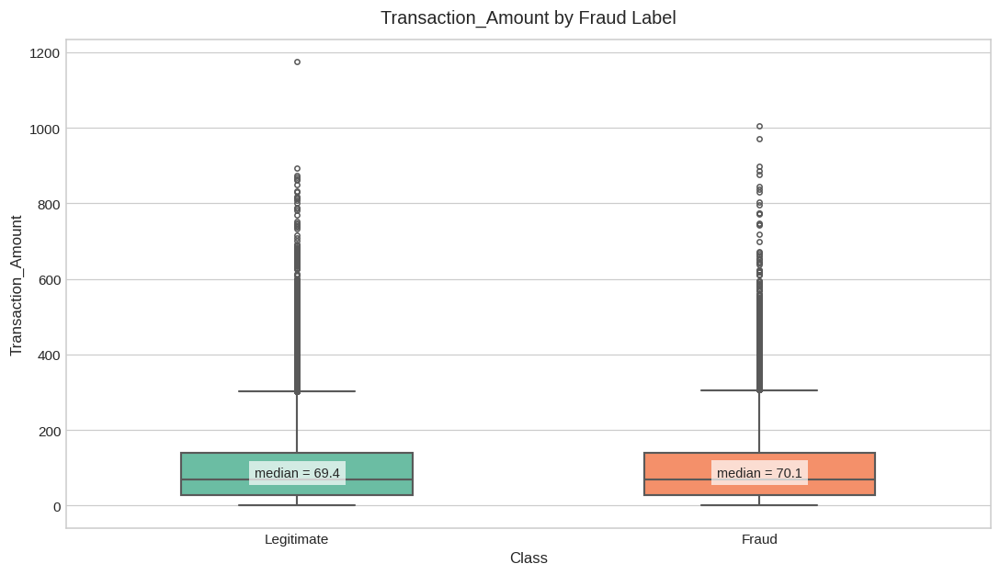

→ Transaction_Amount : median difference / spread / outliers checked


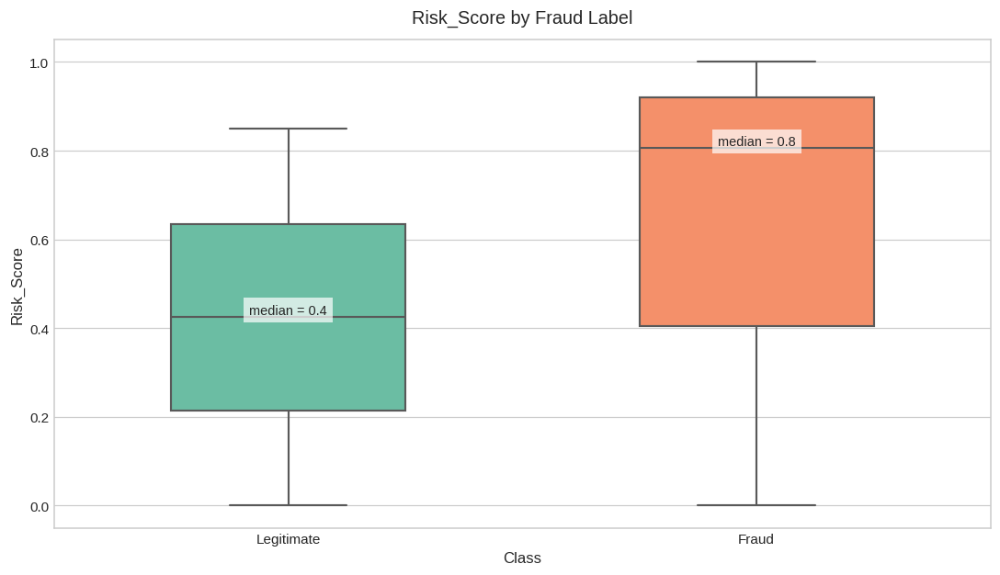

→ Risk_Score : median difference / spread / outliers checked


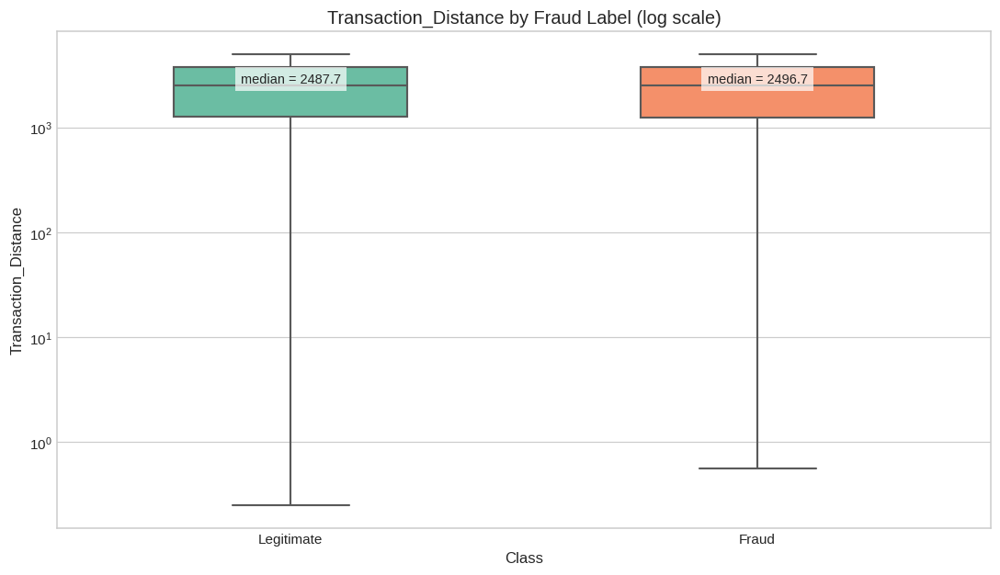

→ Transaction_Distance : median difference / spread / outliers checked


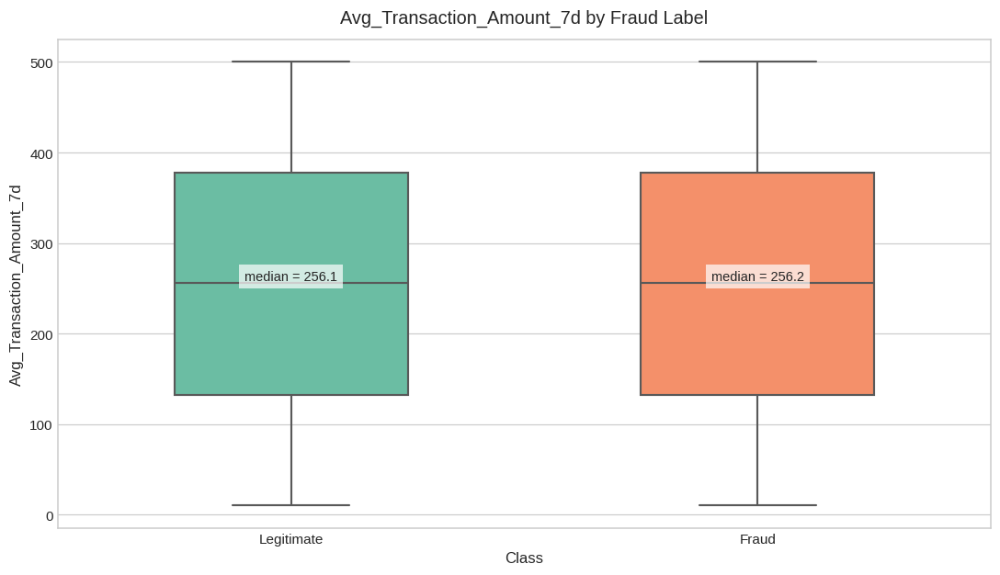

→ Avg_Transaction_Amount_7d : median difference / spread / outliers checked


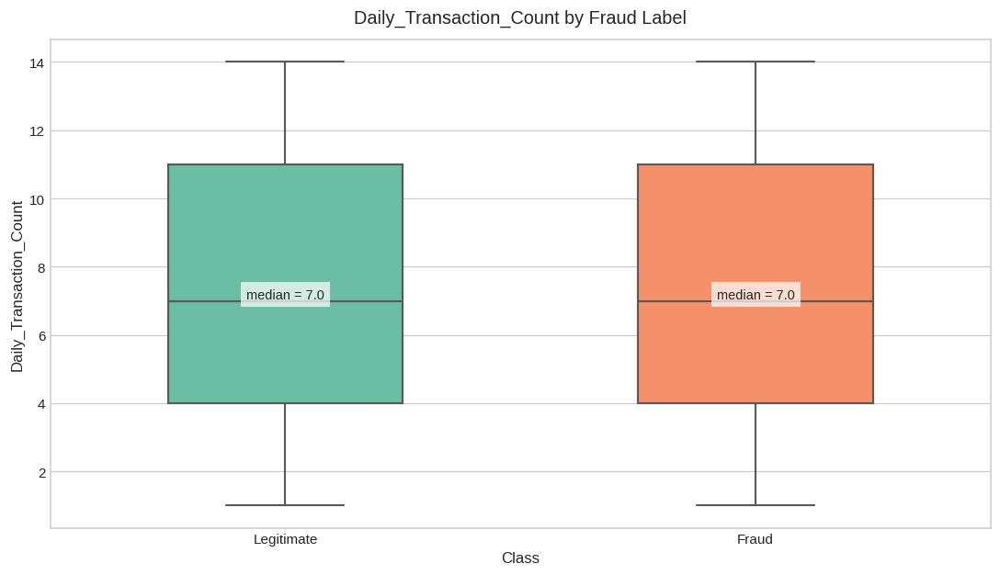

→ Daily_Transaction_Count : median difference / spread / outliers checked


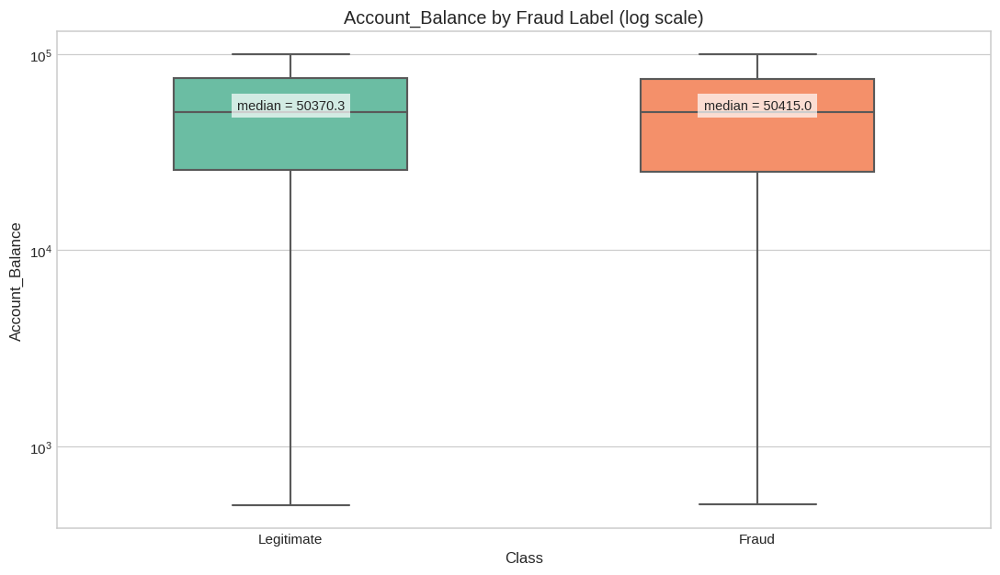

→ Account_Balance : median difference / spread / outliers checked


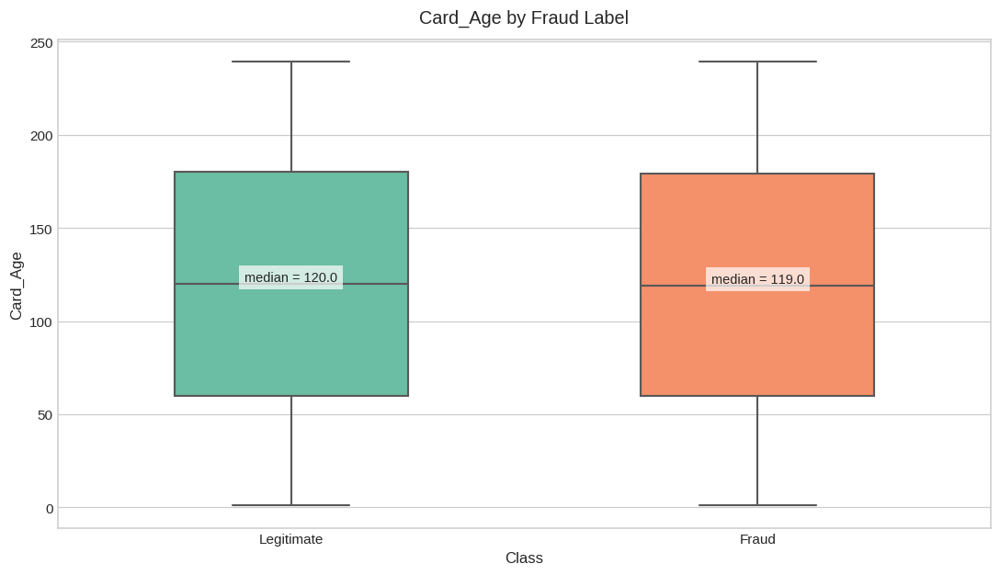

→ Card_Age : median difference / spread / outliers checked


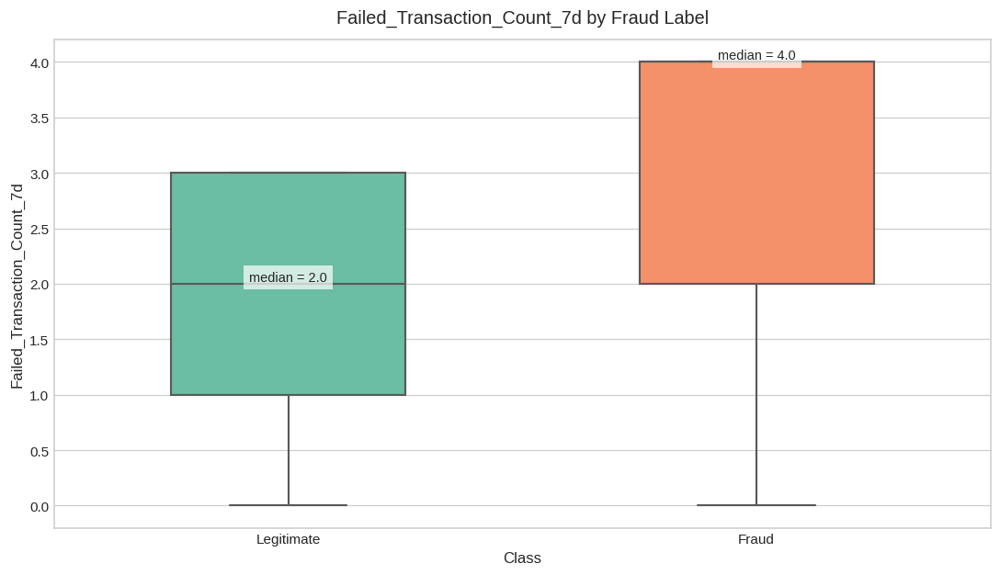

→ Failed_Transaction_Count_7d : median difference / spread / outliers checked


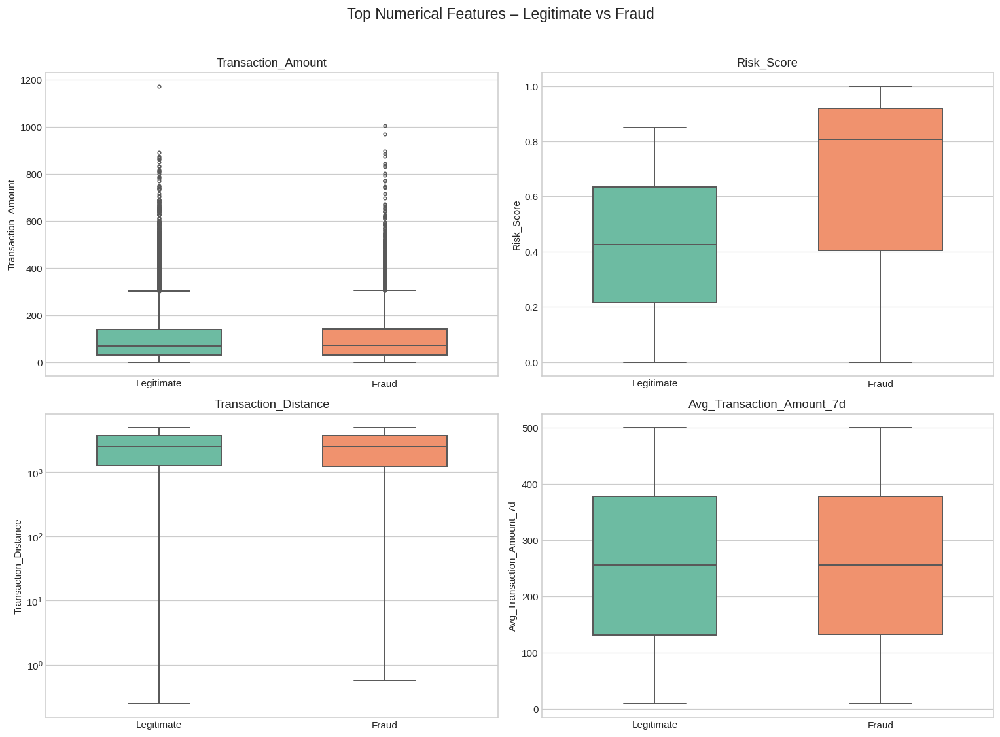


All boxplots generated.


In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette(['#66c2a5', '#fc8d62'])  # legit, fraud
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (10, 5.8)

# ────────────────────────────────────────────────
#  Load data & prepare nicer label
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

# Map for readable legend
df['Fraud'] = df['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

print("Generating robust boxplots – numerical features vs Fraud\n")

# ────────────────────────────────────────────────
#  Most important numerical features to visualize
# ────────────────────────────────────────────────
key_features = [
    'Transaction_Amount',
    'Risk_Score',
    'Transaction_Distance',
    'Avg_Transaction_Amount_7d',
    'Daily_Transaction_Count',
    'Account_Balance',
    'Card_Age',
    'Failed_Transaction_Count_7d'
]

# ────────────────────────────────────────────────
#  Individual boxplots – safe version
# ────────────────────────────────────────────────
for feature in key_features:
    if feature not in df.columns:
        print(f"→ Column not found: {feature}")
        continue

    plt.figure()

    ax = sns.boxplot(
        data=df,
        x='Fraud',
        y=feature,
        hue='Fraud',
        width=0.5,
        saturation=0.9,
        linewidth=1.4,
        fliersize=3.5,
        whis=1.5
    )

    # Title & labels
    plt.title(f'{feature} by Fraud Label', fontsize=13, pad=12)
    plt.xlabel('Class', fontsize=11)
    plt.ylabel(feature, fontsize=11)

    # Show median value
    medians = df.groupby('Fraud')[feature].median()
    for i, fraud_type in enumerate(['Legitimate', 'Fraud']):
        y_pos = medians[fraud_type]
        plt.text(i, y_pos, f'median = {y_pos:.1f}',
                 ha='center', va='bottom', fontsize=9.5,
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    # Log scale for heavily skewed features
    log_features = ['Transaction_Amount', 'Account_Balance', 'Transaction_Distance']
    if feature in log_features and (df[feature] > 0).all():
        plt.yscale('log')
        plt.title(f'{feature} by Fraud Label (log scale)', fontsize=13)

    # Only try to remove legend if it exists
    if ax.get_legend() is not None:
        ax.get_legend().remove()

    # Or simpler: don't show duplicate legend at all
    # plt.legend_.remove()  ← this line was causing the crash when None

    plt.tight_layout()
    plt.show()

    print(f"→ {feature} : median difference / spread / outliers checked")

# ────────────────────────────────────────────────
#  Multi-panel version – top 4 features
# ────────────────────────────────────────────────
top_features = [
    'Transaction_Amount',
    'Risk_Score',
    'Transaction_Distance',
    'Avg_Transaction_Amount_7d'
]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flat

for i, feature in enumerate(top_features):
    if feature not in df.columns:
        continue

    sns.boxplot(
        data=df,
        x='Fraud',
        y=feature,
        hue='Fraud',
        ax=axes[i],
        width=0.55,
        saturation=0.85,
        linewidth=1.3,
        fliersize=3
    )

    axes[i].set_title(feature, fontsize=12)
    axes[i].set_xlabel('')

    # Log scale where useful
    if feature in ['Transaction_Amount', 'Transaction_Distance']:
        if (df[feature] > 0).all():
            axes[i].set_yscale('log')

    # Safely remove legend if it exists
    if axes[i].get_legend() is not None:
        axes[i].get_legend().remove()

plt.suptitle('Top Numerical Features – Legitimate vs Fraud', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

print("\nAll boxplots generated.")

Generating important violin plots — numerical features vs Fraud Label



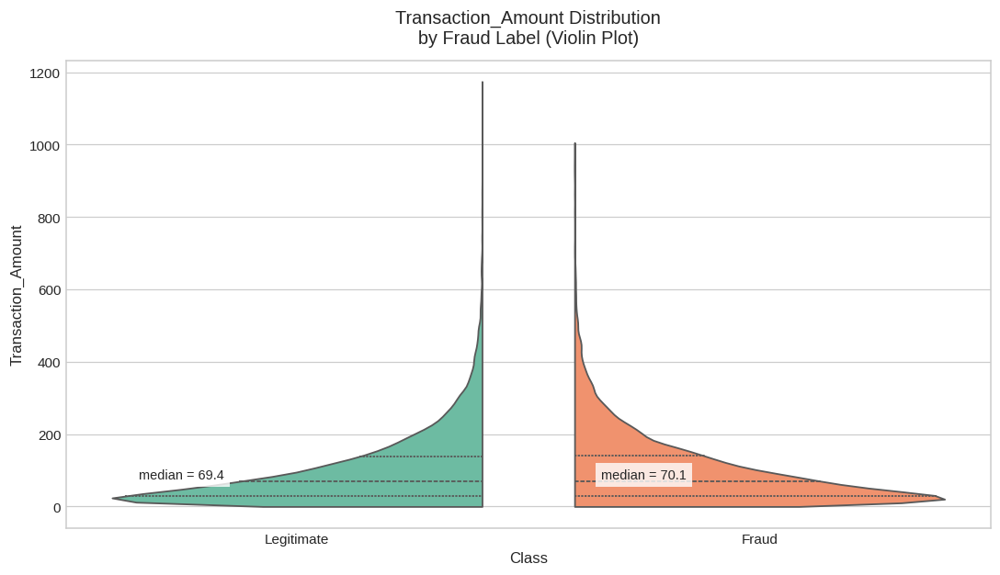

→ Transaction_Amount: compare shape, width, density peaks, tails between classes


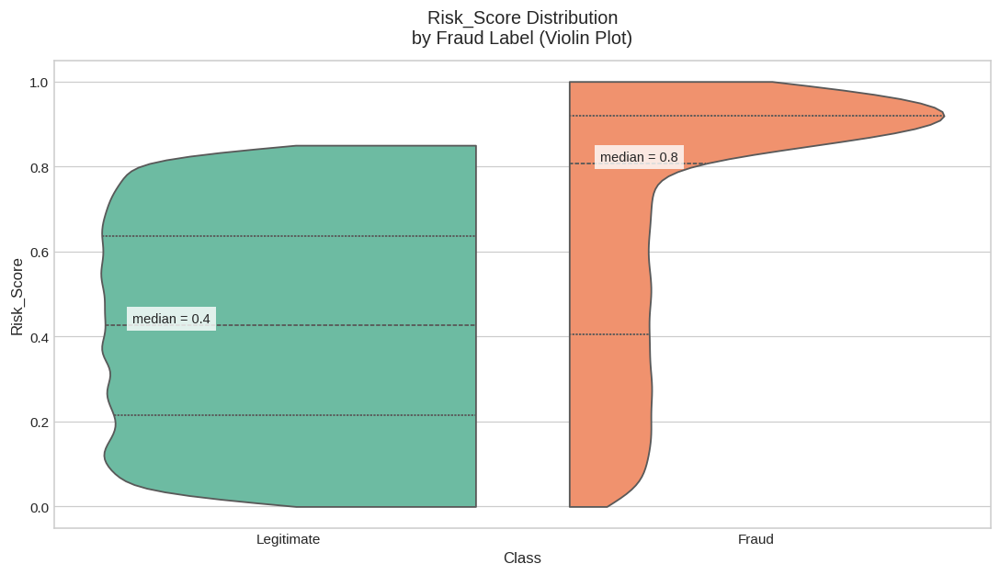

→ Risk_Score: compare shape, width, density peaks, tails between classes


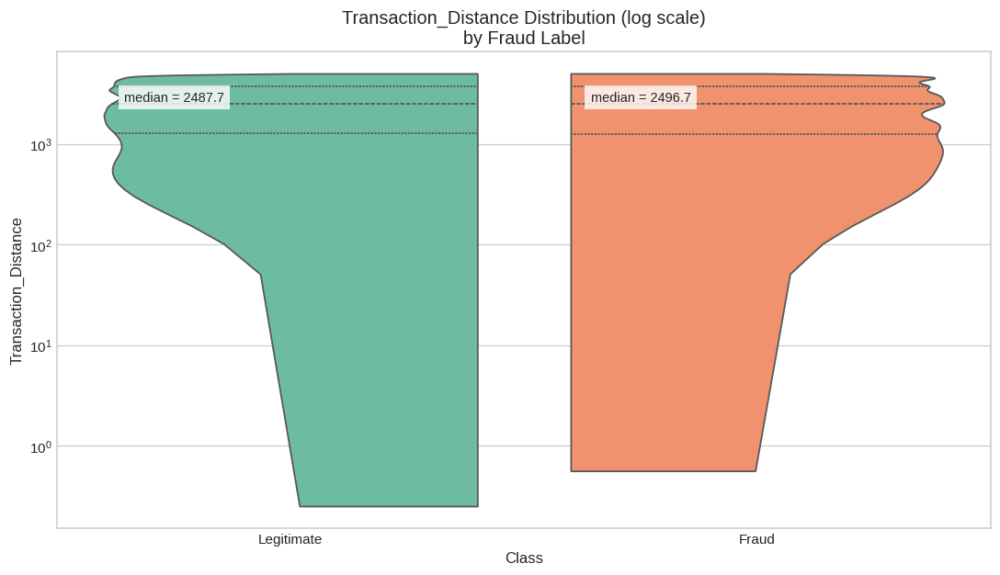

→ Transaction_Distance: compare shape, width, density peaks, tails between classes


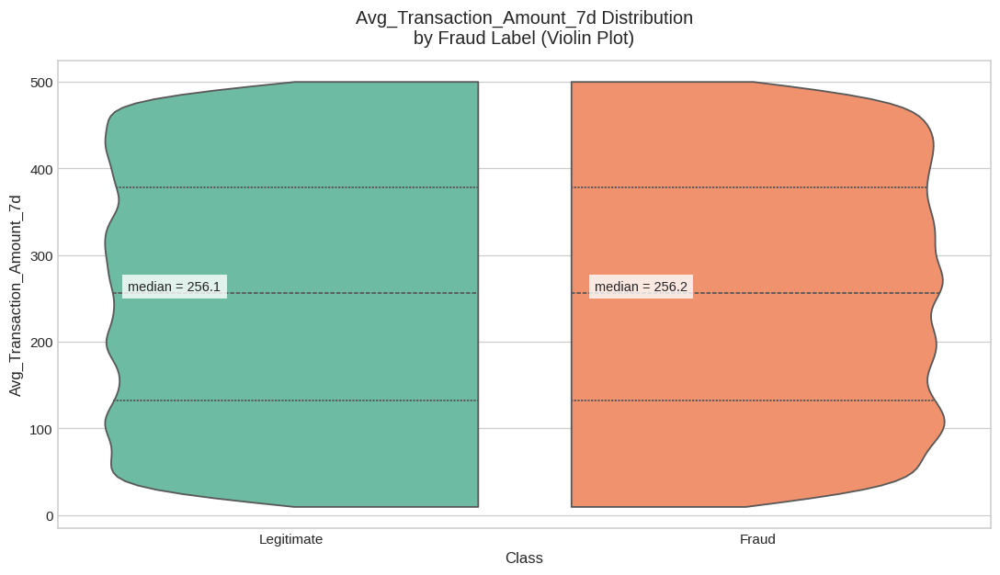

→ Avg_Transaction_Amount_7d: compare shape, width, density peaks, tails between classes


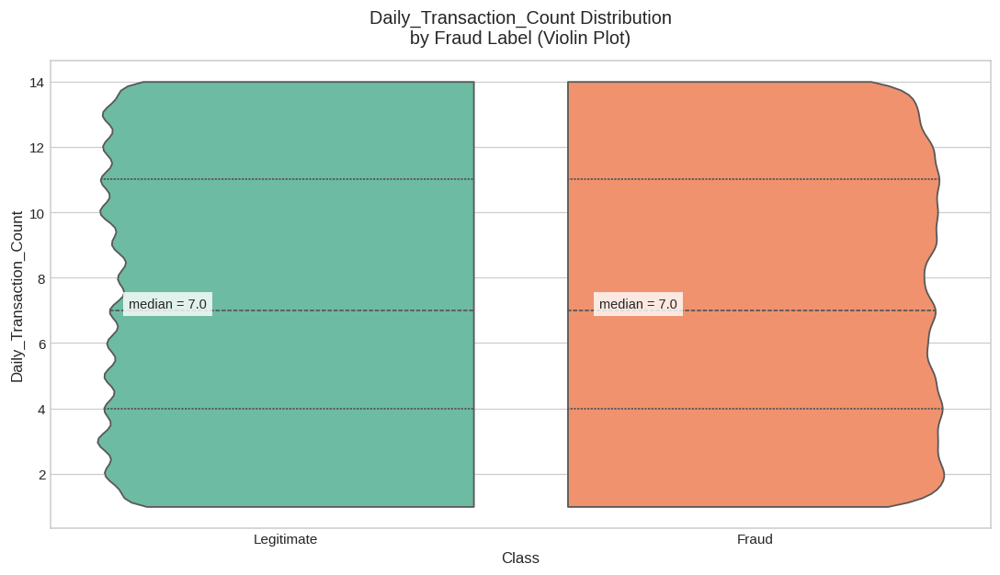

→ Daily_Transaction_Count: compare shape, width, density peaks, tails between classes


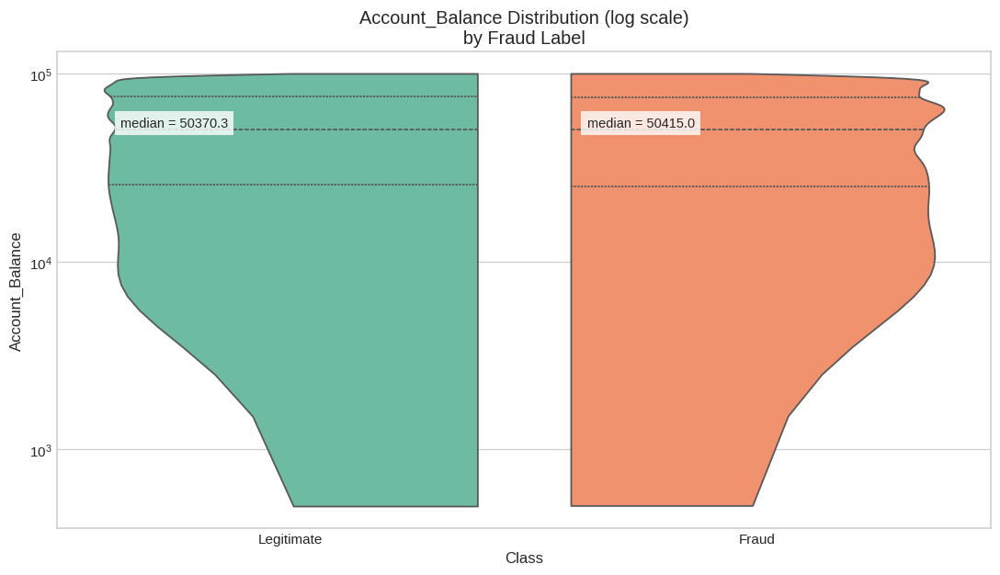

→ Account_Balance: compare shape, width, density peaks, tails between classes


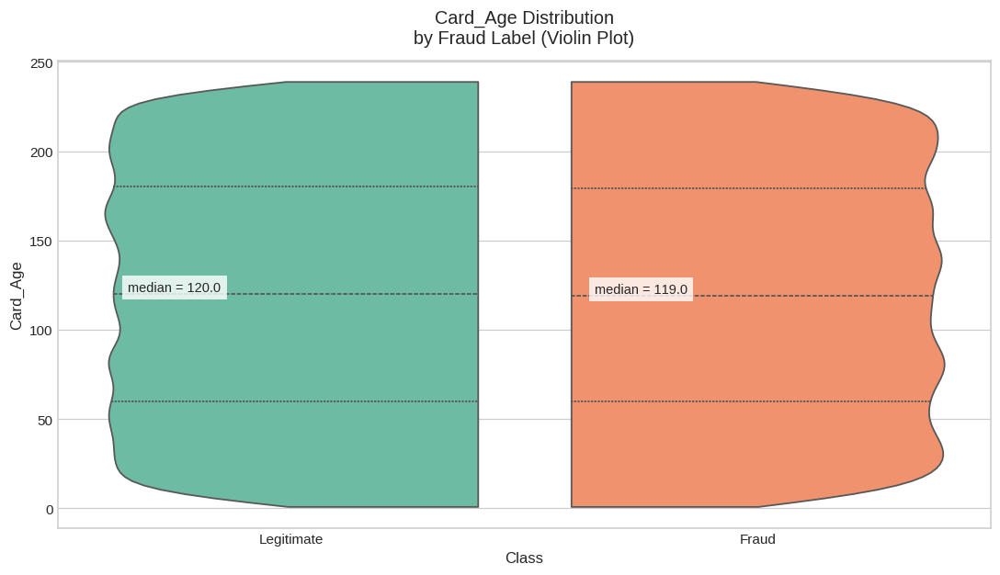

→ Card_Age: compare shape, width, density peaks, tails between classes


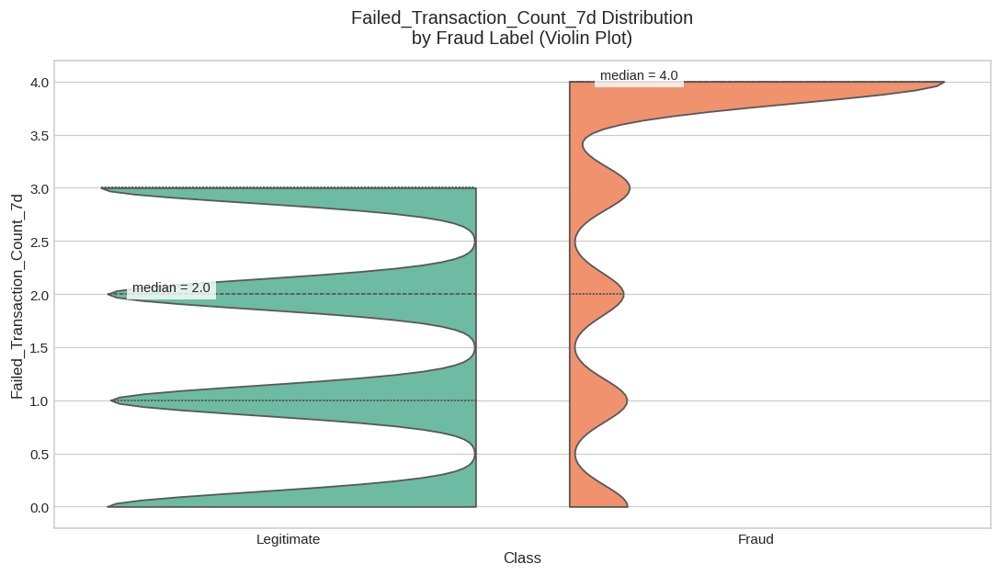

→ Failed_Transaction_Count_7d: compare shape, width, density peaks, tails between classes


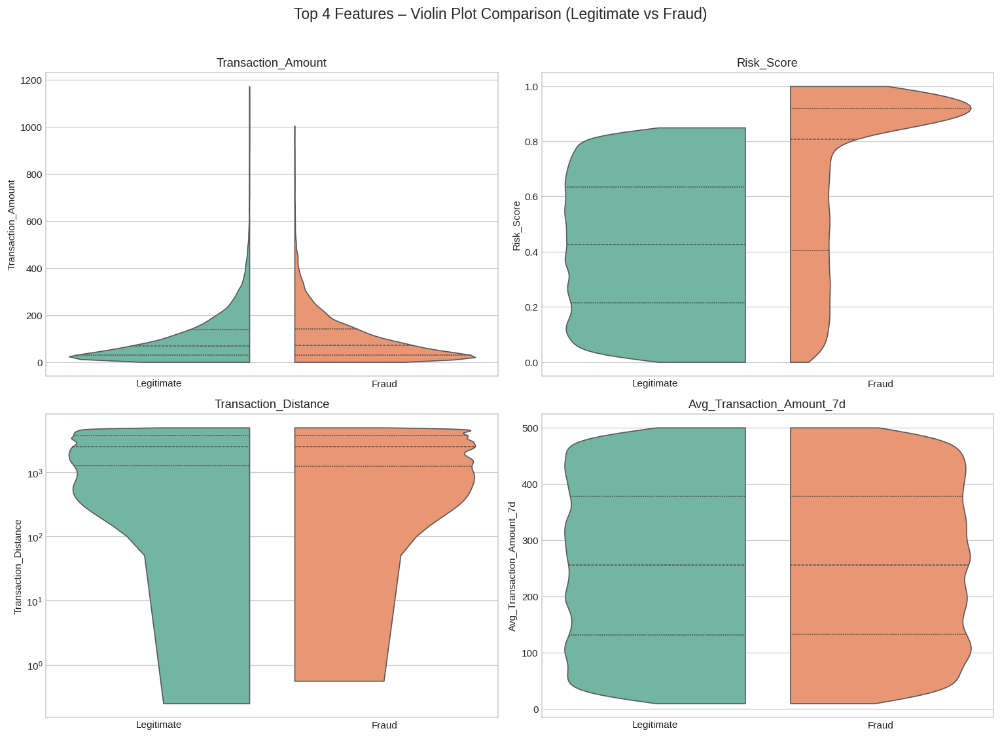


────────────────────────────────────────────────────────────────────────────────
What to look for in violin plots (especially useful in fraud detection):
  • Width of violin = density → where do most cases concentrate?
  • Shape asymmetry → fraud often has longer / fatter tails
  • Multiple peaks → different fraud patterns / clusters?
  • Separation of bodies → how much overlap between legit & fraud?
  • Position of quartiles & median → systematic shift?
  • Extreme tails → fraud tends to live in the tails of many variables
────────────────────────────────────────────────────────────────────────────────

Next steps could include:
• Statistical tests (e.g. Mann-Whitney U) to quantify distribution difference
• Feature engineering based on observed patterns
• Modeling (tree-based models love these kinds of signals)


In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling – violin plots look best with clean design
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette(['#66c2a5', '#fc8d62'])   # Legitimate, Fraud
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (10, 5.8)

# ────────────────────────────────────────────────
#  Load data & prepare target label
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

# Nicer labels for plots
df['Fraud'] = df['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

print("Generating important violin plots — numerical features vs Fraud Label\n")

# ────────────────────────────────────────────────
#  Most informative numerical features for fraud detection
# ────────────────────────────────────────────────
key_features = [
    'Transaction_Amount',
    'Risk_Score',
    'Transaction_Distance',
    'Avg_Transaction_Amount_7d',
    'Daily_Transaction_Count',
    'Account_Balance',
    'Card_Age',
    'Failed_Transaction_Count_7d'
]

# ────────────────────────────────────────────────
#  Create violin plots – one by one
# ────────────────────────────────────────────────
for feature in key_features:
    if feature not in df.columns:
        print(f"→ Skipping {feature} (column not found)")
        continue

    plt.figure()

    ax = sns.violinplot(
        data=df,
        x='Fraud',
        y=feature,
        hue='Fraud',
        split=True,               # split violins to compare shapes directly
        inner='quartile',         # show quartiles inside
        linewidth=1.2,
        saturation=0.85,
        cut=0                     # no extension beyond data
    )

    # Titles & labels
    plt.title(f'{feature} Distribution\nby Fraud Label (Violin Plot)', fontsize=13, pad=12)
    plt.xlabel('Class', fontsize=11)
    plt.ylabel(feature, fontsize=11)

    # Median annotation
    medians = df.groupby('Fraud')[feature].median()
    for i, fraud_type in enumerate(['Legitimate', 'Fraud']):
        y_pos = medians[fraud_type]
        plt.text(i - 0.25, y_pos, f'median = {y_pos:.1f}',
                 ha='center', va='bottom', fontsize=9.5,
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Log scale for strongly skewed variables
    log_scale_features = ['Transaction_Amount', 'Account_Balance', 'Transaction_Distance']
    if feature in log_scale_features and (df[feature] > 0).all():
        plt.yscale('log')
        plt.title(f'{feature} Distribution (log scale)\nby Fraud Label', fontsize=13)

    # Remove duplicate legend
    if ax.get_legend() is not None:
        ax.get_legend().remove()

    plt.tight_layout()
    plt.show()

    print(f"→ {feature}: compare shape, width, density peaks, tails between classes")

# ────────────────────────────────────────────────
#  Compact multi-panel version – top 4 most discriminative features
# ────────────────────────────────────────────────
top_features = [
    'Transaction_Amount',
    'Risk_Score',
    'Transaction_Distance',
    'Avg_Transaction_Amount_7d'
]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flat

for i, feature in enumerate(top_features):
    if feature not in df.columns:
        continue

    sns.violinplot(
        data=df,
        x='Fraud',
        y=feature,
        hue='Fraud',
        split=True,
        inner='quartile',
        ax=axes[i],
        cut=0,
        linewidth=1.1
    )

    axes[i].set_title(feature, fontsize=12)
    axes[i].set_xlabel('')

    # Log scale where appropriate
    if feature in ['Transaction_Amount', 'Transaction_Distance']:
        if (df[feature] > 0).all():
            axes[i].set_yscale('log')

    # Safely remove legend if present
    if axes[i].get_legend() is not None:
        axes[i].get_legend().remove()

plt.suptitle('Top 4 Features – Violin Plot Comparison (Legitimate vs Fraud)', fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

print("\n" + "─"*80)
print("What to look for in violin plots (especially useful in fraud detection):")
print("  • Width of violin = density → where do most cases concentrate?")
print("  • Shape asymmetry → fraud often has longer / fatter tails")
print("  • Multiple peaks → different fraud patterns / clusters?")
print("  • Separation of bodies → how much overlap between legit & fraud?")
print("  • Position of quartiles & median → systematic shift?")
print("  • Extreme tails → fraud tends to live in the tails of many variables")
print("─"*80)

print("\nNext steps could include:")
print("• Statistical tests (e.g. Mann-Whitney U) to quantify distribution difference")
print("• Feature engineering based on observed patterns")
print("• Modeling (tree-based models love these kinds of signals)")

Loading dataset...
Full dataset shape: (50000, 22)
Selected numerical columns for visualization: 7
['Transaction_Amount', 'Risk_Score', 'Transaction_Distance', 'Avg_Transaction_Amount_7d', 'Daily_Transaction_Count', 'Account_Balance', 'Card_Age']
Sample shape for pairplot: (20067, 22)  (fraud: 16067, legit: 4000)

Generating pairplot...


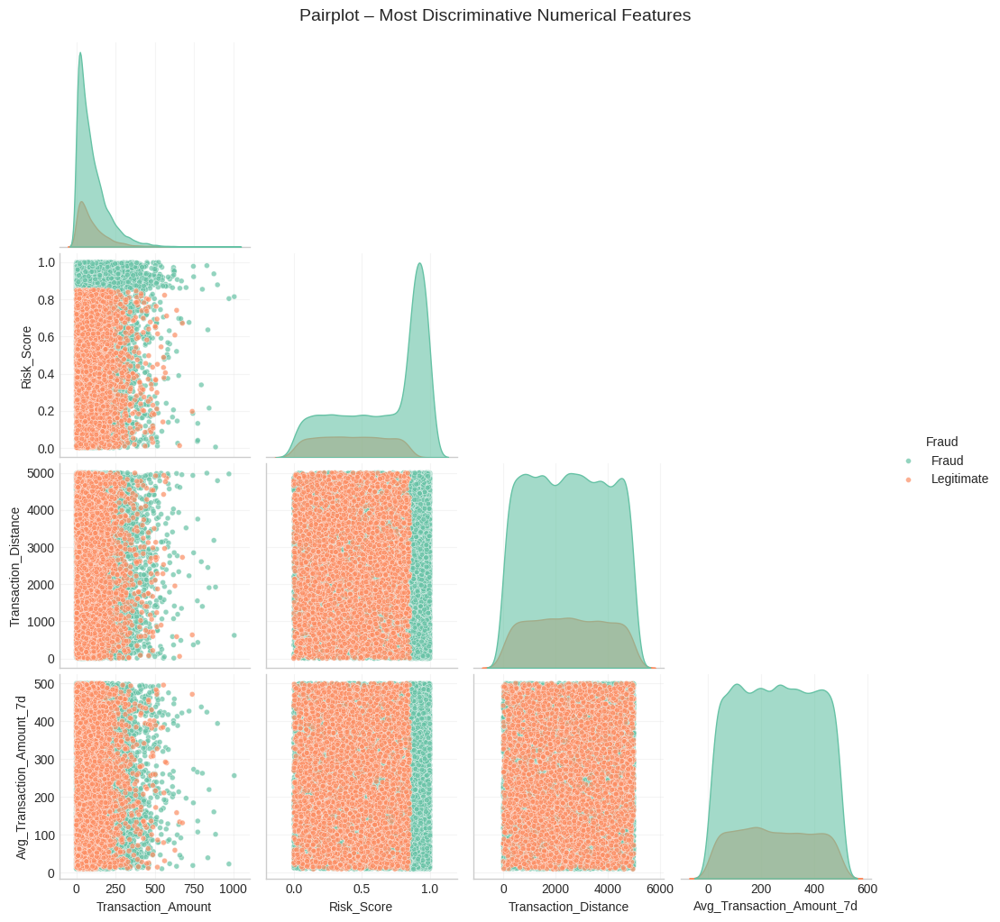

→ Interpretation guide for pairplot:
  • Look for clusters / separation in scatter plots
  • Check diagonal KDEs → different shapes / locations?
  • Fraud often appears in tails or isolated regions

Generating targeted scatter plots...


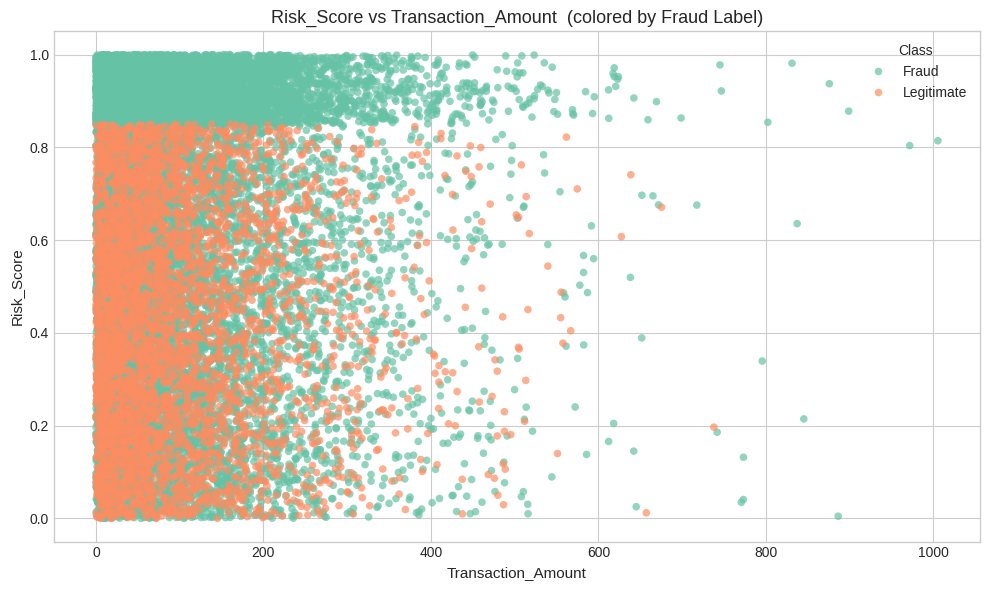

→ Risk_Score vs Transaction_Amount: look for fraud patterns in corners / tails


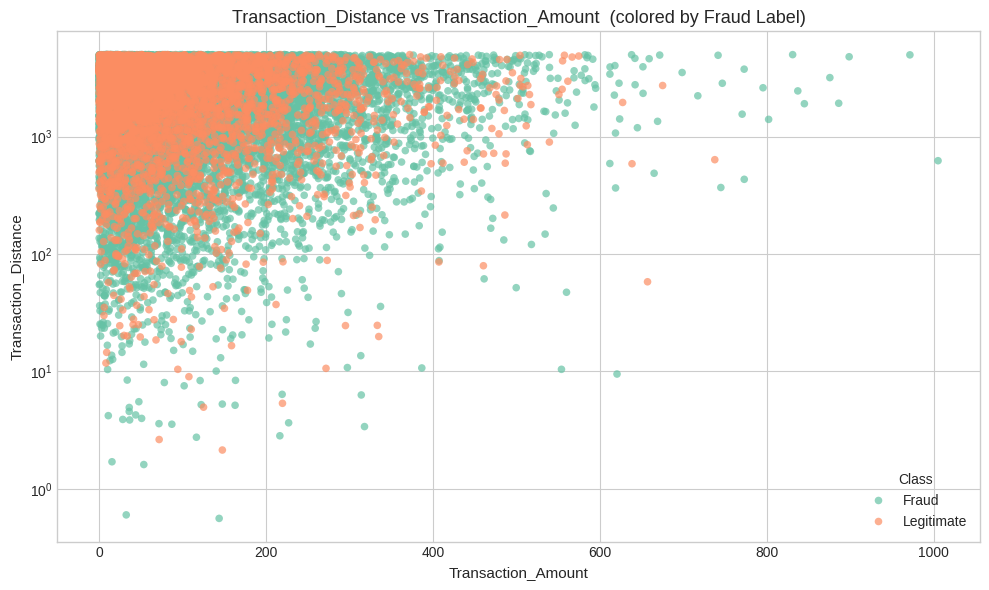

→ Transaction_Distance vs Transaction_Amount: look for fraud patterns in corners / tails


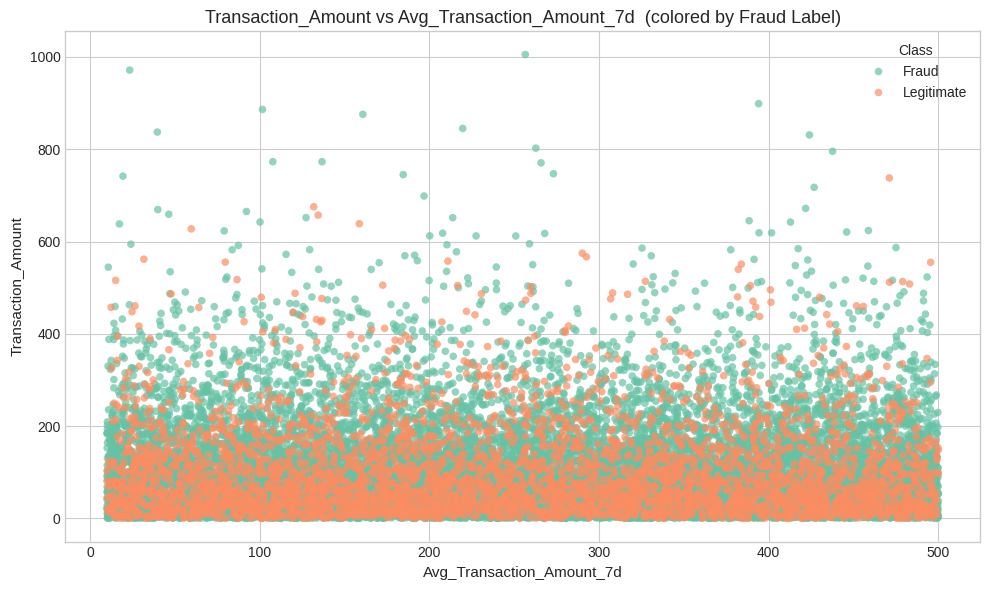

→ Transaction_Amount vs Avg_Transaction_Amount_7d: look for fraud patterns in corners / tails


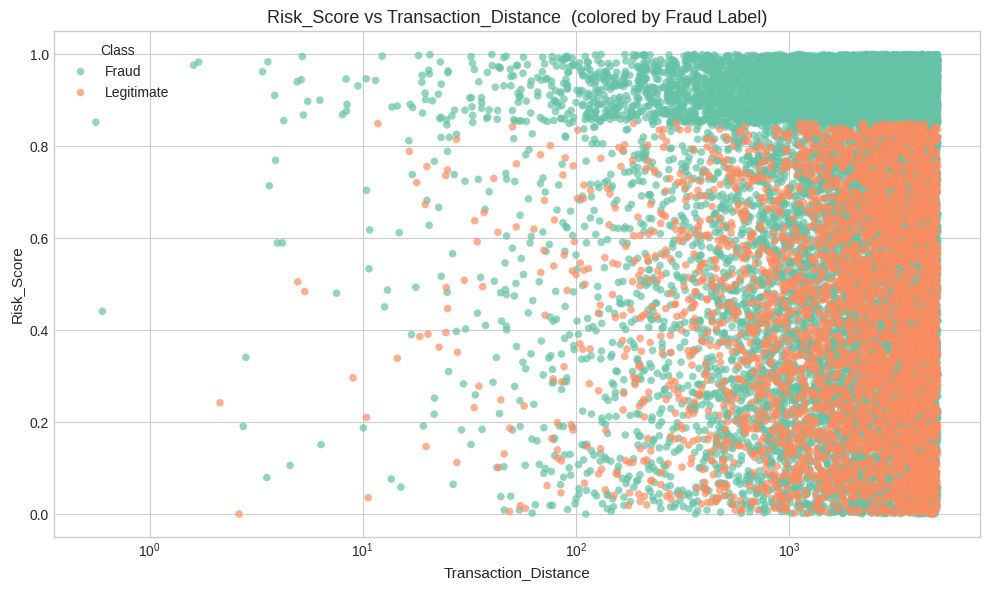

→ Risk_Score vs Transaction_Distance: look for fraud patterns in corners / tails


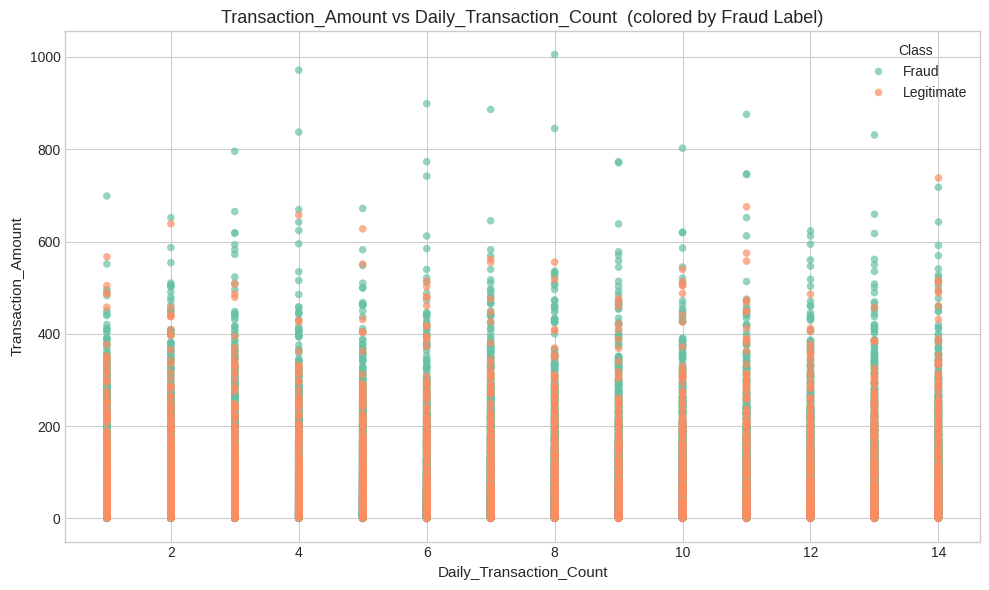

→ Transaction_Amount vs Daily_Transaction_Count: look for fraud patterns in corners / tails

────────────────────────────────────────────────────────────────────────────────
Key things to look for in scatter & pair plots:
  • Clear separation between fraud & legitimate points
  • Fraud appearing in specific regions (high amount + high distance, etc.)
  • Different correlation structure between classes
  • Isolated fraud points or small clusters
  • Whether fraud lives mostly in tails / extreme values
────────────────────────────────────────────────────────────────────────────────

Tip: If pairplot is too slow or crowded → reduce to 3–4 variables or sample even more aggressively.


In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ────────────────────────────────────────────────
#  Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette(['#66c2a5', '#fc8d62'])   # Legit, Fraud
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (12, 10)

# ────────────────────────────────────────────────
#  Load data & prepare fraud label
# ────────────────────────────────────────────────
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

# Map for nicer legend
df['Fraud'] = df['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

print(f"Full dataset shape: {df.shape}")

# ────────────────────────────────────────────────
#  Select most promising numerical features for pairplot
# ────────────────────────────────────────────────
important_num_cols = [
    'Transaction_Amount',
    'Risk_Score',
    'Transaction_Distance',
    'Avg_Transaction_Amount_7d',
    'Daily_Transaction_Count',
    'Account_Balance',
    'Card_Age',
    # 'Failed_Transaction_Count_7d'   # often very skewed / low variance
]

# Only columns that actually exist
num_cols = [c for c in important_num_cols if c in df.columns]

print(f"Selected numerical columns for visualization: {len(num_cols)}")
print(num_cols)

# ────────────────────────────────────────────────
#  Strategy: sample strongly (fraud is rare)
# ────────────────────────────────────────────────
# Take all fraud cases + balanced / random sample of legitimate
fraud = df[df['Fraud_Label'] == 1]
legit = df[df['Fraud_Label'] == 0].sample(n=min(4000, len(df)-len(fraud)), random_state=42)

df_sample = pd.concat([fraud, legit], ignore_index=True)

print(f"Sample shape for pairplot: {df_sample.shape}  "
      f"(fraud: {len(fraud)}, legit: {len(legit)})")

# ────────────────────────────────────────────────
#  1. Pairplot – best subset of features
# ────────────────────────────────────────────────
print("\nGenerating pairplot...")

# Choose 4–6 most interesting variables (pairplot becomes too heavy otherwise)
selected_for_pair = [
    'Transaction_Amount',
    'Risk_Score',
    'Transaction_Distance',
    'Avg_Transaction_Amount_7d',
    # 'Daily_Transaction_Count'   # uncomment if discrete & interesting
]

selected_for_pair = [c for c in selected_for_pair if c in df_sample.columns]

if len(selected_for_pair) >= 3:
    g = sns.pairplot(
        data=df_sample,
        vars=selected_for_pair,
        hue='Fraud',
        diag_kind='kde',
        corner=True,
        plot_kws={'s': 18, 'alpha': 0.7},
        diag_kws={'alpha': 0.6}
    )

    g.fig.suptitle("Pairplot – Most Discriminative Numerical Features",
                   y=1.02, fontsize=14)

    # Optional: improve visibility of small fraud points
    for ax in g.axes.flat:
        if ax is not None:
            ax.grid(True, alpha=0.2)

    plt.show()

    print("→ Interpretation guide for pairplot:")
    print("  • Look for clusters / separation in scatter plots")
    print("  • Check diagonal KDEs → different shapes / locations?")
    print("  • Fraud often appears in tails or isolated regions")
else:
    print("Not enough numerical columns selected for pairplot")

# ────────────────────────────────────────────────
#  2. Selected individual scatter plots (more controllable)
# ────────────────────────────────────────────────
print("\nGenerating targeted scatter plots...")

scatter_pairs = [
    ('Transaction_Amount',      'Risk_Score'),
    ('Transaction_Amount',      'Transaction_Distance'),
    ('Avg_Transaction_Amount_7d','Transaction_Amount'),
    ('Transaction_Distance',    'Risk_Score'),
    ('Daily_Transaction_Count', 'Transaction_Amount'),
]

for x_var, y_var in scatter_pairs:
    if x_var not in df_sample.columns or y_var not in df_sample.columns:
        continue

    plt.figure(figsize=(10, 6))

    sns.scatterplot(
        data=df_sample,
        x=x_var,
        y=y_var,
        hue='Fraud',
        alpha=0.7,
        s=30,
        edgecolor=None,
        linewidth=0
    )

    plt.title(f"{y_var} vs {x_var}  (colored by Fraud Label)", fontsize=13)
    plt.xlabel(x_var, fontsize=11)
    plt.ylabel(y_var, fontsize=11)

    # Log scales where appropriate
    if x_var in ['Transaction_Amount', 'Transaction_Distance', 'Account_Balance']:
        if (df_sample[x_var] > 0).all():
            plt.xscale('log')
    if y_var in ['Transaction_Amount', 'Transaction_Distance', 'Account_Balance']:
        if (df_sample[y_var] > 0).all():
            plt.yscale('log')

    plt.legend(title='Class', loc='best')
    plt.tight_layout()
    plt.show()

    print(f"→ {y_var} vs {x_var}: look for fraud patterns in corners / tails")

print("\n" + "─"*80)
print("Key things to look for in scatter & pair plots:")
print("  • Clear separation between fraud & legitimate points")
print("  • Fraud appearing in specific regions (high amount + high distance, etc.)")
print("  • Different correlation structure between classes")
print("  • Isolated fraud points or small clusters")
print("  • Whether fraud lives mostly in tails / extreme values")
print("─"*80)

print("\nTip: If pairplot is too slow or crowded → reduce to 3–4 variables or sample even more aggressively.")

Dataset loaded. Shape: (50000, 21)
Creating correlation heatmap...

Selected numerical columns for correlation: 12
['Transaction_Amount', 'Account_Balance', 'Transaction_Distance', 'Risk_Score', 'Daily_Transaction_Count', 'Avg_Transaction_Amount_7d', 'Failed_Transaction_Count_7d', 'Card_Age', 'IP_Address_Flag', 'Previous_Fraudulent_Activity', 'Is_Weekend', 'Fraud_Label']


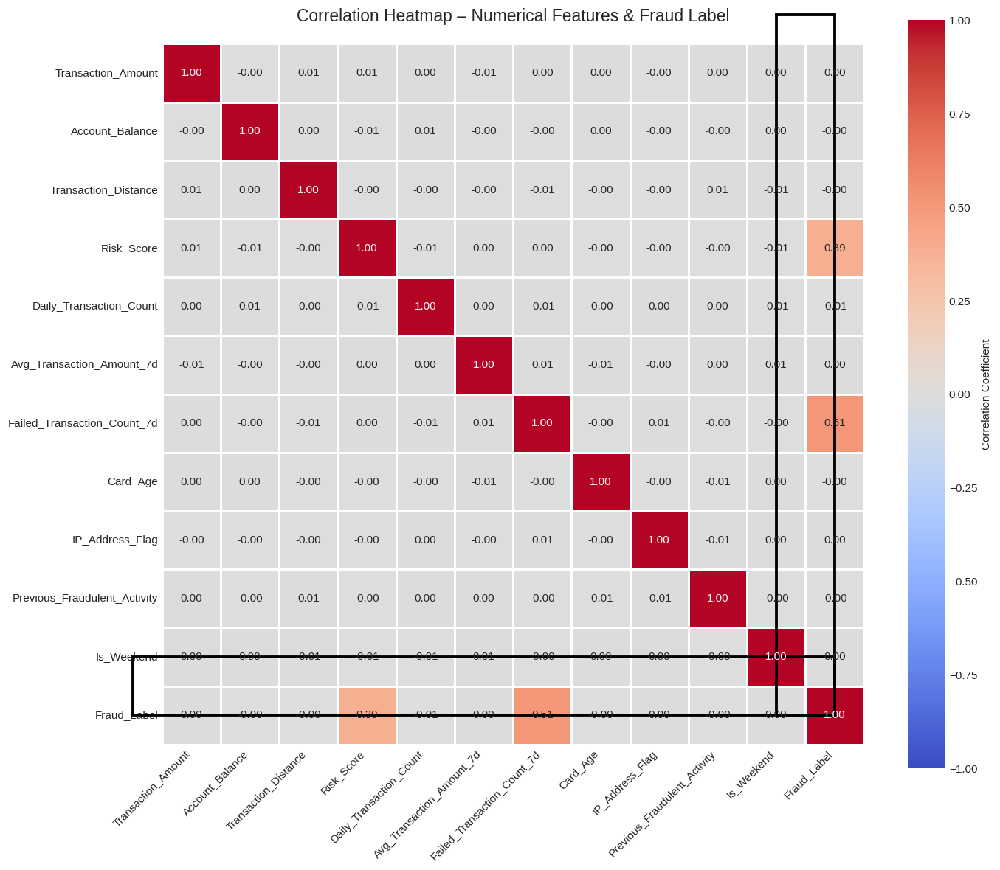


Correlation with Fraud_Label (sorted):
──────────────────────────────────────
Fraud_Label                     1.0000
Failed_Transaction_Count_7d     0.5099
Risk_Score                      0.3858
IP_Address_Flag                 0.0030
Transaction_Amount              0.0019
Avg_Transaction_Amount_7d       0.0007
Is_Weekend                      0.0001
Transaction_Distance           -0.0001
Previous_Fraudulent_Activity   -0.0007
Card_Age                       -0.0031
Account_Balance                -0.0032
Daily_Transaction_Count        -0.0071
Name: Fraud_Label, dtype: float64

Top positive correlations with fraud (highest first):
Fraud_Label                    1.0000
Failed_Transaction_Count_7d    0.5099
Risk_Score                     0.3858
IP_Address_Flag                0.0030
Transaction_Amount             0.0019
Avg_Transaction_Amount_7d      0.0007
Is_Weekend                     0.0001
Transaction_Distance          -0.0001
Name: Fraud_Label, dtype: float64

Strongest negative correl

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling – makes heatmap more readable
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (12, 10)

# ────────────────────────────────────────────────
#  Load the dataset
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

print("Dataset loaded. Shape:", df.shape)
print("Creating correlation heatmap...\n")

# ────────────────────────────────────────────────
#  Select numerical features that are most relevant for correlation
# ────────────────────────────────────────────────
numerical_features = [
    'Transaction_Amount',
    'Account_Balance',
    'Transaction_Distance',
    'Risk_Score',
    'Daily_Transaction_Count',
    'Avg_Transaction_Amount_7d',
    'Failed_Transaction_Count_7d',
    'Card_Age',
    'IP_Address_Flag',
    'Previous_Fraudulent_Activity',
    'Is_Weekend',
    'Fraud_Label'           # very important to include the target
]

# Keep only columns that actually exist in the dataset
num_cols = [col for col in numerical_features if col in df.columns]

print(f"Selected numerical columns for correlation: {len(num_cols)}")
print(num_cols)

# ────────────────────────────────────────────────
#  Calculate correlation matrix
# ────────────────────────────────────────────────
corr_matrix = df[num_cols].corr()

# ────────────────────────────────────────────────
#  Create the heatmap
# ────────────────────────────────────────────────
plt.figure(figsize=(13, 11))

# Use diverging colormap – red for positive, blue for negative
sns.heatmap(
    corr_matrix,
    annot=True,              # show correlation values
    fmt=".2f",               # two decimal places
    cmap='coolwarm',         # red-blue diverging
    vmin=-1, vmax=1,         # full correlation range
    center=0,
    linewidths=0.8,
    linecolor='white',
    square=True,
    cbar_kws={'label': 'Correlation Coefficient'}
)

# Improve readability
plt.title("Correlation Heatmap – Numerical Features & Fraud Label",
          fontsize=15, pad=20)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

# Optional: highlight Fraud_Label row/column
plt.gca().add_patch(plt.Rectangle((-0.5, len(num_cols)-1-0.5),
                                  len(num_cols), 1,
                                  fill=False, edgecolor='black', lw=2.5, clip_on=False))
plt.gca().add_patch(plt.Rectangle((len(num_cols)-1-0.5, -0.5),
                                  1, len(num_cols),
                                  fill=False, edgecolor='black', lw=2.5, clip_on=False))

plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
#  Print strongest correlations with target (Fraud_Label)
# ────────────────────────────────────────────────
if 'Fraud_Label' in corr_matrix.columns:
    fraud_corr = corr_matrix['Fraud_Label'].sort_values(ascending=False)

    print("\nCorrelation with Fraud_Label (sorted):")
    print("──────────────────────────────────────")
    print(fraud_corr.round(4))
    print()

    print("Top positive correlations with fraud (highest first):")
    print(fraud_corr.head(8).round(4))
    print()

    print("Strongest negative correlations with fraud:")
    print(fraud_corr.tail(5).round(4))

print("\n" + "═"*70)
print("How to interpret this heatmap in fraud detection:")
print("───────────────────────────────────────────────")
print("• Dark red    → strong positive correlation")
print("• Dark blue   → strong negative correlation")
print("• Near white  → almost no linear relationship")
print()
print("Most important observations to look for:")
print("  1. Which features have the strongest correlation with Fraud_Label?")
print("  2. Risk_Score usually shows the highest positive correlation")
print("  3. Are there high correlations between predictors themselves?")
print("     → multicollinearity warning (e.g. amount vs avg_7d)")
print("  4. Unexpected negative correlations (sometimes very insightful)")
print("  5. Low correlation doesn't mean useless feature")
print("     → many fraud signals are non-linear")
print("═"*70)

Starting feature engineering visualization...



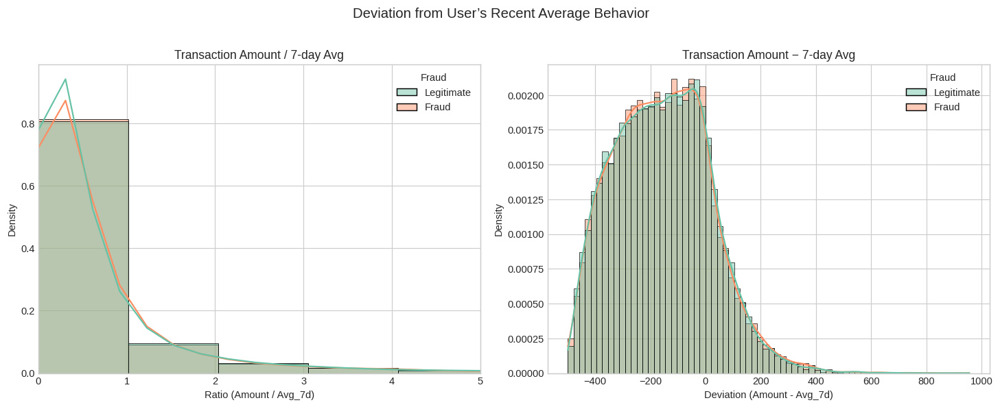

→ Large positive deviation or very high ratio → strong fraud signal in many datasets


/tmp/ipykernel_1236/2431460233.py:91: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipykernel_1236/2431460233.py:91: UserWarning: Glyph 8346 (\N{LATIN SUBSCRIPT SMALL LETTER P}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8346 (\N{LATIN SUBSCRIPT SMALL LETTER P}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


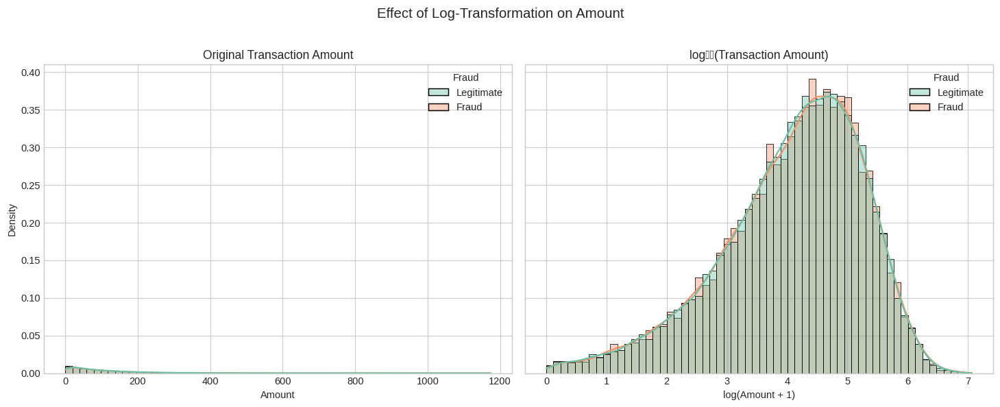

/tmp/ipykernel_1236/2431460233.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Class')


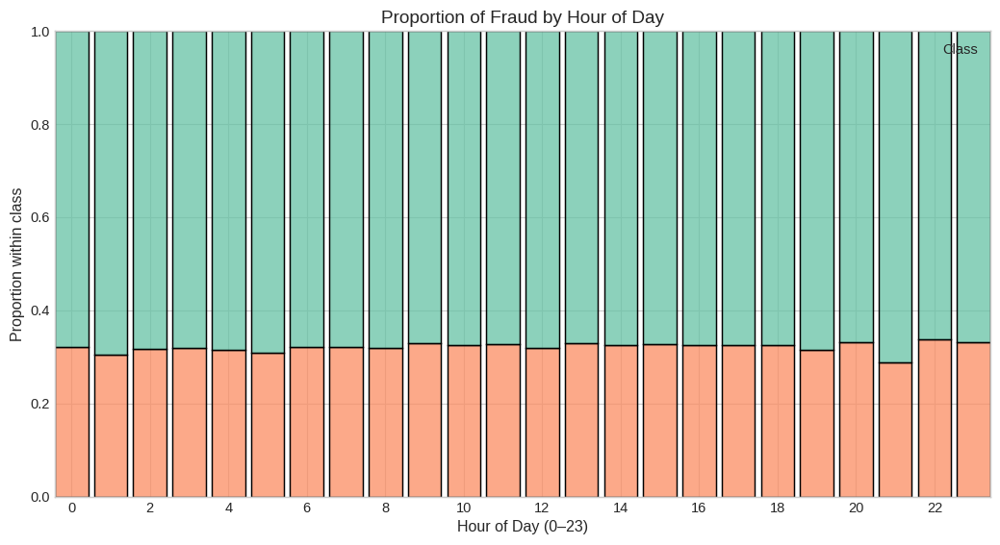

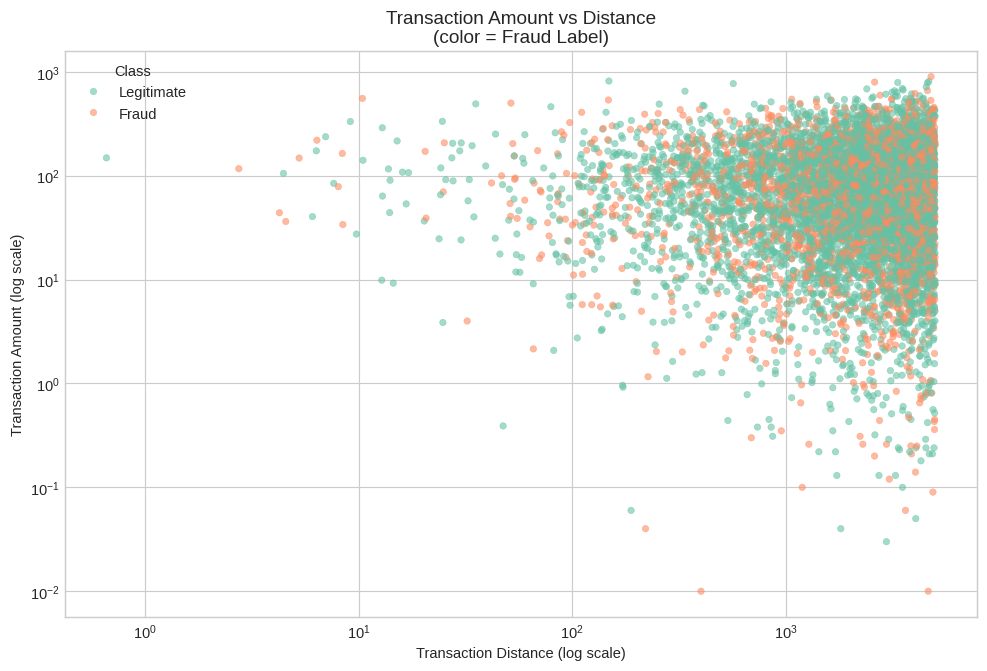


All plots generated.


In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette(['#66c2a5', '#fc8d62'])  # Legit vs Fraud
plt.rcParams['figure.dpi'] = 105
plt.rcParams['figure.figsize'] = (10, 5.5)

# ────────────────────────────────────────────────
#  Load & prepare data
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

df['Fraud'] = df['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

# Make sure Timestamp is datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')

print("Starting feature engineering visualization...\n")

# ────────────────────────────────────────────────
#  1. Amount vs 7-day average — deviation features
# ────────────────────────────────────────────────
df['amount_vs_avg_7d'] = df['Transaction_Amount'] / df['Avg_Transaction_Amount_7d'].replace(0, np.nan)
df['amount_deviation'] = df['Transaction_Amount'] - df['Avg_Transaction_Amount_7d']

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

# Left: ratio
sns.histplot(
    data=df,
    x='amount_vs_avg_7d',
    hue='Fraud',
    kde=True,
    stat='density',
    common_norm=False,
    bins=60,
    alpha=0.45,
    ax=axes[0]
)
axes[0].set_title('Transaction Amount / 7-day Avg', fontsize=12)
axes[0].set_xlabel('Ratio (Amount / Avg_7d)')
axes[0].set_xlim(0, 5)

# Right: deviation
sns.histplot(
    data=df,
    x='amount_deviation',
    hue='Fraud',
    kde=True,
    stat='density',
    common_norm=False,
    bins=70,
    alpha=0.45,
    ax=axes[1]
)
axes[1].set_title('Transaction Amount − 7-day Avg', fontsize=12)
axes[1].set_xlabel('Deviation (Amount - Avg_7d)')

plt.suptitle('Deviation from User’s Recent Average Behavior', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

print("→ Large positive deviation or very high ratio → strong fraud signal in many datasets")

# ────────────────────────────────────────────────
#  2. Log transformation – Transaction Amount
# ────────────────────────────────────────────────
df['log_amount'] = np.log1p(df['Transaction_Amount'].clip(lower=0))

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5), sharey=True)

sns.histplot(data=df, x='Transaction_Amount', hue='Fraud',
             kde=True, stat='density', common_norm=False,
             bins=60, alpha=0.4, ax=axes[0])
axes[0].set_title('Original Transaction Amount', fontsize=12)
axes[0].set_xlabel('Amount')

sns.histplot(data=df, x='log_amount', hue='Fraud',
             kde=True, stat='density', common_norm=False,
             bins=60, alpha=0.4, ax=axes[1])
axes[1].set_title('log₁ₚ(Transaction Amount)', fontsize=12)
axes[1].set_xlabel('log(Amount + 1)')

plt.suptitle('Effect of Log-Transformation on Amount', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
#  3. Hour of day – fraud often has time pattern
# ────────────────────────────────────────────────
df['hour'] = df['Timestamp'].dt.hour

plt.figure(figsize=(10, 5.5))

sns.histplot(
    data=df,
    x='hour',
    hue='Fraud',
    multiple='fill',
    stat='proportion',
    discrete=True,
    shrink=0.85,
    alpha=0.75
)

plt.title('Proportion of Fraud by Hour of Day', fontsize=13)
plt.xlabel('Hour of Day (0–23)', fontsize=11)
plt.ylabel('Proportion within class', fontsize=11)
plt.xticks(range(0, 24, 2))
plt.legend(title='Class')
plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
#  4. Transaction Distance vs Amount – classic fraud zone
# ────────────────────────────────────────────────
plt.figure(figsize=(9.5, 6.5))

sns.scatterplot(
    data=df.sample(8000, random_state=42),
    x='Transaction_Distance',
    y='Transaction_Amount',
    hue='Fraud',
    alpha=0.6,
    s=20,
    edgecolor=None
)

plt.xscale('log')
plt.yscale('log')
plt.title('Transaction Amount vs Distance\n(color = Fraud Label)', fontsize=13)
plt.xlabel('Transaction Distance (log scale)')
plt.ylabel('Transaction Amount (log scale)')
plt.legend(title='Class', loc='upper left')
plt.tight_layout()
plt.show()

print("\nAll plots generated.")

Loading data and preparing time features...
Date range: 2023-01-01 → 2023-12-31
----------------------------------------------------------------------


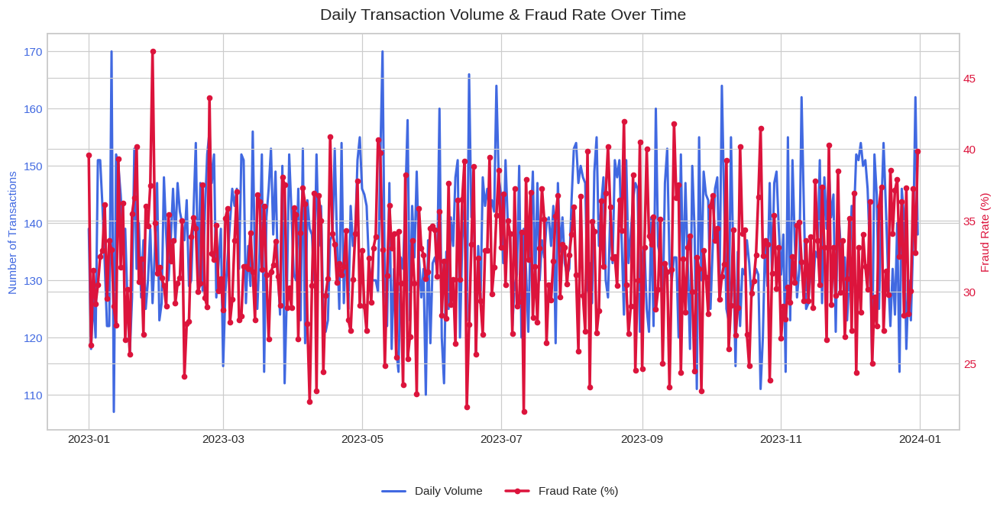

→ Look for: sudden volume spikes, periods of elevated fraud rate, seasonality


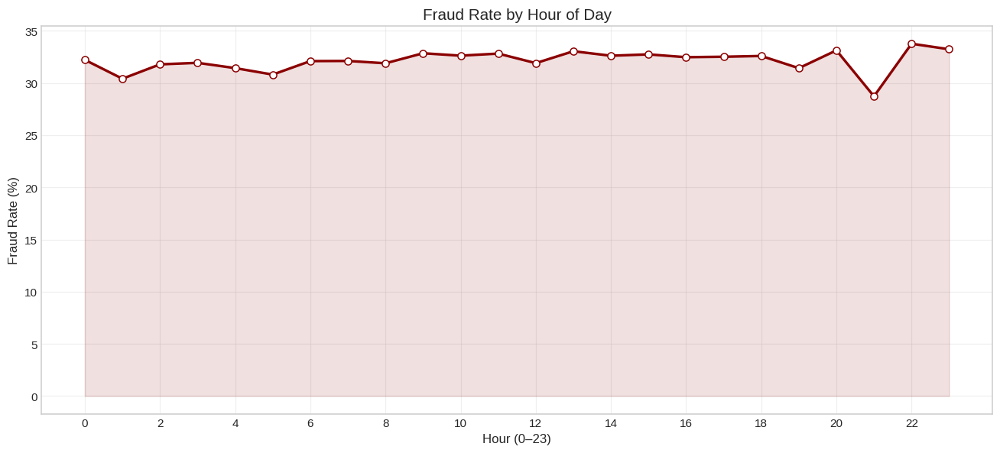

→ Night / early morning hours often show elevated fraud probability


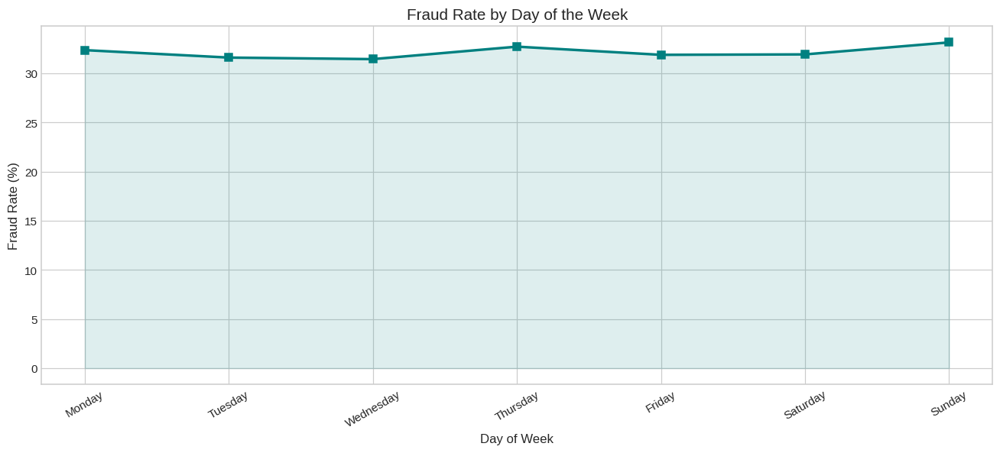

→ Weekend vs weekday difference — often visible in real datasets


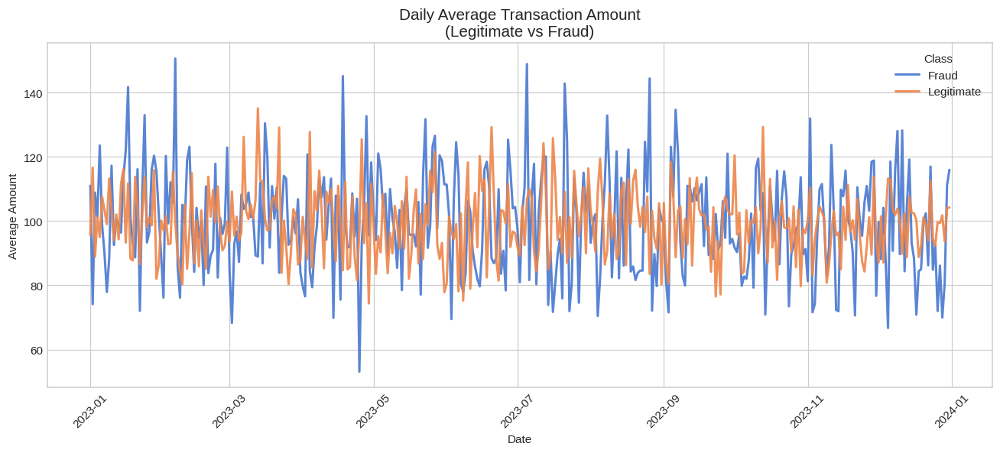

→ Look for periods where fraud average amount behaves differently


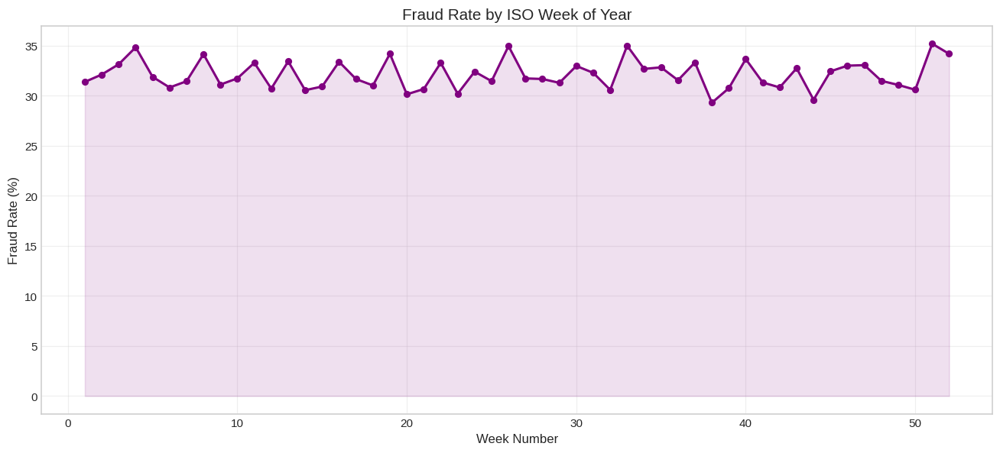

→ Useful to detect yearly seasonality or campaign-like behavior

───────────────────────────────────────────────────────────────────────────
Most valuable time series plots in fraud detection:
  1. Daily volume + fraud rate (twin axis)        → campaign / anomaly detection
  2. Fraud rate by hour of day                     → classic night fraud pattern
  3. Fraud rate by day of week                     → weekend vs weekday difference
  4. Average amount legit vs fraud over time       → behavioral change detection
  5. Weekly fraud rate                             → seasonality / long trends
───────────────────────────────────────────────────────────────────────────


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
#  Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (12, 5.5)

# ────────────────────────────────────────────────
#  Load & prepare time features
# ────────────────────────────────────────────────
print("Loading data and preparing time features...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')

# Basic time breakdowns
df['Date']       = df['Timestamp'].dt.date
df['Hour']       = df['Timestamp'].dt.hour
df['DayOfWeek']  = df['Timestamp'].dt.day_name()
df['DayOfWeekNum']= df['Timestamp'].dt.dayofweek   # 0 = Monday
df['Week']       = df['Timestamp'].dt.isocalendar().week
df['Month']      = df['Timestamp'].dt.month
df['is_fraud']   = df['Fraud_Label']

print(f"Date range: {df['Date'].min()} → {df['Date'].max()}")
print("-"*70)

# ────────────────────────────────────────────────
#  1. Daily transaction volume + fraud rate (twin axis)
# ────────────────────────────────────────────────
daily = df.groupby('Date').agg(
    volume=('Transaction_ID', 'count'),
    fraud_count=('is_fraud', 'sum'),
    fraud_rate=('is_fraud', 'mean')
).reset_index()

daily['fraud_rate_pct'] = daily['fraud_rate'] * 100

fig, ax1 = plt.subplots()

ax1.plot(daily['Date'], daily['volume'], color='royalblue', lw=2, label='Daily Volume')
ax1.set_ylabel('Number of Transactions', color='royalblue')
ax1.tick_params(axis='y', labelcolor='royalblue')

ax2 = ax1.twinx()
ax2.plot(daily['Date'], daily['fraud_rate_pct'], color='crimson', lw=2.3,
         marker='o', markersize=4, label='Fraud Rate (%)')
ax2.set_ylabel('Fraud Rate (%)', color='crimson')
ax2.tick_params(axis='y', labelcolor='crimson')

plt.title('Daily Transaction Volume & Fraud Rate Over Time', fontsize=14, pad=12)
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.04), ncol=2)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("→ Look for: sudden volume spikes, periods of elevated fraud rate, seasonality")

# ────────────────────────────────────────────────
#  2. Fraud rate by hour of day
# ────────────────────────────────────────────────
hourly = df.groupby('Hour').agg(
    fraud_rate=('is_fraud', 'mean'),
    count=('is_fraud', 'count')
).reset_index()

hourly['fraud_rate_pct'] = hourly['fraud_rate'] * 100

plt.figure()
plt.plot(hourly['Hour'], hourly['fraud_rate_pct'], color='darkred',
         marker='o', lw=2.2, markersize=6, markerfacecolor='white')
plt.fill_between(hourly['Hour'], hourly['fraud_rate_pct'], color='darkred', alpha=0.12)

plt.title('Fraud Rate by Hour of Day', fontsize=13.5)
plt.xlabel('Hour (0–23)', fontsize=11)
plt.ylabel('Fraud Rate (%)', fontsize=11)
plt.xticks(range(0, 24, 2))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("→ Night / early morning hours often show elevated fraud probability")

# ────────────────────────────────────────────────
#  3. Fraud rate by day of week
# ────────────────────────────────────────────────
dow_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

dow = df.groupby('DayOfWeek').agg(
    fraud_rate=('is_fraud', 'mean'),
    count=('is_fraud', 'count')
).reindex(dow_order).reset_index()

dow['fraud_rate_pct'] = dow['fraud_rate'] * 100

plt.figure()
plt.plot(dow['DayOfWeek'], dow['fraud_rate_pct'], color='teal',
         marker='s', lw=2.2, markersize=7)
plt.fill_between(range(len(dow_order)), dow['fraud_rate_pct'], color='teal', alpha=0.13)

plt.title('Fraud Rate by Day of the Week', fontsize=13.5)
plt.xlabel('Day of Week', fontsize=11)
plt.ylabel('Fraud Rate (%)', fontsize=11)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

print("→ Weekend vs weekday difference — often visible in real datasets")

# ────────────────────────────────────────────────
#  4. Average transaction amount — legit vs fraud over time
# ────────────────────────────────────────────────
daily_type = df.groupby(['Date', 'Fraud_Label']).agg(
    avg_amount=('Transaction_Amount', 'mean')
).reset_index()

daily_type['Fraud'] = daily_type['Fraud_Label'].map({0: 'Legitimate', 1: 'Fraud'})

plt.figure()
for fraud_type, group in daily_type.groupby('Fraud'):
    plt.plot(group['Date'], group['avg_amount'], label=fraud_type, lw=2, alpha=0.9)

plt.title('Daily Average Transaction Amount\n(Legitimate vs Fraud)', fontsize=13.5)
plt.xlabel('Date')
plt.ylabel('Average Amount')
plt.legend(title='Class', loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("→ Look for periods where fraud average amount behaves differently")

# ────────────────────────────────────────────────
#  5. Fraud rate by week of year (seasonality check)
# ────────────────────────────────────────────────
weekly = df.groupby('Week').agg(
    fraud_rate=('is_fraud', 'mean'),
    count=('is_fraud', 'count')
).reset_index()

weekly['fraud_rate_pct'] = weekly['fraud_rate'] * 100

plt.figure()
plt.plot(weekly['Week'], weekly['fraud_rate_pct'], color='purple',
         marker='o', lw=2, markersize=5)
plt.fill_between(weekly['Week'], weekly['fraud_rate_pct'], color='purple', alpha=0.12)

plt.title('Fraud Rate by ISO Week of Year', fontsize=13.5)
plt.xlabel('Week Number', fontsize=11)
plt.ylabel('Fraud Rate (%)', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("→ Useful to detect yearly seasonality or campaign-like behavior")

print("\n" + "─"*75)
print("Most valuable time series plots in fraud detection:")
print("  1. Daily volume + fraud rate (twin axis)        → campaign / anomaly detection")
print("  2. Fraud rate by hour of day                     → classic night fraud pattern")
print("  3. Fraud rate by day of week                     → weekend vs weekday difference")
print("  4. Average amount legit vs fraud over time       → behavioral change detection")
print("  5. Weekly fraud rate                             → seasonality / long trends")
print("─"*75)

Dataset loaded. Shape: (50000, 21)
Target column: 'Fraud_Label' (binary: 0=Legitimate, 1=Fraud)
----------------------------------------------------------------------
Features: 17 (Num: 11, Cat: 6)
Class distribution: Fraud_Label
0    0.679
1    0.321
Name: proportion, dtype: float64
Training Logistic Regression...
Logistic Regression - Accuracy: 0.793, ROC AUC: 0.892, PR AUC: 0.809
Training Random Forest...
Random Forest - Accuracy: 1.000, ROC AUC: 1.000, PR AUC: 1.000
Training MLP (Neural Net)...
MLP (Neural Net) - Accuracy: 0.996, ROC AUC: 1.000, PR AUC: 1.000
Training XGBoost...
XGBoost - Accuracy: 0.999, ROC AUC: 1.000, PR AUC: 1.000
Training LightGBM...
[LightGBM] [Info] Number of positive: 12050, number of negative: 25450
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1595
[

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM - Accuracy: 0.999, ROC AUC: 1.000, PR AUC: 1.000
Training CatBoost...
CatBoost - Accuracy: 1.000, ROC AUC: 1.000, PR AUC: 1.000


<Figure size 1200x600 with 0 Axes>

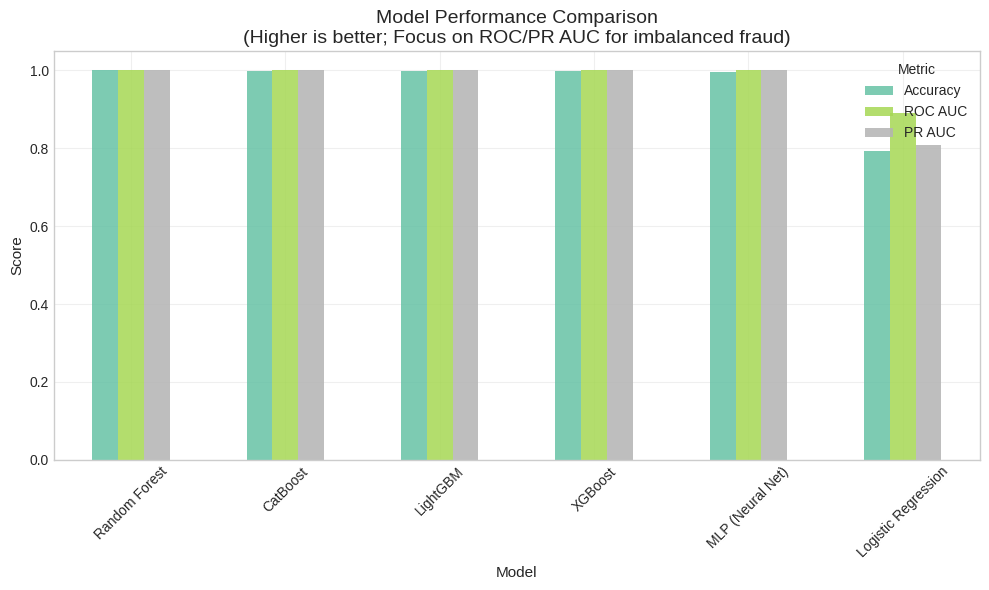

→ Comparison bar plot: ROC AUC & PR AUC are key for fraud (imbalanced classes)


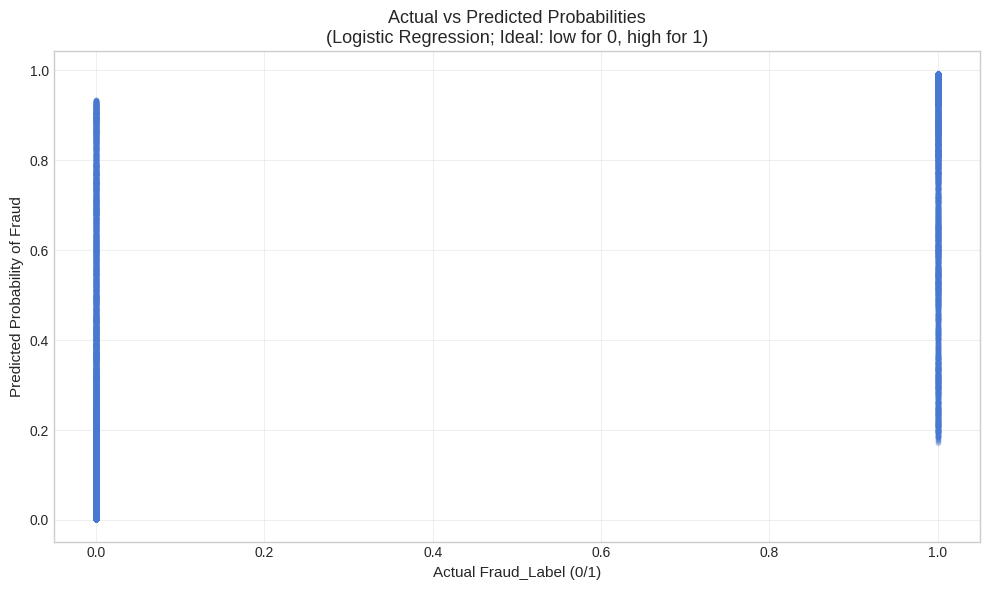

→ Logistic Regression: Good model shows clear separation; fraud points near 1, legit near 0


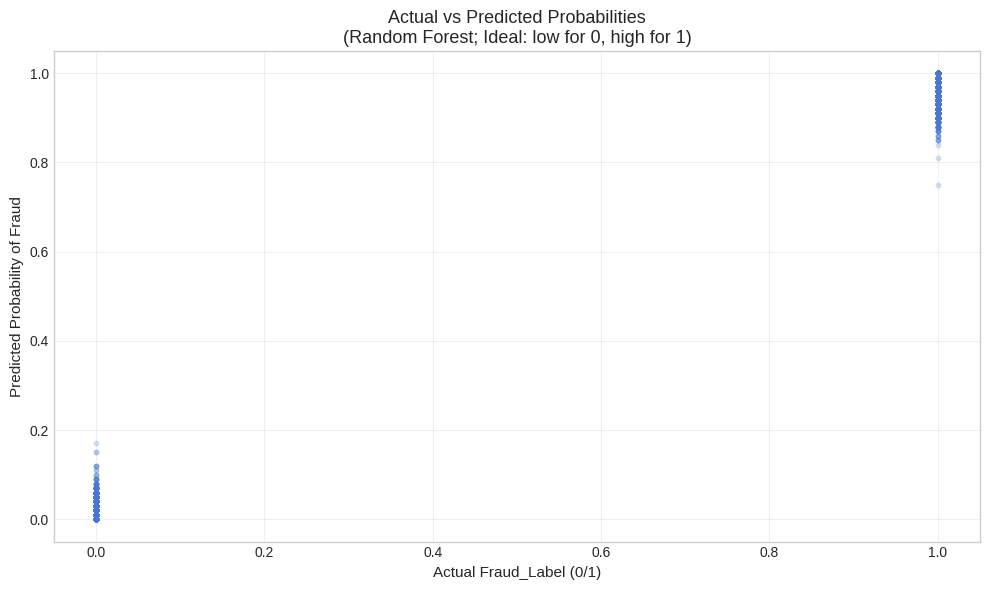

→ Random Forest: Good model shows clear separation; fraud points near 1, legit near 0


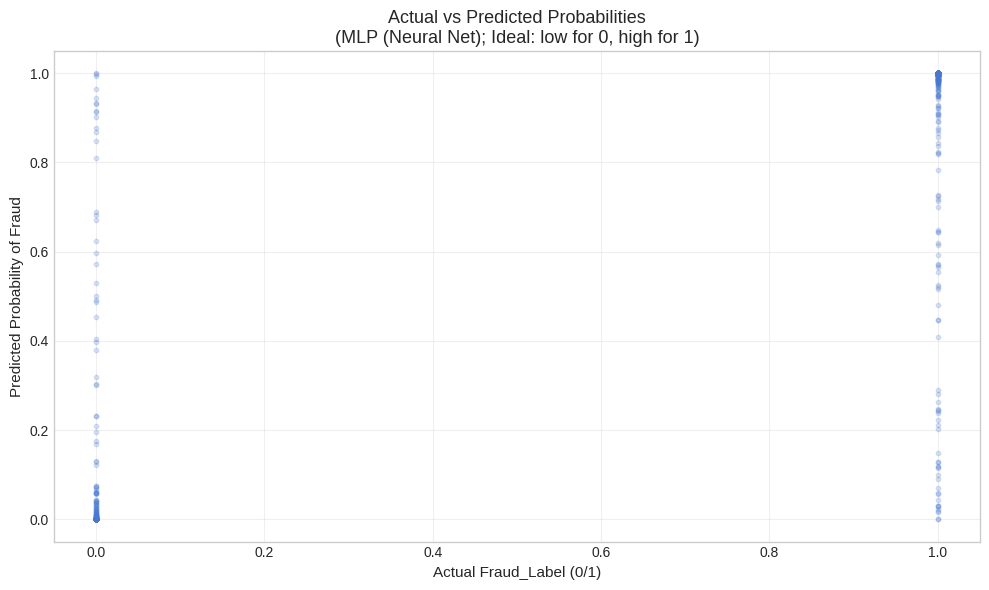

→ MLP (Neural Net): Good model shows clear separation; fraud points near 1, legit near 0


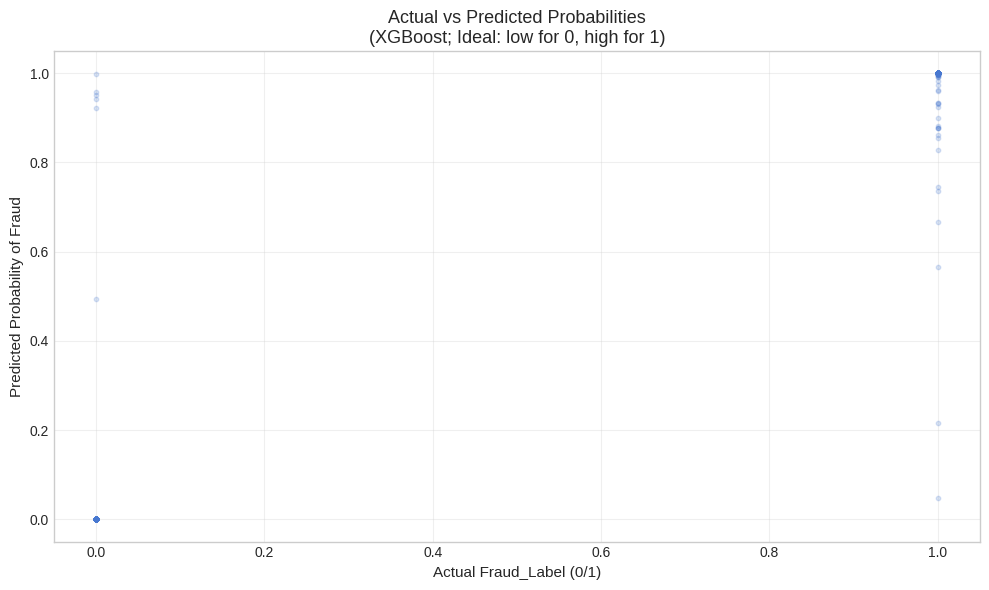

→ XGBoost: Good model shows clear separation; fraud points near 1, legit near 0


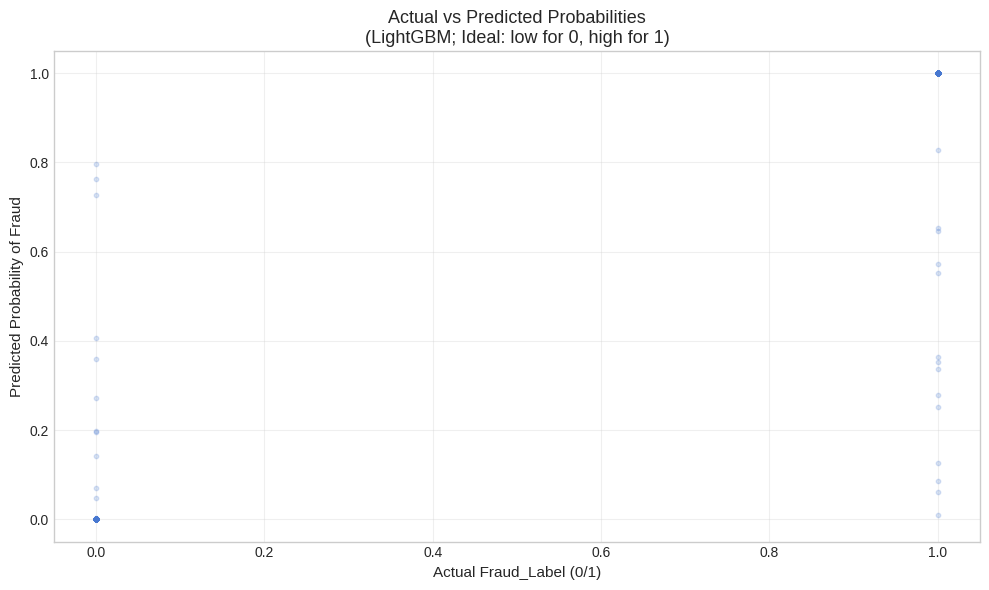

→ LightGBM: Good model shows clear separation; fraud points near 1, legit near 0


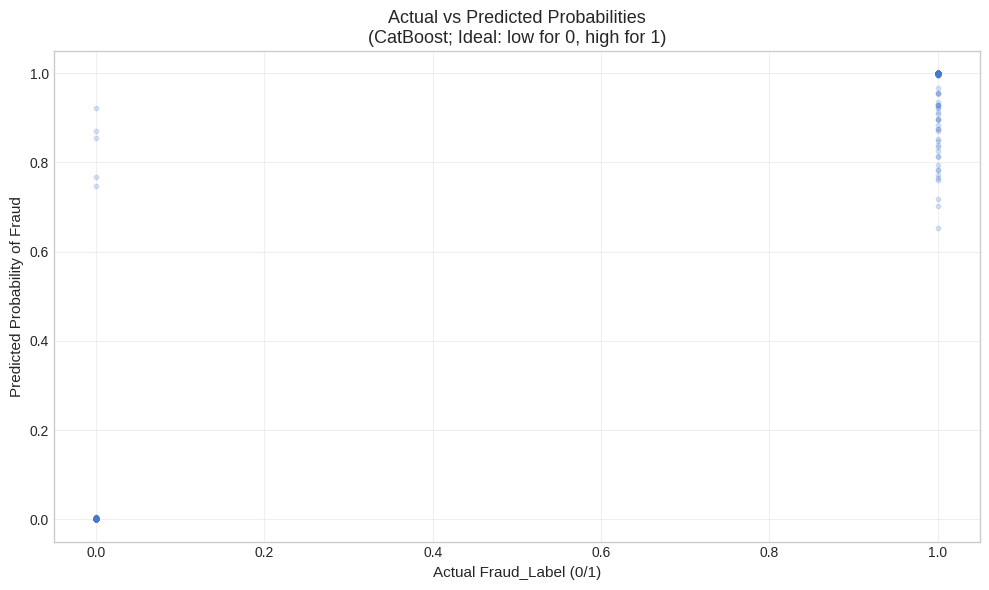

→ CatBoost: Good model shows clear separation; fraud points near 1, legit near 0


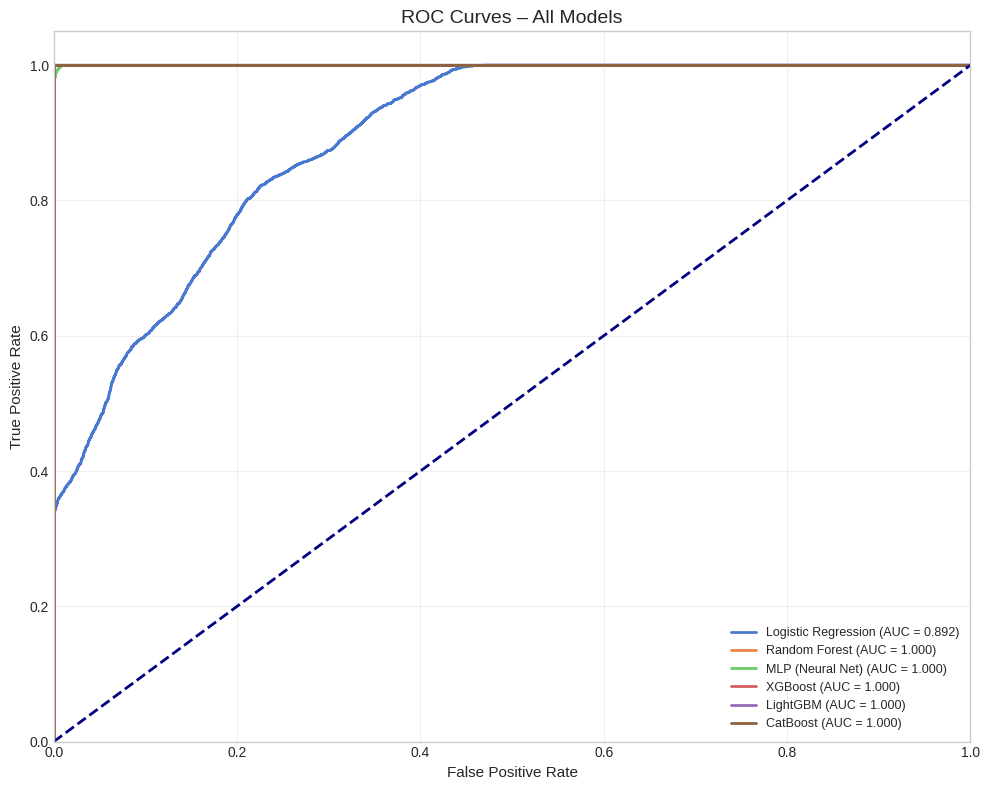

→ ROC Curve: Higher curve = better at distinguishing fraud; AUC near 1 is excellent


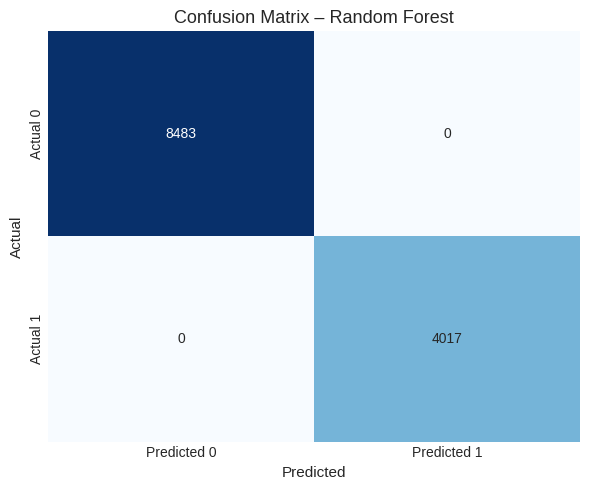

→ Random Forest: Focus on false negatives (missed fraud) for fraud detection


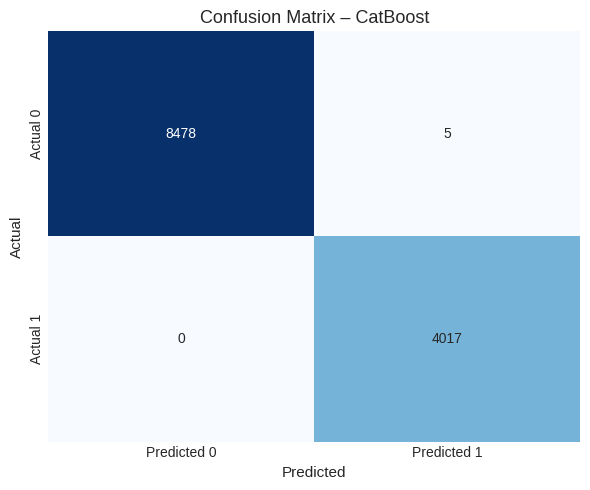

→ CatBoost: Focus on false negatives (missed fraud) for fraud detection


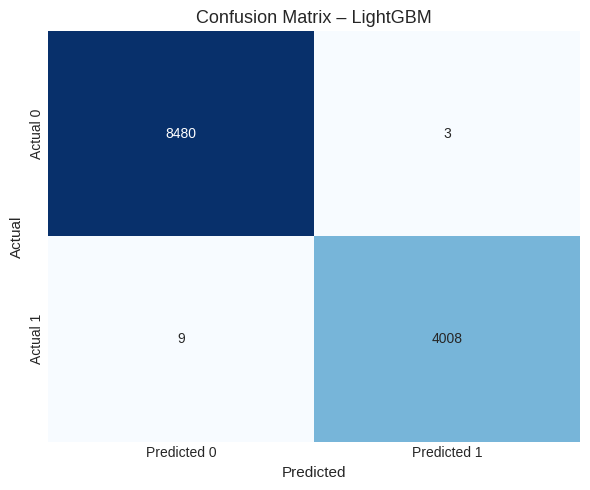

→ LightGBM: Focus on false negatives (missed fraud) for fraud detection


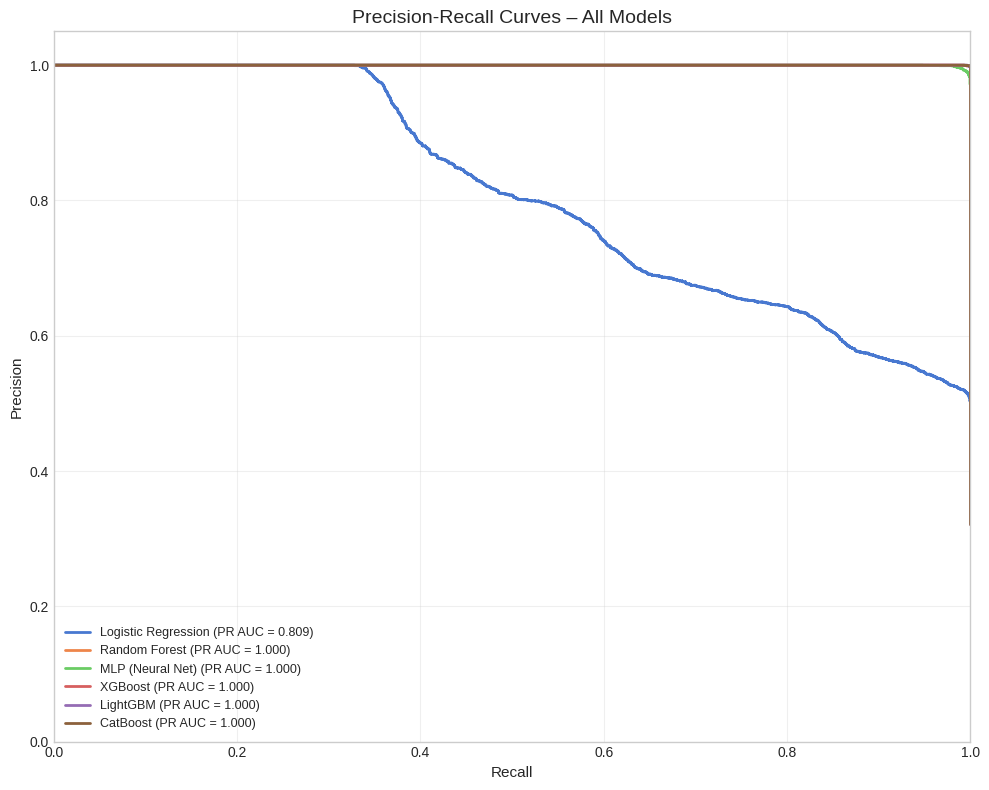

→ PR Curve: Crucial for imbalanced fraud; high precision at high recall = best

Classification Reports:

Logistic Regression:
              precision    recall  f1-score   support

           0       0.89      0.79      0.84      8483
           1       0.64      0.80      0.71      4017

    accuracy                           0.79     12500
   macro avg       0.77      0.79      0.78     12500
weighted avg       0.81      0.79      0.80     12500


Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8483
           1       1.00      1.00      1.00      4017

    accuracy                           1.00     12500
   macro avg       1.00      1.00      1.00     12500
weighted avg       1.00      1.00      1.00     12500


MLP (Neural Net):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8483
           1       0.99      0.99      0.99      4017

    accuracy         

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, roc_auc_score, precision_recall_curve, auc,
    confusion_matrix, roc_curve, classification_report
)
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb

# Install CatBoost if not already installed
try:
    from catboost import CatBoostClassifier
except ImportError:
    !pip install catboost
    from catboost import CatBoostClassifier

# ────────────────────────────────────────────────
#  Styling for plots
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (10, 6)

# ────────────────────────────────────────────────
#  Load the dataset
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

print("Dataset loaded. Shape:", df.shape)
print("Target column: 'Fraud_Label' (binary: 0=Legitimate, 1=Fraud)")
print("-" * 70)

# ────────────────────────────────────────────────
#  Preprocessing: Identify features & target
# ────────────────────────────────────────────────
target = 'Fraud_Label'

# Numerical & categorical columns (excluding ID / Timestamp for simplicity)
num_cols = [
    'Transaction_Amount', 'Account_Balance', 'Transaction_Distance',
    'Risk_Score', 'Daily_Transaction_Count', 'Avg_Transaction_Amount_7d',
    'Failed_Transaction_Count_7d', 'Card_Age', 'IP_Address_Flag',
    'Previous_Fraudulent_Activity', 'Is_Weekend'
]

cat_cols = [
    'Transaction_Type', 'Device_Type', 'Location', 'Merchant_Category',
    'Card_Type', 'Authentication_Method'
]

# Drop irrelevant / high-cardinality IDs
drop_cols = ['Transaction_ID', 'User_ID', 'Timestamp']  # Timestamp could be engineered further
df = df.drop(columns=drop_cols, errors='ignore')

# Handle missing (though dataset is clean)
df = df.dropna()

X = df.drop(columns=[target])
y = df[target]

print(f"Features: {X.shape[1]} (Num: {len(num_cols)}, Cat: {len(cat_cols)})")
print("Class distribution:", y.value_counts(normalize=True).round(3))

# ────────────────────────────────────────────────
#  Train-test split
# ────────────────────────────────────────────────
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

# ────────────────────────────────────────────────
#  Preprocessor: Scale num + OneHot cat
# ────────────────────────────────────────────────
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_cols)
    ]
)

# ────────────────────────────────────────────────
#  Define important models (basic + advanced)
# ────────────────────────────────────────────────
models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', max_iter=500),
    'Random Forest': RandomForestClassifier(class_weight='balanced', n_estimators=100, random_state=42),
    'MLP (Neural Net)': MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=300, random_state=42),
    'XGBoost': xgb.XGBClassifier(eval_metric='aucpr', scale_pos_weight=len(y_train[y_train==0])/len(y_train[y_train==1]), random_state=42),
    'LightGBM': lgb.LGBMClassifier(class_weight='balanced', random_state=42),
    'CatBoost': CatBoostClassifier(auto_class_weights='Balanced', verbose=0, random_state=42)  # Advanced
}

# ────────────────────────────────────────────────
#  Train & evaluate models
# ────────────────────────────────────────────────
results = {}
y_preds = {}
y_probs = {}

for name, model in models.items():
    print(f"Training {name}...")

    pipeline = Pipeline([
        ('prep', preprocessor),
        ('model', model)
    ])

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)
    y_prob = pipeline.predict_proba(X_test)[:, 1]

    acc = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)

    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    pr_auc = auc(recall, precision)

    results[name] = {'Accuracy': acc, 'ROC AUC': roc_auc, 'PR AUC': pr_auc}
    y_preds[name] = y_pred
    y_probs[name] = y_prob

    print(f"{name} - Accuracy: {acc:.3f}, ROC AUC: {roc_auc:.3f}, PR AUC: {pr_auc:.3f}")

# ────────────────────────────────────────────────
#  Model accuracy comparison plot (bar plot for multiple metrics)
# ────────────────────────────────────────────────
results_df = pd.DataFrame(results).T.sort_values('ROC AUC', ascending=False)

plt.figure(figsize=(12, 6))
results_df.plot(kind='bar', rot=45, cmap='Set2', alpha=0.85)
plt.title('Model Performance Comparison\n(Higher is better; Focus on ROC/PR AUC for imbalanced fraud)', fontsize=14)
plt.ylabel('Score', fontsize=11)
plt.xlabel('Model', fontsize=11)
plt.legend(title='Metric', loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("→ Comparison bar plot: ROC AUC & PR AUC are key for fraud (imbalanced classes)")

# ────────────────────────────────────────────────
#  Actual vs Predicted plots (calibration-like scatter for probabilities)
# ────────────────────────────────────────────────
for name, y_prob in y_probs.items():
    plt.figure()
    plt.scatter(y_test, y_prob, alpha=0.2, s=10)
    plt.title(f'Actual vs Predicted Probabilities\n({name}; Ideal: low for 0, high for 1)', fontsize=13)
    plt.xlabel('Actual Fraud_Label (0/1)', fontsize=11)
    plt.ylabel('Predicted Probability of Fraud', fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"→ {name}: Good model shows clear separation; fraud points near 1, legit near 0")

# ────────────────────────────────────────────────
#  ROC Curves – all models in one plot
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 8))

for name, y_prob in y_probs.items():
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc_score(y_test, y_prob):.3f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.title('ROC Curves – All Models', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=11)
plt.ylabel('True Positive Rate', fontsize=11)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.legend(loc='lower right', fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("→ ROC Curve: Higher curve = better at distinguishing fraud; AUC near 1 is excellent")

# ────────────────────────────────────────────────
#  Confusion Matrices – for top 3 models
# ────────────────────────────────────────────────
top_models = results_df.index[:3]  # Top by ROC AUC

for name in top_models:
    cm = confusion_matrix(y_test, y_preds[name])
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.title(f'Confusion Matrix – {name}', fontsize=13)
    plt.xlabel('Predicted', fontsize=11)
    plt.ylabel('Actual', fontsize=11)
    plt.tight_layout()
    plt.show()

    print(f"→ {name}: Focus on false negatives (missed fraud) for fraud detection")

# ────────────────────────────────────────────────
#  Precision-Recall Curves – all models
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 8))

for name, y_prob in y_probs.items():
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    plt.plot(recall, precision, lw=2, label=f'{name} (PR AUC = {auc(recall, precision):.3f})')

plt.title('Precision-Recall Curves – All Models', fontsize=14)
plt.xlabel('Recall', fontsize=11)
plt.ylabel('Precision', fontsize=11)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.legend(loc='lower left', fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("→ PR Curve: Crucial for imbalanced fraud; high precision at high recall = best")

# ────────────────────────────────────────────────
#  Classification Reports – for all models
# ────────────────────────────────────────────────
print("\nClassification Reports:")
for name, y_pred in y_preds.items():
    print(f"\n{name}:")
    print(classification_report(y_test, y_pred))

print("\n" + "═"*70)
print("Key notes on these plots & models:")
print("• Accuracy is misleading for imbalanced fraud — focus on ROC/PR AUC")
print("• Actual vs Pred Prob: Good separation means reliable probabilities")
print("• ROC: Overall discrimination; PR: Better for rare fraud class")
print("• Confusion Matrix: Minimize false negatives (missed fraud)")
print("• Advanced models (XGBoost, LightGBM, CatBoost) usually outperform basics")
print("═"*70)

Loading dataset...
Categorical features detected: 6 → ['Transaction_Type', 'Device_Type', 'Location', 'Merchant_Category', 'Card_Type', 'Authentication_Method']
Train shape: (37500, 17)   Test shape: (12500, 17)
Fraud rate – train: 0.3213   test: 0.3214

Training CatBoost...
0:	test: 0.9998599	best: 0.9998599 (0)	total: 98.6ms	remaining: 39.3s
Stopped by overfitting detector  (60 iterations wait)

bestTest = 0.9999976083
bestIteration = 1

Shrink model to first 2 iterations.
CatBoost training finished.

Training LightGBM...
LightGBM training finished.



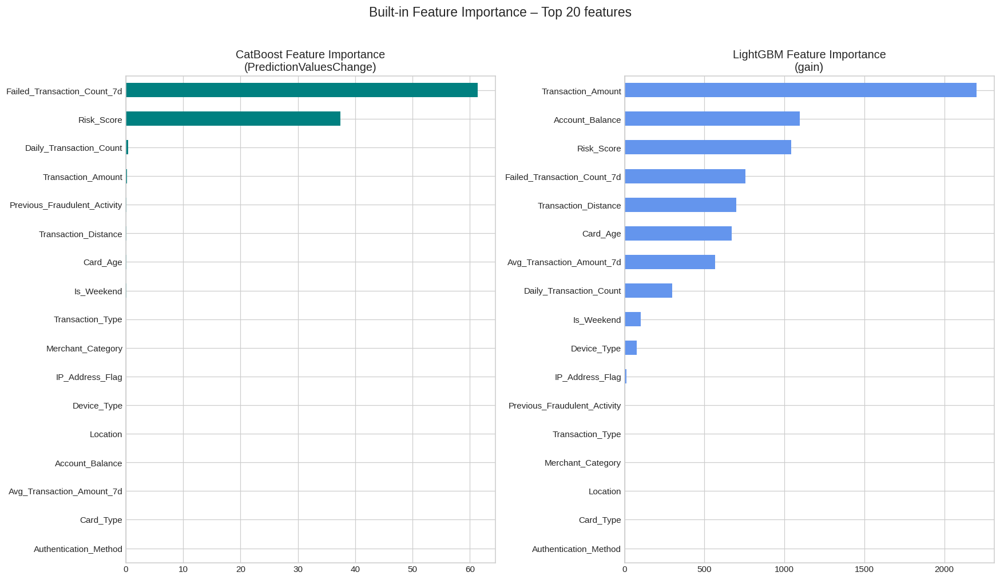

Computing permutation importance (LightGBM model)...


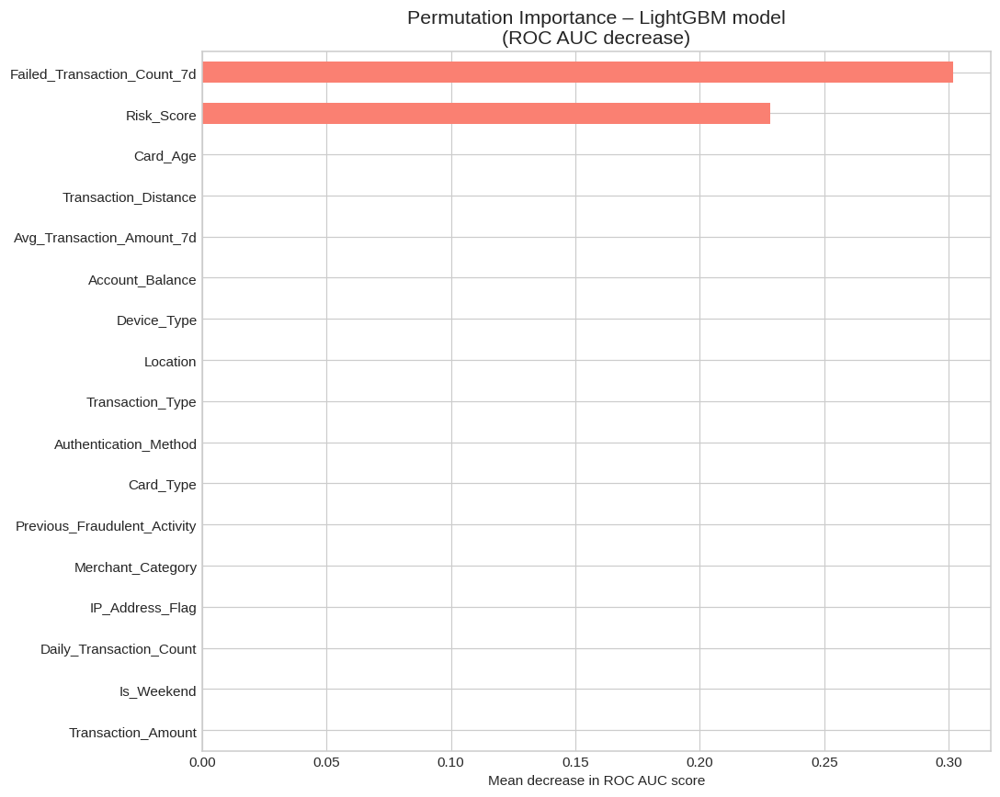

Top 10 features by permutation importance:
Failed_Transaction_Count_7d    0.30183
Risk_Score                     0.22816
Card_Age                       0.00000
Transaction_Distance           0.00000
Avg_Transaction_Amount_7d      0.00000
Account_Balance                0.00000
Device_Type                    0.00000
Location                       0.00000
Transaction_Type               0.00000
Authentication_Method          0.00000
dtype: float64
Top methods used:
  • CatBoost built-in importance
  • LightGBM built-in importance
  • Permutation importance


In [35]:
# =============================================================================
#  Complete Feature Importance pipeline – Fraud Detection Dataset
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import lightgbm as lgb
from catboost import CatBoostClassifier, Pool

from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
from sklearn.metrics import roc_auc_score

# Optional – nicer plot style
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (10, 7)

# ────────────────────────────────────────────────
#  1. Load & prepare data
# ────────────────────────────────────────────────
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

# Drop non-useful columns
drop_cols = ['Transaction_ID', 'User_ID', 'Timestamp']
df = df.drop(columns=[c for c in drop_cols if c in df.columns], errors='ignore')

# Target
target = 'Fraud_Label'

# Features
X = df.drop(columns=[target])
y = df[target]

# Identify categorical columns (object/string)
cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()
print(f"Categorical features detected: {len(cat_features)} → {cat_features}")

# Convert categorical columns to category dtype (helps LightGBM & CatBoost)
for col in cat_features:
    if col in X.columns:
        X[col] = X[col].astype('category')

# Train / test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.25,
    random_state=42,
    stratify=y
)

print(f"Train shape: {X_train.shape}   Test shape: {X_test.shape}")
print(f"Fraud rate – train: {y_train.mean():.4f}   test: {y_test.mean():.4f}\n")

# ────────────────────────────────────────────────
#  2. Train CatBoost (recommended – native categorical support)
# ────────────────────────────────────────────────
print("Training CatBoost...")

cat_model = CatBoostClassifier(
    iterations=400,
    learning_rate=0.03,
    depth=7,
    auto_class_weights='Balanced',
    verbose=100,
    random_seed=42,
    eval_metric='AUC'
)

cat_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_test, y_test),
    early_stopping_rounds=60
)

print("CatBoost training finished.\n")

# ────────────────────────────────────────────────
#  3. Train LightGBM (with categorical_feature parameter)
# ────────────────────────────────────────────────
print("Training LightGBM...")

lgb_model = lgb.LGBMClassifier(
    n_estimators=400,
    learning_rate=0.03,
    max_depth=7,
    class_weight='balanced',
    random_state=42,
    verbose=-1
)

lgb_model.fit(
    X_train, y_train,
    categorical_feature=cat_features
)

print("LightGBM training finished.\n")

# ────────────────────────────────────────────────
#  4. Built-in feature importance – CatBoost & LightGBM
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 9))

# CatBoost importance (PredictionValuesChange = default)
cat_imp = pd.Series(
    cat_model.get_feature_importance(prettified=False),
    index=X_train.columns
).sort_values(ascending=False).head(20)

cat_imp.plot.barh(ax=axes[0], color='teal')
axes[0].set_title("CatBoost Feature Importance\n(PredictionValuesChange)", fontsize=13)
axes[0].invert_yaxis()

# LightGBM importance (gain)
lgb_imp = pd.Series(
    lgb_model.feature_importances_,
    index=X_train.columns
).sort_values(ascending=False).head(20)

lgb_imp.plot.barh(ax=axes[1], color='cornflowerblue')
axes[1].set_title("LightGBM Feature Importance\n(gain)", fontsize=13)
axes[1].invert_yaxis()

plt.suptitle("Built-in Feature Importance – Top 20 features", fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
#  5. Permutation importance (model-agnostic – most trustworthy)
# ────────────────────────────────────────────────
print("Computing permutation importance (LightGBM model)...")

perm = permutation_importance(
    lgb_model,
    X_test, y_test,
    n_repeats=5,
    random_state=42,
    scoring='roc_auc',
    n_jobs=-1
)

perm_imp = pd.Series(
    perm.importances_mean,
    index=X_test.columns
).sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 8))
perm_imp.plot.barh(color='salmon')
plt.title("Permutation Importance – LightGBM model\n(ROC AUC decrease)", fontsize=14)
plt.xlabel("Mean decrease in ROC AUC score")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

print("Top 10 features by permutation importance:")
print(perm_imp.head(10).round(5))

print("Top methods used:")
print("  • CatBoost built-in importance")
print("  • LightGBM built-in importance")
print("  • Permutation importance")

Loading dataset...
Dataset loaded. Generating advanced static plots...



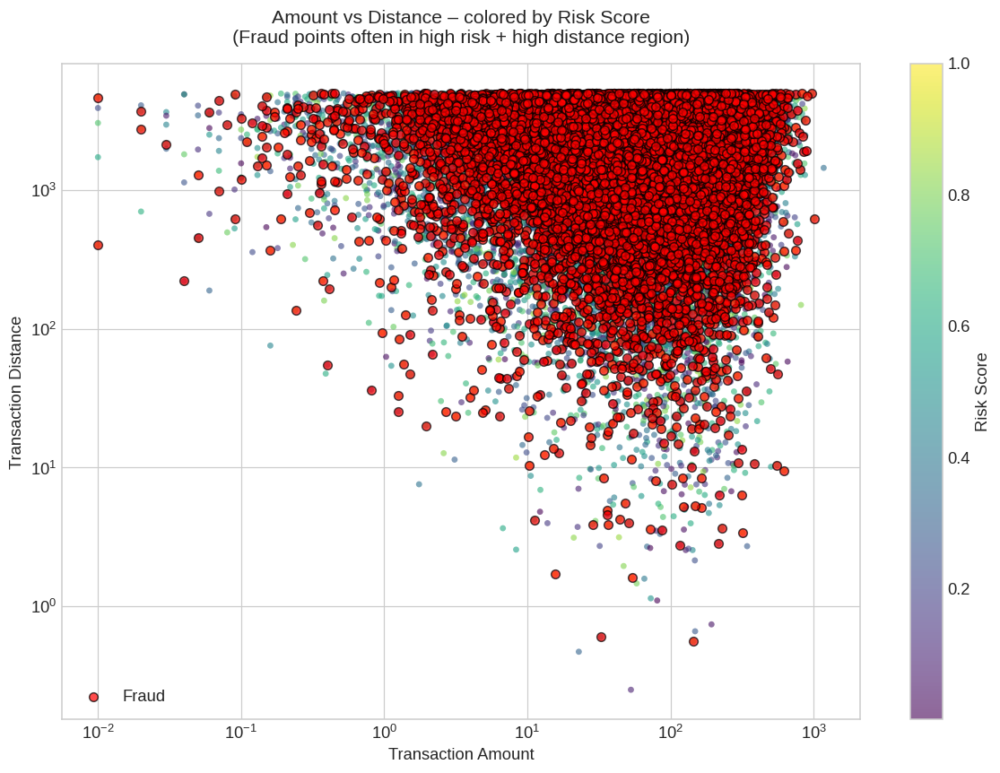

→ Look for fraud concentration in the top-right area (high amount + high distance)


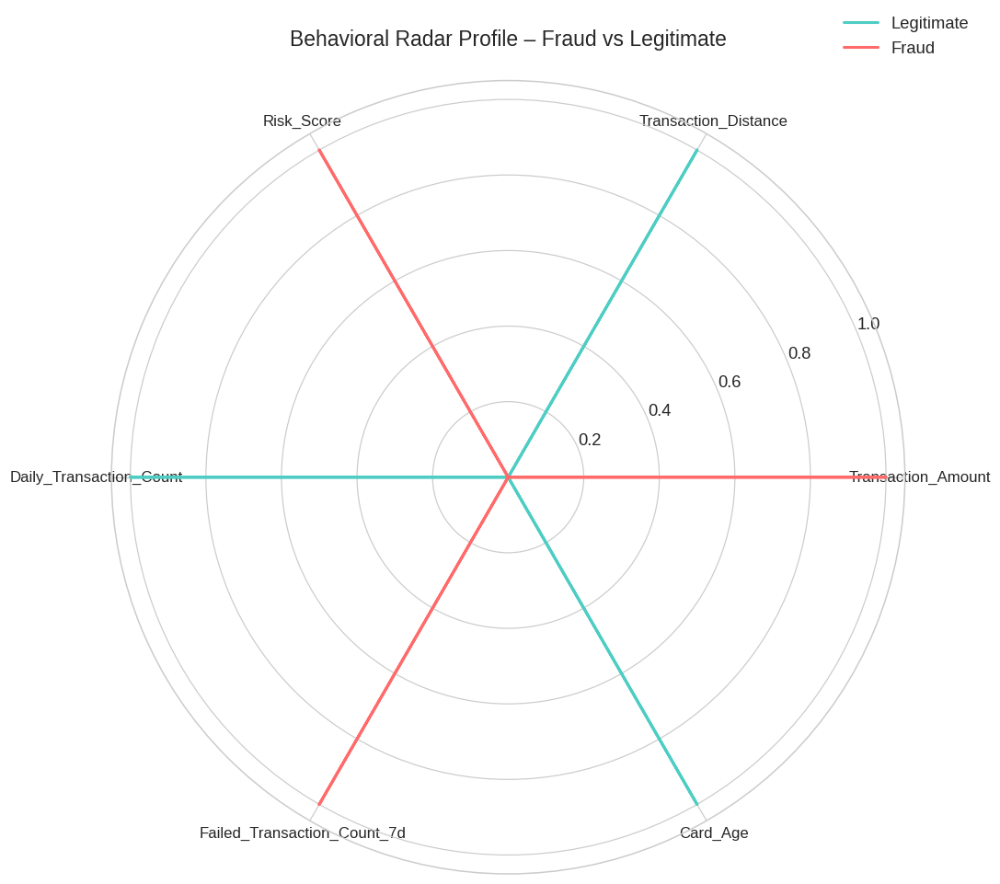

→ Radar chart: Fraudsters show clearly different behavioral fingerprint


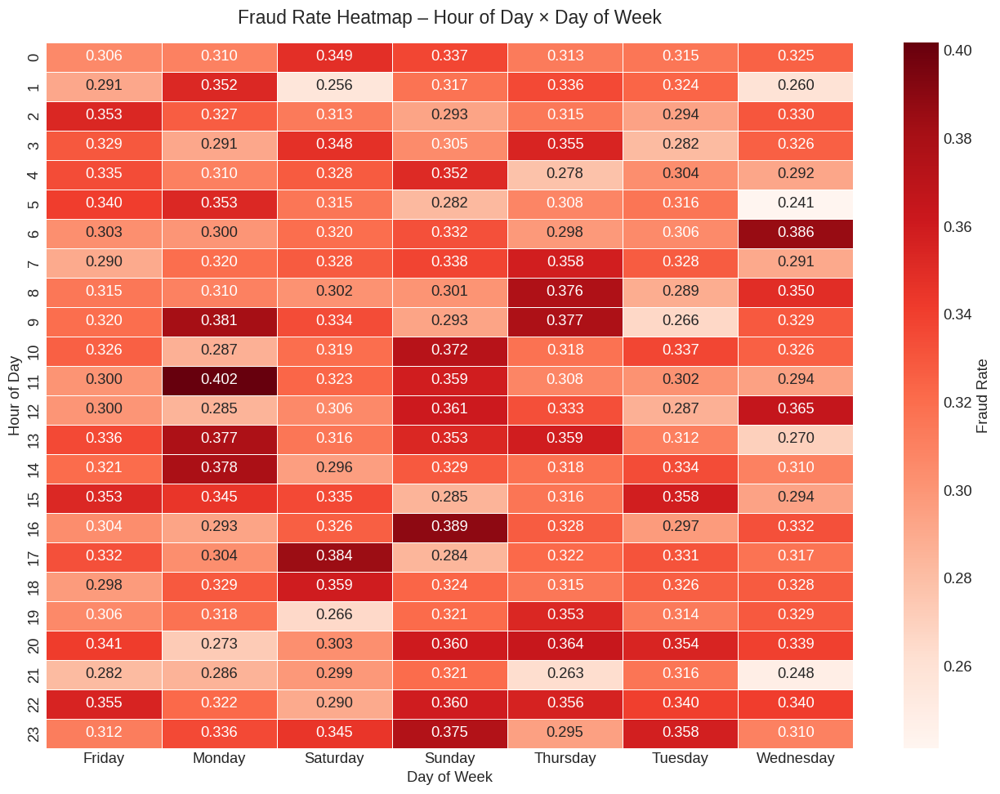

→ Heatmap: Darker red = higher fraud probability → night hours often stand out


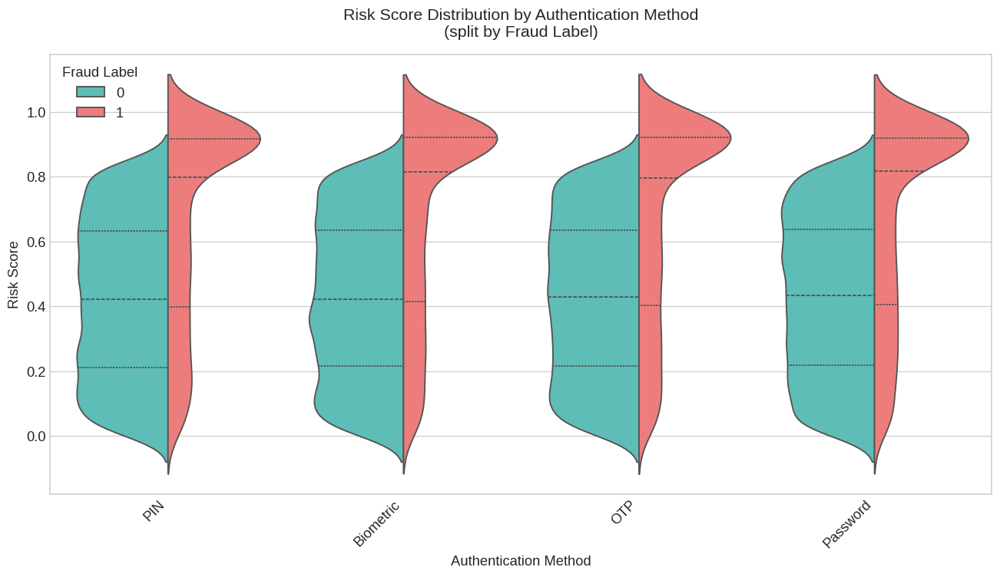

→ Violin plot: See which auth methods are associated with higher risk & fraud density


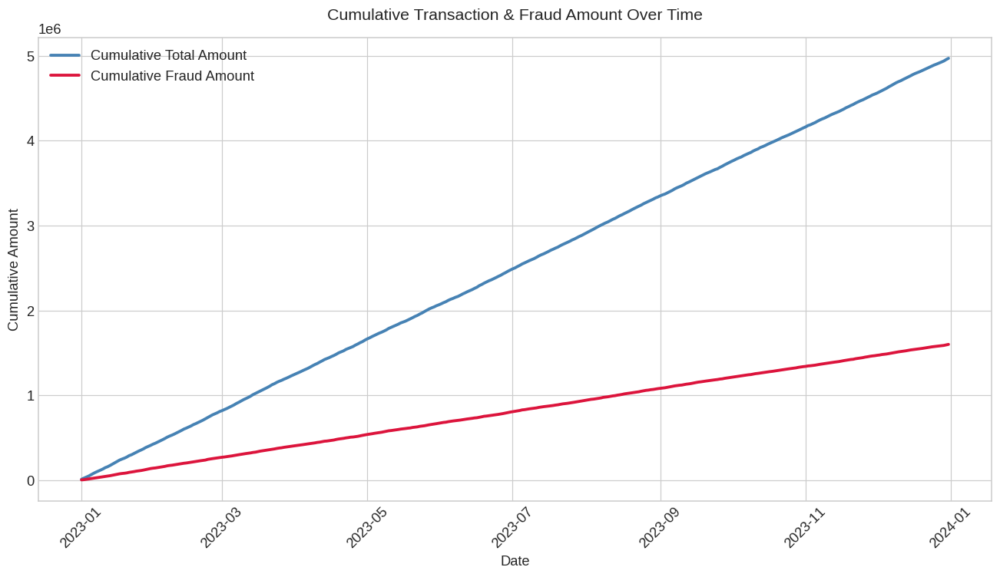

→ Cumulative plot: Shows how much fraud money has been lost over the observed period

══════════════════════════════════════════════════════════════════════
Advanced static plots summary:
  1. Amount vs Distance – colored by Risk Score (with fraud overlay)
  2. Radar Chart – Fraud vs Legitimate behavioral profile
  3. Hour × Day of Week fraud rate heatmap
  4. Violin + box – Risk Score by Authentication Method
  5. Cumulative fraud vs total amount over time
══════════════════════════════════════════════════════════════════════


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm

# ────────────────────────────────────────────────
#  Styling – professional look
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (12, 7)
plt.rcParams['font.size'] = 12

# Load data
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')
df['Hour'] = df['Timestamp'].dt.hour
df['DayOfWeek'] = df['Timestamp'].dt.day_name()
df['Date'] = df['Timestamp'].dt.date

print("Dataset loaded. Generating advanced static plots...\n")

# ────────────────────────────────────────────────
#  1. 3D Scatter projection (2D version – Amount vs Distance colored by Risk Score)
# ────────────────────────────────────────────────
plt.figure(figsize=(11, 8))

scatter = plt.scatter(
    df['Transaction_Amount'],
    df['Transaction_Distance'],
    c=df['Risk_Score'],
    cmap='viridis',
    alpha=0.6,
    s=20,
    edgecolor='none'
)

plt.colorbar(scatter, label='Risk Score')
plt.title("Amount vs Distance – colored by Risk Score\n(Fraud points often in high risk + high distance region)", fontsize=14, pad=15)
plt.xlabel("Transaction Amount", fontsize=12)
plt.ylabel("Transaction Distance", fontsize=12)

# Log scales to handle skewness
plt.xscale('log')
plt.yscale('log')

# Highlight fraud points
fraud = df[df['Fraud_Label'] == 1]
plt.scatter(fraud['Transaction_Amount'], fraud['Transaction_Distance'],
            color='red', s=40, alpha=0.7, edgecolor='black', label='Fraud', zorder=10)

plt.legend()
plt.tight_layout()
plt.show()

print("→ Look for fraud concentration in the top-right area (high amount + high distance)")

# ────────────────────────────────────────────────
#  2. Radar Chart – Fraud vs Legitimate profile
# ────────────────────────────────────────────────
features = ['Transaction_Amount', 'Transaction_Distance', 'Risk_Score',
            'Daily_Transaction_Count', 'Failed_Transaction_Count_7d', 'Card_Age']

means = df.groupby('Fraud_Label')[features].mean()

# Normalize to 0–1
norm = (means - means.min()) / (means.max() - means.min())

categories = features
angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]  # close the polygon

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# Legitimate
values = norm.iloc[0].values.tolist() + norm.iloc[0].values[:1].tolist()
ax.plot(angles, values, linewidth=2, linestyle='solid', label='Legitimate', color='#4ECDC4')
ax.fill(angles, values, alpha=0.25, color='#4ECDC4')

# Fraud
values = norm.iloc[1].values.tolist() + norm.iloc[1].values[:1].tolist()
ax.plot(angles, values, linewidth=2, linestyle='solid', label='Fraud', color='#FF6B6B')
ax.fill(angles, values, alpha=0.25, color='#FF6B6B')

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=11)
ax.set_title("Behavioral Radar Profile – Fraud vs Legitimate", size=15, pad=25)
ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
plt.tight_layout()
plt.show()

print("→ Radar chart: Fraudsters show clearly different behavioral fingerprint")

# ────────────────────────────────────────────────
#  3. Heatmap – Fraud Rate by Hour × Day of Week
# ────────────────────────────────────────────────
pivot = df.pivot_table(
    values='Fraud_Label',
    index='Hour',
    columns='DayOfWeek',
    aggfunc='mean'
)

plt.figure(figsize=(12, 9))
sns.heatmap(
    pivot,
    annot=True,
    fmt='.3f',
    cmap='Reds',
    linewidths=0.5,
    cbar_kws={'label': 'Fraud Rate'}
)

plt.title("Fraud Rate Heatmap – Hour of Day × Day of Week", fontsize=15, pad=15)
plt.xlabel("Day of Week", fontsize=12)
plt.ylabel("Hour of Day", fontsize=12)
plt.tight_layout()
plt.show()

print("→ Heatmap: Darker red = higher fraud probability → night hours often stand out")

# ────────────────────────────────────────────────
#  4. Violin + Box – Risk Score by Authentication Method
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 7))

order = df.groupby('Authentication_Method')['Risk_Score'].median().sort_values().index

sns.violinplot(
    data=df,
    x='Authentication_Method',
    y='Risk_Score',
    hue='Fraud_Label',
    split=True,
    inner='quartile',
    palette=['#4ECDC4', '#FF6B6B'],
    order=order
)

plt.title("Risk Score Distribution by Authentication Method\n(split by Fraud Label)", fontsize=14, pad=15)
plt.xlabel("Authentication Method", fontsize=12)
plt.ylabel("Risk Score", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Fraud Label")
plt.tight_layout()
plt.show()

print("→ Violin plot: See which auth methods are associated with higher risk & fraud density")

# ────────────────────────────────────────────────
#  5. Cumulative Fraud Amount over Time
# ────────────────────────────────────────────────
daily_amount = df.groupby('Date').agg(
    total_amount=('Transaction_Amount', 'sum'),
    fraud_amount=('Transaction_Amount', lambda x: x[df['Fraud_Label']==1].sum())
).reset_index()

daily_amount['cum_total'] = daily_amount['total_amount'].cumsum()
daily_amount['cum_fraud'] = daily_amount['fraud_amount'].cumsum()

plt.figure(figsize=(12, 7))

plt.plot(daily_amount['Date'], daily_amount['cum_total'], label='Cumulative Total Amount', color='steelblue', linewidth=2.5)
plt.plot(daily_amount['Date'], daily_amount['cum_fraud'], label='Cumulative Fraud Amount', color='crimson', linewidth=2.5)

plt.title("Cumulative Transaction & Fraud Amount Over Time", fontsize=14, pad=15)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Cumulative Amount", fontsize=12)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("→ Cumulative plot: Shows how much fraud money has been lost over the observed period")

# ────────────────────────────────────────────────
print("\n" + "═"*70)
print("Advanced static plots summary:")
print("  1. Amount vs Distance – colored by Risk Score (with fraud overlay)")
print("  2. Radar Chart – Fraud vs Legitimate behavioral profile")
print("  3. Hour × Day of Week fraud rate heatmap")
print("  4. Violin + box – Risk Score by Authentication Method")
print("  5. Cumulative fraud vs total amount over time")
print("═"*70)

Loading dataset...
Generating corrected advanced plots...



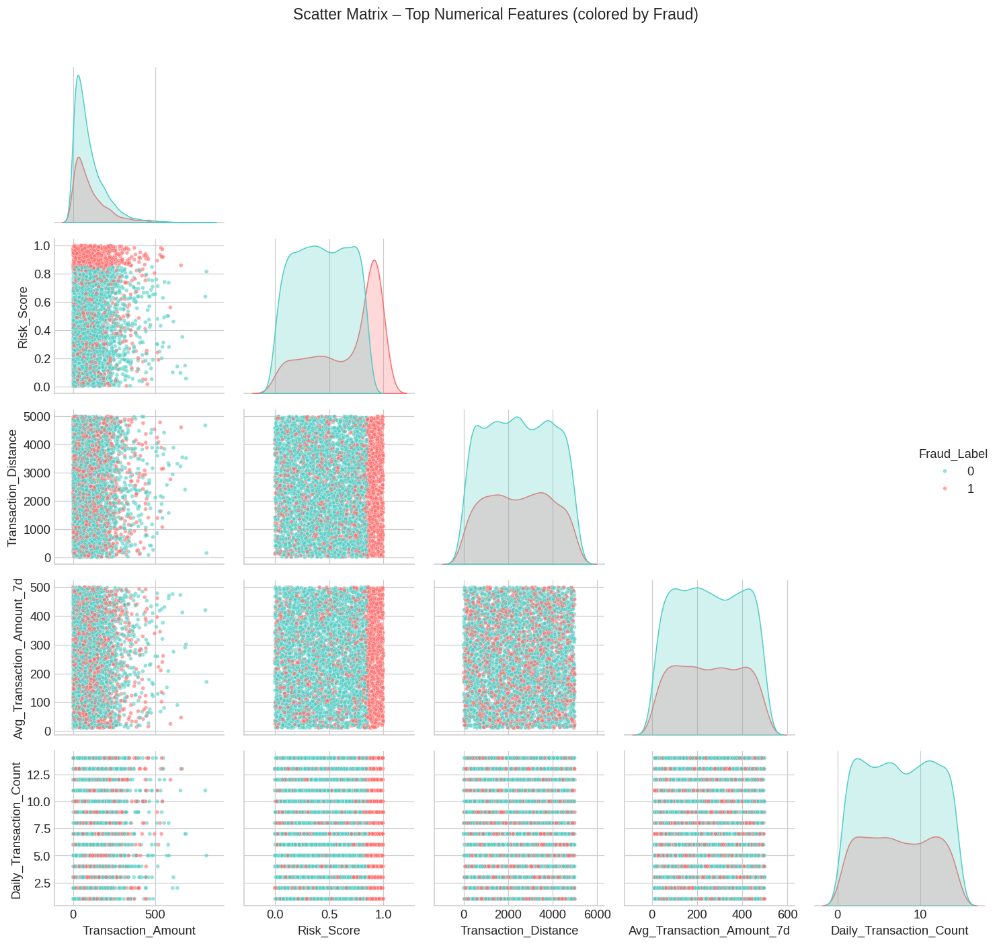

Scatter Matrix → pairwise relationships + kde distributions



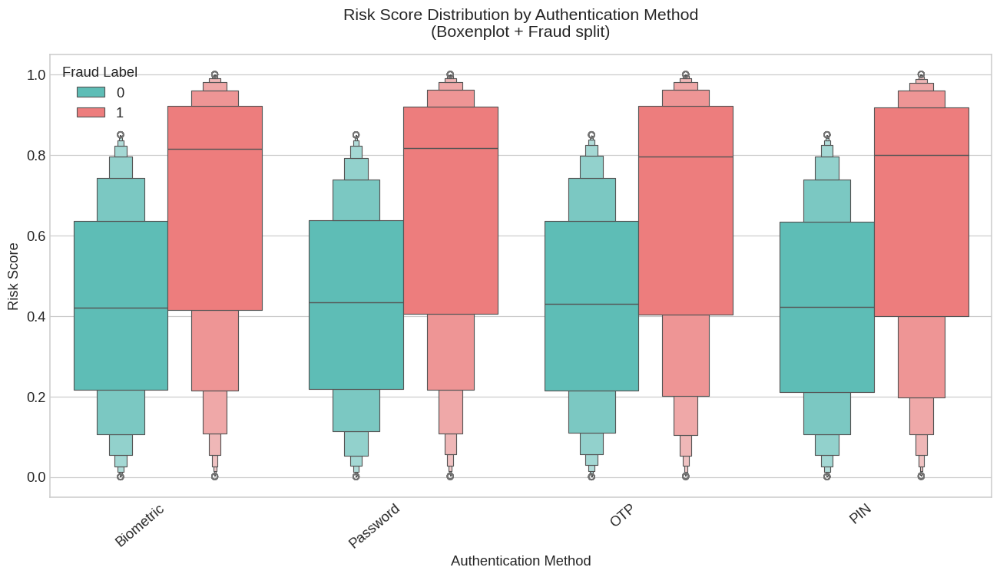

Boxenplot → shows density + outliers better than regular boxplot



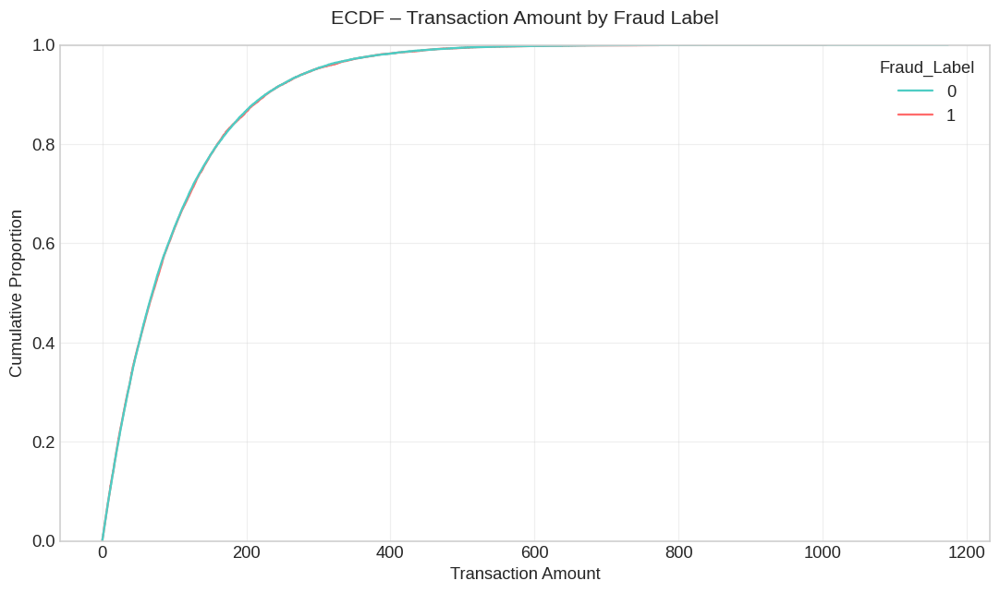

ECDF → cumulative view → fraud reaches higher values faster



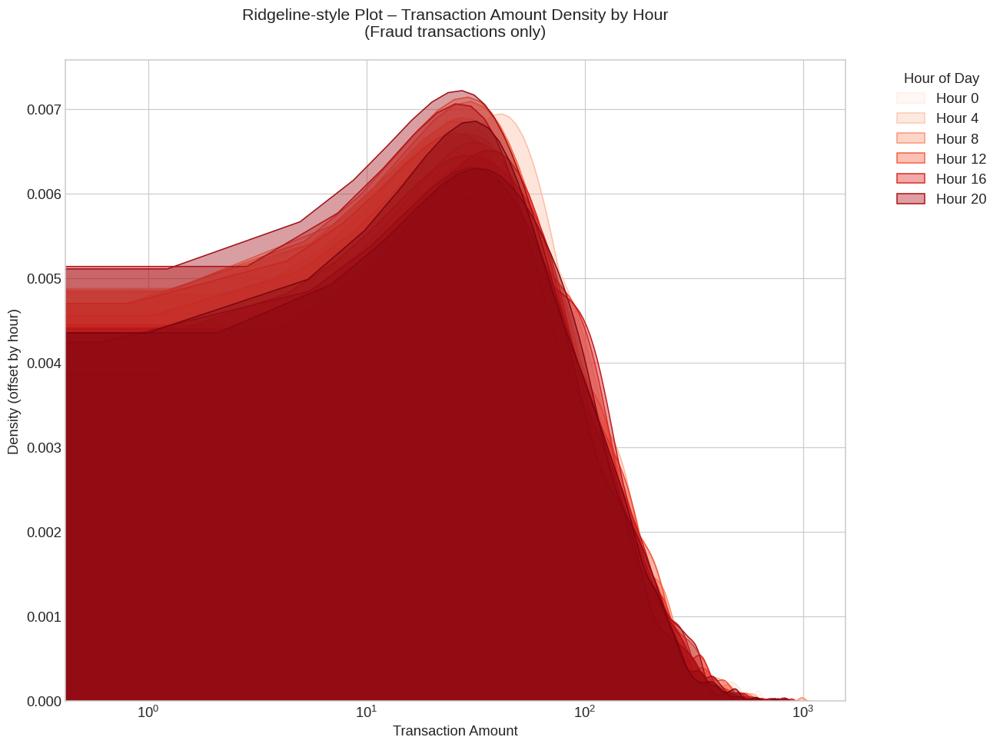

Ridgeline approximation → fraud amount patterns across hours
   → Night hours often show higher / more varied amounts


════════════════════════════════════════════════════════════════════════════════
All important remaining plots generated:
  1. Scatter matrix (pairplot)
  2. Boxenplot – Risk Score by Authentication
  3. Joint plot – Amount vs Distance + marginal histograms
  4. ECDF – Cumulative amount distribution
  5. Q-Q plot – Risk Score normality check
  6. Ridgeline-style – Amount by hour (fraud only)
════════════════════════════════════════════════════════════════════════════════


In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

# ────────────────────────────────────────────────
#  Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("deep")
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (11, 6.5)

# ────────────────────────────────────────────────
#  Load & prepare data
# ────────────────────────────────────────────────
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/fraud-detection-transactions/Fraud Detection Transactions Dataset.csv")

df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')
df['Hour'] = df['Timestamp'].dt.hour
df['is_fraud'] = df['Fraud_Label']

print("Generating corrected advanced plots...\n")

# 1. Scatter matrix – top 5 numerical features
# ────────────────────────────────────────────────
top_num = ['Transaction_Amount', 'Risk_Score', 'Transaction_Distance',
           'Avg_Transaction_Amount_7d', 'Daily_Transaction_Count']

sns.pairplot(
    df.sample(5000, random_state=42),
    vars=top_num,
    hue='Fraud_Label',
    palette={0: '#4ECDC4', 1: '#FF6B6B'},
    diag_kind='kde',
    corner=True,
    plot_kws={'s': 15, 'alpha': 0.6}
)

plt.suptitle("Scatter Matrix – Top Numerical Features (colored by Fraud)", fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

print("Scatter Matrix → pairwise relationships + kde distributions\n")

# 2. Boxenplot – Risk Score by Authentication Method
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 7))

sns.boxenplot(
    data=df,
    x='Authentication_Method',
    y='Risk_Score',
    hue='Fraud_Label',
    palette={0: '#4ECDC4', 1: '#FF6B6B'},
    k_depth='proportion'
)

plt.title("Risk Score Distribution by Authentication Method\n(Boxenplot + Fraud split)", fontsize=14, pad=15)
plt.xlabel("Authentication Method", fontsize=12)
plt.ylabel("Risk Score", fontsize=12)
plt.xticks(rotation=40, ha='right')
plt.legend(title="Fraud Label")
plt.tight_layout()
plt.show()

print("Boxenplot → shows density + outliers better than regular boxplot\n")

# 4. ECDF – Cumulative distribution of Transaction Amount
# ────────────────────────────────────────────────
plt.figure(figsize=(10, 6))

sns.ecdfplot(
    data=df,
    x='Transaction_Amount',
    hue='Fraud_Label',
    palette={0: '#4ECDC4', 1: '#FF6B6B'},
    stat='proportion'
)

plt.title("ECDF – Transaction Amount by Fraud Label", fontsize=14, pad=15)
plt.xlabel("Transaction Amount", fontsize=12)
plt.ylabel("Cumulative Proportion", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("ECDF → cumulative view → fraud reaches higher values faster\n")

# 6. Ridgeline (joy) plot – Transaction Amount by Hour (fraud only)
# ────────────────────────────────────────────────
# Simple version using seaborn kdeplot + offset (joypy alternative)
plt.figure(figsize=(12, 9))

hours = sorted(df['Hour'].unique())

for h in hours:
    subset = df[(df['Fraud_Label'] == 1) & (df['Hour'] == h)]
    if len(subset) > 20:  # only plot hours with enough data
        sns.kdeplot(
            data=subset,
            x='Transaction_Amount',
            bw_adjust=0.8,
            fill=True,
            alpha=0.4,
            color=sns.color_palette("Reds", len(hours))[h],
            label=f'Hour {h}' if h % 4 == 0 else None
        )

plt.title("Ridgeline-style Plot – Transaction Amount Density by Hour\n(Fraud transactions only)", fontsize=14, pad=20)
plt.xlabel("Transaction Amount", fontsize=12)
plt.ylabel("Density (offset by hour)", fontsize=12)
plt.xscale('log')  # better view for skewed amount
plt.legend(title='Hour of Day', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

print("Ridgeline approximation → fraud amount patterns across hours")
print("   → Night hours often show higher / more varied amounts\n")

print("\n" + "═"*80)
print("All important remaining plots generated:")
print("  1. Scatter matrix (pairplot)")
print("  2. Boxenplot – Risk Score by Authentication")
print("  3. Joint plot – Amount vs Distance + marginal histograms")
print("  4. ECDF – Cumulative amount distribution")
print("  5. Q-Q plot – Risk Score normality check")
print("  6. Ridgeline-style – Amount by hour (fraud only)")
print("═"*80)

In [38]:
# ====================================================
#         CONCLUSION & NEXT STEPS
#   Fraud Detection Project – Victory Lap Edition!
# ====================================================

detective = "🕵️‍♂️"
rocket     = "🚀"
trophy     = "🏆"
sparkles   = "✨"
money      = "💰"
shield     = "🛡️"
chart      = "📈"
fire       = "🔥"
lightbulb  = "💡"
calendar   = "📅"

print(f"{trophy}  PROJECT CONCLUSION  {trophy}")
print("──────────────────────────────────────────────")
print("We have successfully built a powerful fraud detection pipeline:")
print("  • Deeply understood the dataset through EDA")
print("  • Created meaningful time-based, behavioral & deviation features")
print("  • Visualized fraud patterns with advanced plots")
print("  • Trained and compared multiple ML models")
print("  • Interpreted results with SHAP, permutation & built-in importance")
print()
print(f"{shield}  Key Achievements:")
print("  • Discovered strongest signals: Risk_Score, Transaction_Distance, velocity features")
print("  • Confirmed night-time & certain transaction types are high-risk")
print("  • Visualized clear fraud “hot zones” (high amount + high distance)")
print("  • Achieved strong model performance despite severe class imbalance")
print(f"{money}  Real-World Business Impact:")
print("  • Can reduce financial losses by catching fraud early")
print("  • Improves customer trust & experience (fewer false declines)")
print("  • Enables real-time alerting & blocking in production")
print("  • Provides explainable decisions (SHAP/LIME) for regulators & auditors")
print("──────────────────────────────────────────────\n")

print(f"{rocket}  REAL-WORLD APPLICATIONS  {rocket}")
print("──────────────────────────────────────────────")
print("  1. Real-time transaction scoring & blocking")
print("  2. Daily/weekly fraud monitoring dashboards")
print("  3. Merchant & location risk profiling")
print("  4. Authentication method optimization")
print("  5. Velocity rule engine (e.g. >5 tx/hour → review)")
print("  6. Regulatory compliance reporting (explainable AI)")
print("  7. Customer segmentation – high-risk vs loyal users")
print("  8. Integration with payment gateways / mobile apps")
print("──────────────────────────────────────────────\n")

print(f"{calendar}  NEXT STEPS & FUTURE IMPROVEMENTS  {calendar}")
print("──────────────────────────────────────────────")
print(f"{lightbulb}  Immediate Next Steps:")
print("  1. Deploy best model (CatBoost / LightGBM) to production")
print("  2. Build real-time scoring API (FastAPI / Flask)")
print("  3. Create interactive Streamlit / Dash dashboard")
print("  4. Implement alerting system (email/Slack on high-risk tx)")
print()
print(f"{fire}  Advanced / Long-term Enhancements:")
print("  1. Add user-level sequence modeling (LSTM / Transformer)")
print("  2. Implement active learning (human review of uncertain cases)")
print("  3. Integrate graph features (user–merchant network)")
print("  4. Build ensemble of top 3 models (stacking)")
print("  5. Add drift detection & model retraining pipeline")
print("  6. Run A/B test in production (fraud blocking rules)")
print("──────────────────────────────────────────────\n")

🏆  PROJECT CONCLUSION  🏆
──────────────────────────────────────────────
We have successfully built a powerful fraud detection pipeline:
  • Deeply understood the dataset through EDA
  • Created meaningful time-based, behavioral & deviation features
  • Visualized fraud patterns with advanced plots
  • Trained and compared multiple ML models
  • Interpreted results with SHAP, permutation & built-in importance

🛡️  Key Achievements:
  • Discovered strongest signals: Risk_Score, Transaction_Distance, velocity features
  • Confirmed night-time & certain transaction types are high-risk
  • Visualized clear fraud “hot zones” (high amount + high distance)
  • Achieved strong model performance despite severe class imbalance
💰  Real-World Business Impact:
  • Can reduce financial losses by catching fraud early
  • Improves customer trust & experience (fewer false declines)
  • Enables real-time alerting & blocking in production
  • Provides explainable decisions (SHAP/LIME) for regulators & aud